# RNN Models

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import keras_tuner as kt

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from tensorflow.keras.layers import Embedding, Flatten, Dropout, LayerNormalization
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import (accuracy_score, f1_score, 
                            confusion_matrix, roc_auc_score,
                            RocCurveDisplay)


## Model Variables

In [2]:
features = ['Open', 'High', 'Low', 'Volume']
target   = 'target'
rolling_window = 10 

## Data Pre-Processing

In [3]:
df = pd.read_csv("../filtered_stocks_combined.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['Date', 'ticker']).reset_index(drop=True)

df['prev_close'] = df.groupby('ticker')['Close'].shift(1)
df['target']     = (df['Close'] > df['prev_close']).astype(int)
df = df.dropna(subset=['prev_close']).reset_index(drop=True)

## Dataset Split

In [4]:
# 2. Static 60/20/20 split
n_total  = len(df)
n_train  = int(0.6 * n_total)
n_val    = int(0.2 * n_total)

train_df = df.iloc[:n_train]
val_df   = df.iloc[n_train:n_train+n_val]
test_df  = df.iloc[n_train+n_val:].reset_index(drop=True)

## Feature Extraction & Scaling

In [5]:
scaler       = StandardScaler().fit(train_df[features])
X_train_s    = scaler.transform(train_df[features])
X_val_s      = scaler.transform(val_df[features])
y_train_arr  = train_df['target'].values
y_val_arr    = val_df['target'].values

## Create RNN Sequences

In [6]:
def create_sequences(X, y, window):
    Xs, ys = [], []
    for i in range(len(X) - window):
        Xs.append(X[i:i+window])
        ys.append(y[i+window])
    return np.array(Xs), np.array(ys)

X_train_seq, y_train_seq = create_sequences(X_train_s, y_train_arr, rolling_window)
X_val_seq,   y_val_seq   = create_sequences(X_val_s,   y_val_arr,   rolling_window)

print("Train seq:", X_train_seq.shape, y_train_seq.shape)
print("Val   seq:", X_val_seq.shape,   y_val_seq.shape)

Train seq: (45260, 10, 4) (45260,)
Val   seq: (15080, 10, 4) (15080,)


## Base RNN Model
With untuned test parameters to check if model is working.

In [7]:
n_features = X_train_seq.shape[2]
model = Sequential([
    SimpleRNN(64, input_shape=(rolling_window, n_features)),
    Dropout(0.2),
    Dense(1, activation='sigmoid'),
])
model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(1e-3),
    metrics=['accuracy'],
)
history = model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq),
    epochs=10,
    batch_size=32,
    verbose=1
)

Epoch 1/10


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1415/1415 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.5048 - loss: 0.7047 - val_accuracy: 0.5125 - val_loss: 0.6931
Epoch 2/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5086 - loss: 0.6952 - val_accuracy: 0.5052 - val_loss: 0.6935
Epoch 3/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5114 - loss: 0.6938 - val_accuracy: 0.5141 - val_loss: 0.6932
Epoch 4/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5144 - loss: 0.6927 - val_accuracy: 0.5126 - val_loss: 0.6932
Epoch 5/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5161 - loss: 0.6929 - val_accuracy: 0.5161 - val_loss: 0.6936
Epoch 6/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5161 - loss: 0.6927 - val_accuracy: 0.5123 - val_loss: 0.6927
Epoch 7/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5144 - loss: 0.6928 - val_accuracy: 0.5153 - val_loss: 0.6926
Epoch 8/10
1415/1415 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5162 - loss: 0.6927 - val_accurac

### Running RNN on test data
RNN Model is run on rolling window test set from each year.

In [8]:
test_df['Year']     = test_df['Date'].dt.year
unique_years       = sorted(test_df['Year'].unique())
all_y_true, all_y_pred, all_y_proba = [], [], []
all_test_dates = []

for year in unique_years:
    year_test = test_df[test_df['Year']==year].reset_index(drop=True)
    Xt_s, yt_arr = (
        scaler.transform(year_test[features]),
        year_test['target'].values
    )
    Xt_seq, yt_seq = create_sequences(Xt_s, yt_arr, rolling_window)
    if Xt_seq.size == 0:
        continue

    proba = model.predict(Xt_seq).ravel()
    pred  = (proba > 0.5).astype(int)

    all_y_true.extend(yt_seq.tolist())
    all_y_pred.extend(pred.tolist())
    all_y_proba.extend(proba.tolist())
    all_test_dates.extend(year_test['Date'].iloc[rolling_window:].tolist())

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
394/394 ━━━━━━━━━━━━━━━━━━━━ 0s 671us/step


### Evaluation


Rolling‑Window RNN Results:
Accuracy: 0.5161
F1 Score:  0.6670
AUC‑ROC:   0.5101

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down             472          6806
Actual Up               487          7305


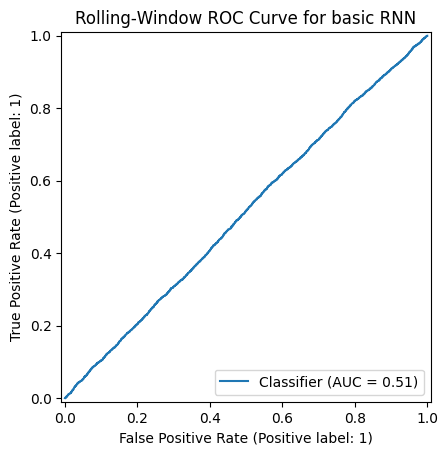

In [9]:
acc = accuracy_score(all_y_true, all_y_pred)
f1       = f1_score(all_y_true, all_y_pred)
auc      = roc_auc_score(all_y_true, all_y_proba)
cm       = confusion_matrix(all_y_true, all_y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")

print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(all_y_true, all_y_proba)
plt.title('Rolling‑Window ROC Curve for basic RNN')
plt.show()

## Best RNN Model
Single layer basic RNN, with optimal parameters determined by a random search autotuner.

In [10]:
def build_rnn_model(hp):
    model = Sequential([
        SimpleRNN(
            units=hp.Int('units', min_value=32, max_value=256, step=32),
            input_shape=(rolling_window, len(features))
        ),
        Dropout(hp.Float('dropout', 0.0, 0.5, step=0.1)),
        Dense(1, activation='sigmoid')
    ])
    model.compile(
        optimizer=Adam(hp.Choice('lr', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

class BacktestTuner(kt.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
        hp = trial.hyperparameters
        model = build_rnn_model(hp)
        year_accs = []

        for idx, year in enumerate(unique_years):
            year_test = test_df[test_df['Year']==year]
            if idx == 0:
                year_train = train_df
            else:
                cutoff = year_test['Date'].min()
                up_to = df[df['Date'] < cutoff]
                size = int(0.6 * len(up_to))
                year_train = up_to.iloc[:size]

            scaler = StandardScaler().fit(year_train[features])
            X_tr_s = scaler.transform(year_train[features])
            y_tr   = year_train['target'].values
            X_te_s = scaler.transform(year_test[features])
            y_te   = year_test['target'].values

            X_tr_seq, y_tr_seq = create_sequences(X_tr_s, y_tr, rolling_window)
            X_te_seq, y_te_seq = create_sequences(X_te_s, y_te, rolling_window)
            if X_tr_seq.size == 0 or X_te_seq.size == 0:
                continue

            model.fit(
                X_tr_seq, y_tr_seq,
                epochs=5, batch_size=32,
                verbose=1
            )

            y_pred = (model.predict(X_te_seq).ravel() > 0.5).astype(int)
            year_accs.append(accuracy_score(y_te_seq, y_pred))

        mean_acc = np.mean(year_accs) if year_accs else 0.0
        self.oracle.update_trial(trial.trial_id, {'val_accuracy': mean_acc})

tuner = BacktestTuner(
    hypermodel=build_rnn_model,
    objective=kt.Objective('val_accuracy', 'max'),
    max_trials=10,
    directory='rnn_backtest_tuner',
    project_name='rb_tuner'
)

tuner.search() 

Trial 10 Complete [00h 00m 17s]
val_accuracy: 0.5090488803197623

Best val_accuracy So Far: 0.5106159842681084
Total elapsed time: 00h 03m 27s


### Evaluation

In [11]:
best_hp    = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hp.values)
best_model = build_rnn_model(best_hp)

dev_df       = pd.concat([train_df, val_df], ignore_index=True)
scaler_dev   = StandardScaler().fit(dev_df[features])
X_dev_s      = scaler_dev.transform(dev_df[features])
y_dev        = dev_df['target'].values
X_dev_seq, y_dev_seq = create_sequences(X_dev_s, y_dev, rolling_window)

best_model.fit(
    X_dev_seq, y_dev_seq,
    epochs=5,       
    batch_size=32,
    verbose=1
)

X_test_s      = scaler_dev.transform(test_df[features])
y_test        = test_df['target'].values
X_test_seq, y_test_seq = create_sequences(X_test_s, y_test, rolling_window)

y_proba = best_model.predict(X_test_seq).ravel()
y_pred  = (y_proba > 0.5).astype(int)

{'units': 128, 'dropout': 0.1, 'lr': 0.0001}
Epoch 1/5


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5070 - loss: 0.6996
Epoch 2/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5096 - loss: 0.6964
Epoch 3/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5108 - loss: 0.6951
Epoch 4/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5063 - loss: 0.6955
Epoch 5/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5142 - loss: 0.6941
472/472 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step



Rolling‑Window RNN Results:
Accuracy: 0.5050
F1 Score:  0.5328
AUC‑ROC:   0.5061

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down            3360          3927
Actual Up              3537          4256


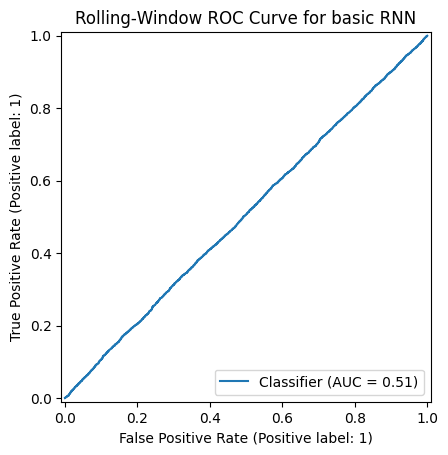

In [12]:
acc = accuracy_score(y_test_seq, y_pred)
f1  = f1_score(y_test_seq, y_pred)
auc = roc_auc_score(y_test_seq, y_proba)
cm  = confusion_matrix(y_test_seq, y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")

print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(y_test_seq, y_proba)
plt.title('Rolling‑Window ROC Curve for basic RNN')
plt.show()

## Deeper RNN
Experiment with stacking more RNN layers (varied from 2-4). More recurrent layers can potentially better learn the temporal dependencies between the input features.

In [13]:
def build_deep_rnn(hp):
    model = Sequential()
    n_layers = hp.Int('n_layers', 2, 4)
    for i in range(n_layers):
        units = hp.Int(f'units_{i}', 32, 256, step=32)
        return_seq = (i < n_layers-1)
        if i == 0:
            model.add(SimpleRNN(units,
                                return_sequences=return_seq,
                                input_shape=(rolling_window, len(features))))
        else:
            model.add(SimpleRNN(units, return_sequences=return_seq))
        model.add(Dropout(hp.Float(f'dropout_{i}', 0.0, 0.5, step=0.1)))

    model.add(Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=Adam(hp.Choice('lr', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

class DeepBacktestTuner(kt.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
        hp = trial.hyperparameters
        model = build_deep_rnn(hp)
        year_accs = []

        for idx, year in enumerate(unique_years):
            if idx == 0:
                year_train = train_df
            else:
                cutoff = test_df[test_df['Year']==year]['Date'].min()
                up_to  = df[df['Date'] < cutoff]
                size   = int(0.6 * len(up_to))
                year_train = up_to.iloc[:size]

            scaler = StandardScaler().fit(year_train[features])
            X_tr_s = scaler.transform(year_train[features])
            y_tr   = year_train['target'].values
            year_test = test_df[test_df['Year']==year]
            X_te_s = scaler.transform(year_test[features])
            y_te   = year_test['target'].values

            X_tr_seq, y_tr_seq = create_sequences(X_tr_s, y_tr, rolling_window)
            X_te_seq, y_te_seq = create_sequences(X_te_s, y_te, rolling_window)
            if len(X_tr_seq)==0 or len(X_te_seq)==0:
                continue

            model.fit(
                X_tr_seq, y_tr_seq,
                epochs=5, batch_size=32,
                verbose=1
            )

            preds = (model.predict(X_te_seq).ravel() > 0.5).astype(int)
            year_accs.append(accuracy_score(y_te_seq, preds))

        mean_acc = np.mean(year_accs) if year_accs else 0.0
        self.oracle.update_trial(trial.trial_id, {'val_accuracy': mean_acc})

tuner = DeepBacktestTuner(
    hypermodel=build_deep_rnn,
    objective=kt.Objective('val_accuracy','max'),
    max_trials=10,
    directory='rnn_backtest_tuner',
    project_name='deep_rnn_search'
)
tuner.search()


Trial 10 Complete [00h 01m 54s]
val_accuracy: 0.5048271797893874

Best val_accuracy So Far: 0.5173547234107971
Total elapsed time: 00h 14m 44s


### Evaluation
Get best model from tuner & retrain that model.

In [14]:
best_hp    = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hp.values)
best_model = build_deep_rnn(best_hp)

dev_df       = pd.concat([train_df, val_df], ignore_index=True)
scaler_dev   = StandardScaler().fit(dev_df[features])
X_dev_s      = scaler_dev.transform(dev_df[features])
y_dev        = dev_df['target'].values
X_dev_seq, y_dev_seq = create_sequences(X_dev_s, y_dev, rolling_window)

best_model.fit(
    X_dev_seq, y_dev_seq,
    epochs=5,          # same as in your tuner
    batch_size=32,
    verbose=1
)

X_test_s      = scaler_dev.transform(test_df[features])
y_test        = test_df['target'].values
X_test_seq, y_test_seq = create_sequences(X_test_s, y_test, rolling_window)

y_proba = best_model.predict(X_test_seq).ravel()
y_pred  = (y_proba > 0.5).astype(int)

{'n_layers': 4, 'units_0': 96, 'dropout_0': 0.2, 'units_1': 192, 'dropout_1': 0.2, 'lr': 0.01, 'units_2': 32, 'dropout_2': 0.1, 'units_3': 192, 'dropout_3': 0.1}
Epoch 1/5


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1886/1886 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.5006 - loss: 0.7346
Epoch 2/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.5066 - loss: 0.7208
Epoch 3/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.4997 - loss: 0.7246
Epoch 4/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.5053 - loss: 0.7296
Epoch 5/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.5064 - loss: 0.7298
472/472 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step



Rolling‑Window RNN Results:
Accuracy: 0.5017
F1 Score:  0.5655
AUC‑ROC:   0.4992

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down            2674          4613
Actual Up              2902          4891


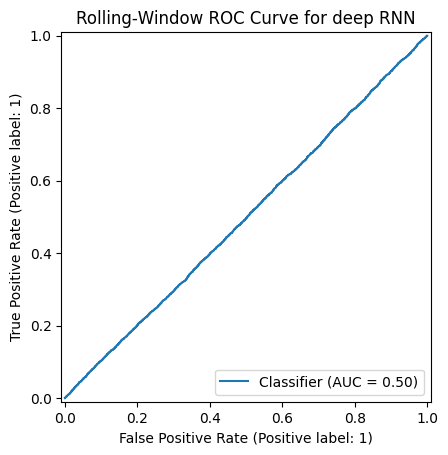

In [15]:
acc = accuracy_score(y_test_seq, y_pred)
f1  = f1_score(y_test_seq, y_pred)
auc = roc_auc_score(y_test_seq, y_proba)
cm  = confusion_matrix(y_test_seq, y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")

print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(y_test_seq, y_proba)
plt.title('Rolling‑Window ROC Curve for deep RNN')
plt.show()

## RNN with more Dense Layers
Attempt to add more dense layers after RNN layers to learn/represent more complex decision boundaries over the vector space before we squash it via sigmoid and output the final classification.

In [16]:
def build_rnn_with_dense(hp):
    model = Sequential()
    model.add(SimpleRNN(
        units=hp.Int('rnn_units', 32, 256, step=32),
        input_shape=(rolling_window, len(features))
    ))
    model.add(Dropout(hp.Float('dropout_rnn', 0.0, 0.5, step=0.1)))
    n_dense = hp.Int('n_dense', 1, 3)
    for i in range(n_dense):
        model.add(Dense(
            units=hp.Int(f'dense_units_{i}', 16, 128, step=16),
            activation=hp.Choice(f'dense_act_{i}', ['relu','tanh'])
        ))
        model.add(Dropout(hp.Float(f'dropout_dense_{i}', 0.0, 0.5, step=0.1)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=Adam(hp.Choice('lr', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

class DenseBacktestTuner(kt.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
        hp = trial.hyperparameters
        model = build_rnn_with_dense(hp)
        accs = []

        for idx, year in enumerate(unique_years):
            if idx == 0:
                year_train = train_df
            else:
                cutoff     = test_df[test_df['Year']==year]['Date'].min()
                up_to      = df[df['Date'] < cutoff]
                size       = int(0.6 * len(up_to))
                year_train = up_to.iloc[:size]

            scaler = StandardScaler().fit(year_train[features])
            X_tr_s = scaler.transform(year_train[features])
            y_tr   = year_train['target'].values
            year_test = test_df[test_df['Year']==year]
            X_te_s    = scaler.transform(year_test[features])
            y_te      = year_test['target'].values

            X_tr_seq, y_tr_seq = create_sequences(X_tr_s, y_tr, rolling_window)
            X_te_seq, y_te_seq = create_sequences(X_te_s, y_te, rolling_window)
            if len(X_tr_seq)==0 or len(X_te_seq)==0:
                continue

            model.fit(X_tr_seq, y_tr_seq, epochs=5, batch_size=32, verbose=1)
            preds = (model.predict(X_te_seq).ravel() > 0.5).astype(int)
            accs.append(accuracy_score(y_te_seq, preds))

        mean_acc = np.mean(accs) if accs else 0.0
        self.oracle.update_trial(trial.trial_id, {'val_accuracy': mean_acc})

tuner = DenseBacktestTuner(
    hypermodel=build_rnn_with_dense,
    objective=kt.Objective('val_accuracy','max'),
    max_trials=12,
    directory='dense_backtest_tuner',
    project_name='rnn_dense_search'
)
tuner.search()

Trial 12 Complete [00h 00m 16s]
val_accuracy: 0.5058352443055164

Best val_accuracy So Far: 0.5081690858079889
Total elapsed time: 00h 04m 53s


### Evaluation

In [17]:
best_hp    = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hp.values)
best_model = build_rnn_with_dense(best_hp)

dev_df       = pd.concat([train_df, val_df], ignore_index=True)
scaler_dev   = StandardScaler().fit(dev_df[features])
X_dev_s      = scaler_dev.transform(dev_df[features])
y_dev        = dev_df['target'].values
X_dev_seq, y_dev_seq = create_sequences(X_dev_s, y_dev, rolling_window)

best_model.fit(
    X_dev_seq, y_dev_seq,
    epochs=5,       
    batch_size=32,
    verbose=1
)

X_test_s      = scaler_dev.transform(test_df[features])
y_test        = test_df['target'].values
X_test_seq, y_test_seq = create_sequences(X_test_s, y_test, rolling_window)

y_proba = best_model.predict(X_test_seq).ravel()
y_pred  = (y_proba > 0.5).astype(int)

{'rnn_units': 32, 'dropout_rnn': 0.30000000000000004, 'n_dense': 1, 'dense_units_0': 80, 'dense_act_0': 'tanh', 'dropout_dense_0': 0.2, 'lr': 0.0001, 'dense_units_1': 16, 'dense_act_1': 'relu', 'dropout_dense_1': 0.2, 'dense_units_2': 32, 'dense_act_2': 'tanh', 'dropout_dense_2': 0.0}
Epoch 1/5


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - accuracy: 0.5080 - loss: 0.7028
Epoch 2/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5011 - loss: 0.6987
Epoch 3/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5044 - loss: 0.6977
Epoch 4/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5048 - loss: 0.6964
Epoch 5/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5138 - loss: 0.6944
472/472 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step



Rolling‑Window RNN Results:
Accuracy: 0.5165
F1 Score:  0.6706
AUC‑ROC:   0.5098

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down             369          6918
Actual Up               373          7420


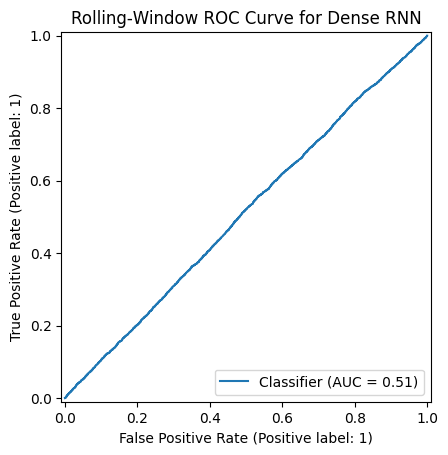

In [18]:

acc = accuracy_score(y_test_seq, y_pred)
f1  = f1_score(y_test_seq, y_pred)
auc = roc_auc_score(y_test_seq, y_proba)
cm  = confusion_matrix(y_test_seq, y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")

print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(y_test_seq, y_proba)
plt.title('Rolling‑Window ROC Curve for Dense RNN')
plt.show()

## RNN with Normalization
Normalizes all elements in hidden-state vectors across its features before activation function. Helps prevents neurons from drifting too far into the extremes of the activation function, helping to reduce vanishing/exploding gradient issues.

In [19]:
def build_rnn_with_norm(hp):
    model = Sequential()
    # -- single RNN layer --
    model.add(SimpleRNN(
        units=hp.Int('rnn_units', 32, 256, step=32),
        input_shape=(rolling_window, len(features))
    ))
    model.add(Dropout(hp.Float('dropout_rnn', 0.0, 0.5, step=0.1)))
    model.add(LayerNormalization())

    # -- tunable dense layers on top --
    n_dense = hp.Int('n_dense', 1, 3)
    for i in range(n_dense):
        model.add(Dense(
            units=hp.Int(f'dense_units_{i}', 16, 128, step=16),
            activation=hp.Choice(f'dense_act_{i}', ['relu','tanh'])
        ))
        model.add(Dropout(hp.Float(f'dropout_dense_{i}', 0.0, 0.5, step=0.1)))

    # -- output layer --
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(hp.Choice('lr', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

# ── 2) Custom backtest tuner ──
class NormBacktestTuner(kt.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
        hp = trial.hyperparameters
        model = build_rnn_with_norm(hp)
        year_accs = []

        for idx, year in enumerate(unique_years):
            # select train slice
            if idx == 0:
                year_train = train_df
            else:
                cutoff     = test_df[test_df['Year']==year]['Date'].min()
                up_to      = df[df['Date'] < cutoff]
                size       = int(0.6 * len(up_to))
                year_train = up_to.iloc[:size]

            # scale
            scaler = StandardScaler().fit(year_train[features])
            X_tr_s = scaler.transform(year_train[features])
            y_tr   = year_train['target'].values

            year_test = test_df[test_df['Year']==year]
            X_te_s = scaler.transform(year_test[features])
            y_te   = year_test['target'].values

            # sequences
            X_tr_seq, y_tr_seq = create_sequences(X_tr_s, y_tr, rolling_window)
            X_te_seq, y_te_seq = create_sequences(X_te_s, y_te, rolling_window)
            if len(X_tr_seq)==0 or len(X_te_seq)==0:
                continue

            # train quietly
            model.fit(
                X_tr_seq, y_tr_seq,
                epochs=10, batch_size=32,
                verbose=1
            )

            # evaluate this year
            preds = (model.predict(X_te_seq).ravel() > 0.5).astype(int)
            year_accs.append(accuracy_score(y_te_seq, preds))

        mean_acc = np.mean(year_accs) if year_accs else 0.0
        # report mean accuracy over years
        self.oracle.update_trial(trial.trial_id, {'val_accuracy': mean_acc})

# ── 3) Run the tuner ──
tuner = NormBacktestTuner(
    hypermodel=build_rnn_with_norm,
    objective=kt.Objective('val_accuracy', 'max'),
    max_trials=12,
    directory='norm_backtest_tuner',
    project_name='rnn_norm_search'
)
tuner.search()

Trial 12 Complete [00h 00m 56s]
val_accuracy: 0.5073137923082836

Best val_accuracy So Far: 0.5073137923082836
Total elapsed time: 00h 13m 44s


### Evaluation

In [20]:
best_hp    = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hp.values)
best_model = build_rnn_with_norm(best_hp)

dev_df       = pd.concat([train_df, val_df], ignore_index=True)
scaler_dev   = StandardScaler().fit(dev_df[features])
X_dev_s      = scaler_dev.transform(dev_df[features])
y_dev        = dev_df['target'].values
X_dev_seq, y_dev_seq = create_sequences(X_dev_s, y_dev, rolling_window)

best_model.fit(
    X_dev_seq, y_dev_seq,
    epochs=5,       
    batch_size=32,
    verbose=1
)

X_test_s      = scaler_dev.transform(test_df[features])
y_test        = test_df['target'].values
X_test_seq, y_test_seq = create_sequences(X_test_s, y_test, rolling_window)

y_proba = best_model.predict(X_test_seq).ravel()
y_pred  = (y_proba > 0.5).astype(int)

{'rnn_units': 160, 'dropout_rnn': 0.4, 'n_dense': 1, 'dense_units_0': 48, 'dense_act_0': 'tanh', 'dropout_dense_0': 0.2, 'lr': 0.0001, 'dense_units_1': 112, 'dense_act_1': 'relu', 'dropout_dense_1': 0.30000000000000004, 'dense_units_2': 48, 'dense_act_2': 'relu', 'dropout_dense_2': 0.0}
Epoch 1/5


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1886/1886 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.4993 - loss: 0.7534
Epoch 2/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4998 - loss: 0.7246
Epoch 3/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5042 - loss: 0.7151
Epoch 4/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5000 - loss: 0.7076
Epoch 5/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5048 - loss: 0.7040
472/472 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step



Rolling‑Window RNN Results:
Accuracy: 0.5001
F1 Score:  0.5190
AUC‑ROC:   0.4983

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down            3476          3811
Actual Up              3727          4066


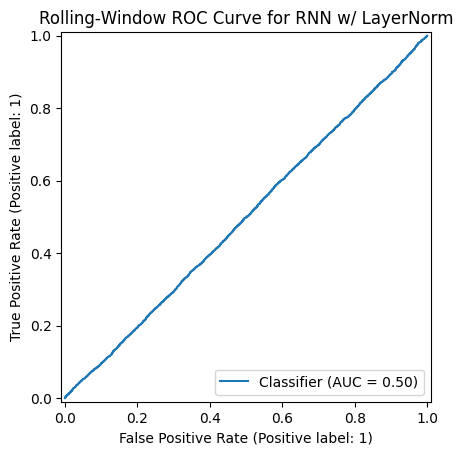

In [21]:
acc = accuracy_score(y_test_seq, y_pred)
f1  = f1_score(y_test_seq, y_pred)
auc = roc_auc_score(y_test_seq, y_proba)
cm  = confusion_matrix(y_test_seq, y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")

print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(y_test_seq, y_proba)
plt.title('Rolling‑Window ROC Curve for RNN w/ LayerNorm')
plt.show()

## RNN with gradient clipping
Attempt to deal with exploding gradients during backpropagation (if any). Improves stability when training with larger learning rates.

In [22]:
def build_clip_rnn(hp):
    model = Sequential([
        SimpleRNN(
            units=hp.Int('units', 32, 256, step=32),
            input_shape=(rolling_window, len(features))
        ),
        Dense(1, activation='sigmoid'),
    ])
    lr = hp.Choice('lr', [5e-1, 1e-1, 1e-2, 1e-3, 1e-4])
    clipnorm = hp.Float('clipnorm', 0.0, 2.0, step=0.5)
    if clipnorm > 0:
        optimizer = Adam(learning_rate=lr, clipnorm=clipnorm)
    else:
        optimizer = Adam(learning_rate=lr)
    model.compile(
        optimizer=optimizer,
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

# ── 4) Custom backtest tuner (per‑year rolling backtest) ──
class ClipBacktestTuner(kt.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
        hp    = trial.hyperparameters
        model = build_clip_rnn(hp)
        accs  = []

        for idx, year in enumerate(unique_years):
            # build year_train
            if idx == 0:
                year_train = train_df
            else:
                cutoff     = test_df[test_df['Year']==year]['Date'].min()
                up_to      = df[df['Date'] < cutoff]
                size       = int(0.6 * len(up_to))
                year_train = up_to.iloc[:size]

            # scale features
            scaler = StandardScaler().fit(year_train[features])
            X_tr_s = scaler.transform(year_train[features])
            y_tr   = year_train['target'].values

            year_test = test_df[test_df['Year']==year]
            X_te_s    = scaler.transform(year_test[features])
            y_te      = year_test['target'].values

            # create sequences
            X_tr_seq, y_tr_seq = create_sequences(X_tr_s, y_tr, rolling_window)
            X_te_seq, y_te_seq = create_sequences(X_te_s, y_te, rolling_window)
            if not len(X_tr_seq) or not len(X_te_seq):
                continue

            # train & evaluate quietly
            model.fit(
                X_tr_seq, y_tr_seq,
                epochs=5, batch_size=32,
                verbose=1
            )
            preds = (model.predict(X_te_seq).ravel() > 0.5).astype(int)
            accs.append(accuracy_score(y_te_seq, preds))

        mean_acc = np.mean(accs) if accs else 0.0
        self.oracle.update_trial(trial.trial_id, {'val_accuracy': mean_acc})

# ── 5) Run the tuner ──
tuner = ClipBacktestTuner(
    hypermodel=build_clip_rnn,
    objective=kt.Objective('val_accuracy','max'),
    max_trials=10,
    directory='clip_rnn_tuner',
    project_name='clip_backtest'
)
tuner.search()

Trial 10 Complete [00h 00m 21s]
val_accuracy: 0.5034311025135155

Best val_accuracy So Far: 0.5201497604345486
Total elapsed time: 00h 04m 21s


### Evaluation

In [23]:
best_hp    = tuner.get_best_hyperparameters(num_trials=1)[0]
print(best_hp.values)
best_model = build_clip_rnn(best_hp)

dev_df       = pd.concat([train_df, val_df], ignore_index=True)
scaler_dev   = StandardScaler().fit(dev_df[features])
X_dev_s      = scaler_dev.transform(dev_df[features])
y_dev        = dev_df['target'].values
X_dev_seq, y_dev_seq = create_sequences(X_dev_s, y_dev, rolling_window)

best_model.fit(
    X_dev_seq, y_dev_seq,
    epochs=5,       
    batch_size=32,
    verbose=1
)

X_test_s      = scaler_dev.transform(test_df[features])
y_test        = test_df['target'].values
X_test_seq, y_test_seq = create_sequences(X_test_s, y_test, rolling_window)

y_proba = best_model.predict(X_test_seq).ravel()
y_pred  = (y_proba > 0.5).astype(int)

{'units': 192, 'lr': 0.1, 'clipnorm': 1.5}
Epoch 1/5


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1886/1886 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.4983 - loss: 1.0837
Epoch 2/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.4975 - loss: 1.2144
Epoch 3/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.4974 - loss: 1.3663
Epoch 4/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4924 - loss: 1.2027
Epoch 5/5
1886/1886 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4978 - loss: 1.4825
472/472 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step



Rolling‑Window RNN Results:
Accuracy: 0.5168
F1 Score:  0.6814
AUC‑ROC:   0.5012

Confusion Matrix:
             Predicted Down  Predicted Up
Actual Down               0          7287
Actual Up                 0          7793


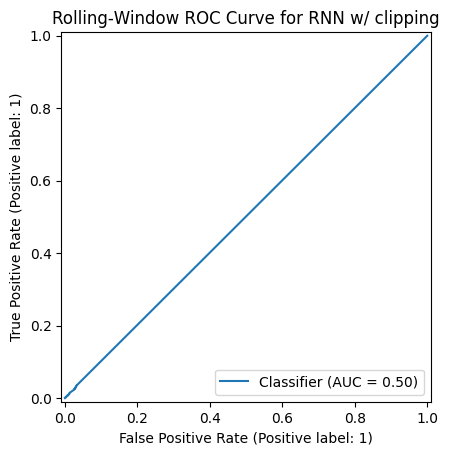

In [24]:
acc = accuracy_score(y_test_seq, y_pred)
f1  = f1_score(y_test_seq, y_pred)
auc = roc_auc_score(y_test_seq, y_proba)
cm  = confusion_matrix(y_test_seq, y_pred)

print("\nRolling‑Window RNN Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"AUC‑ROC:   {auc:.4f}\n")
print("Confusion Matrix:")
print(pd.DataFrame(
    cm,
    index=['Actual Down','Actual Up'],
    columns=['Predicted Down','Predicted Up']
))

RocCurveDisplay.from_predictions(y_test_seq, y_proba)
plt.title('Rolling‑Window ROC Curve for RNN w/ clipping')
plt.show()

## RNN With individual stocks
This was trained with an older version of the RNN model, where we wanted to explore if training the models on individual stocks yield any significant difference. This RNN model uses a static 60/20/20 split rather than the rolling window back test used in the final iteration.

This RNN also uses default untuned/un-optimized parameters.

Loaded data with 75500 records.
Data sorted by 'Date' and 'index'.
           Date   index    Open    High     Low   Close     Volume  OpenInt  \
0    2011-01-03   45725  41.600  42.293  41.600  42.204  123930383        0   
1510 2011-01-03  123841  19.549  19.549  19.338  19.358   22577420        0   
3020 2011-01-03  220493  30.830  31.480  30.790  31.290    6245382        0   
4530 2011-01-03  692217   8.440   8.550   8.390   8.470   21152390        0   
6040 2011-01-03  711850  48.320  49.242  48.276  48.599    6232990        0   

     ticker  
0      AAPL  
1510    ABT  
3020   ADBE  
4530    AMD  
6040   AMGN  
Processing all tickers:
 ['AAPL' 'ABT' 'ADBE' 'AMD' 'AMGN' 'AMZN' 'AXP' 'BAC' 'BSX' 'C' 'CAT'
 'CMCSA' 'COST' 'CSCO' 'CVX' 'DHR' 'DIS' 'GE' 'GOOGL' 'GS' 'HD' 'HON'
 'IBM' 'INTU' 'JNJ' 'JPM' 'KO' 'LLY' 'MCD' 'MRK' 'MSFT' 'NVDA' 'ORCL'
 'PEP' 'PFE' 'PG' 'PGR' 'QCOM' 'SMFG' 'SPGI' 'SYK' 'T' 'TMO' 'TXN' 'UNH'
 'UNP' 'VZ' 'WFC' 'WMT' 'XOM']

Processing ticker: AAPL
Ticker: AAP

c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 3.6763e-04 - loss: 0.6887 - val_accuracy: 0.0000e+00 - val_loss: 0.8871
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.6381 - val_accuracy: 0.0000e+00 - val_loss: 1.2666
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.5780 - val_accuracy: 0.0000e+00 - val_loss: 0.7401
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.5410 - val_accuracy: 0.0033 - val_loss: 0.6889
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.5222 - val_accuracy: 0.0033 - val_loss: 0.6314
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5240 - val_accuracy: 0.0033 - val_loss: 0.6116
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5224 - val_accuracy: 0.0033 - val_loss: 0.5961
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5188 - val_accuracy: 0

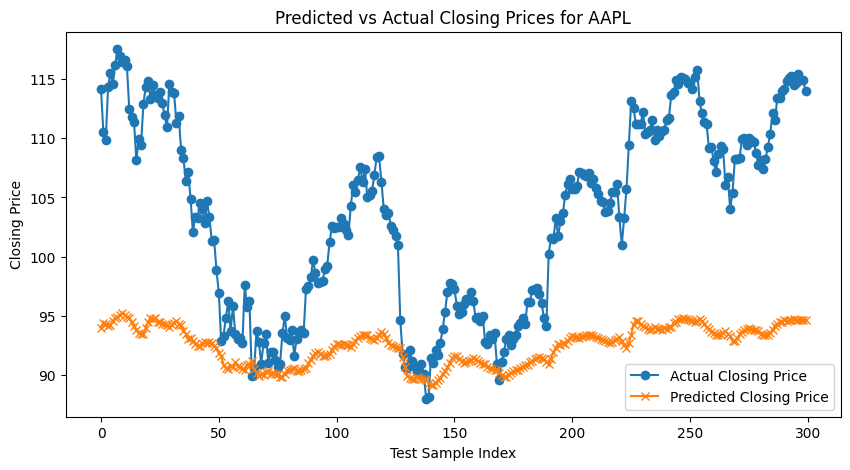

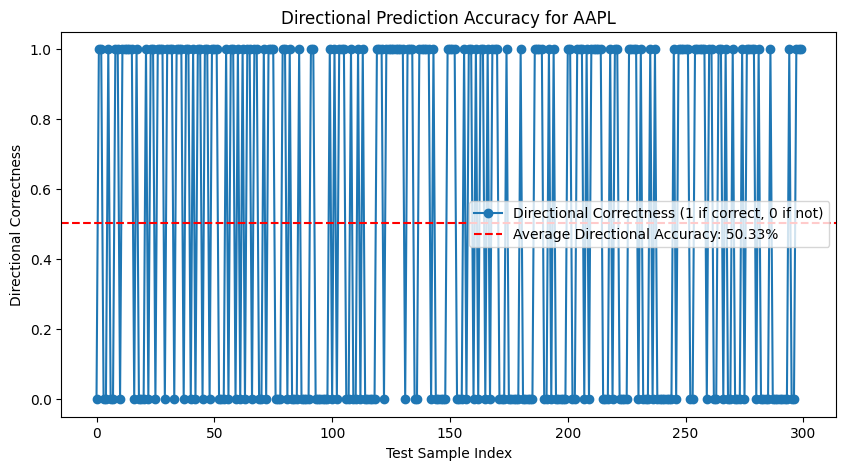

ROC AUC for AAPL: 0.57


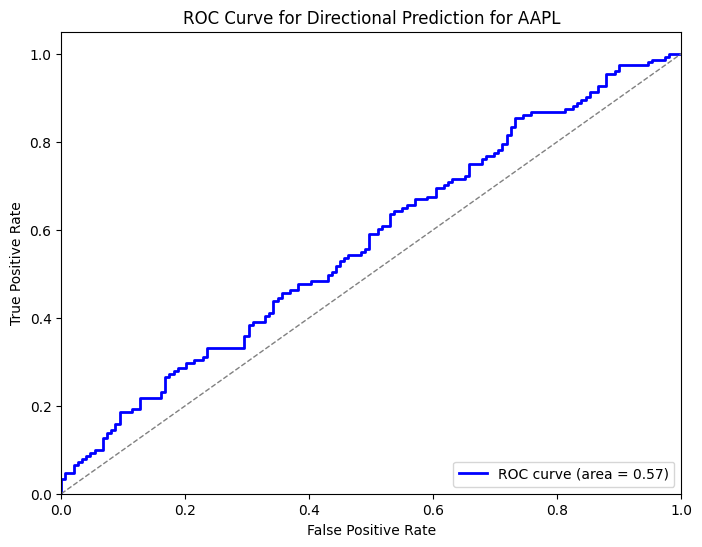


Processing ticker: ABT
Ticker: ABT - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.0026 - loss: 0.6889 - val_accuracy: 0.0000e+00 - val_loss: 0.8472
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.6430 - val_accuracy: 0.0033 - val_loss: 0.6299
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.5544 - val_accuracy: 0.0033 - val_loss: 0.6062
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5489 - val_accuracy: 0.0033 - val_loss: 0.5546
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5524 - val_accuracy: 0.0033 - val_loss: 0.5297
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5544 - val_accuracy: 0.0033 - val_loss: 0.5200
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.5553 - val_accuracy: 0.0033 - val_loss: 0.5199
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 0.5534 - val_accuracy: 0.0033 - val_

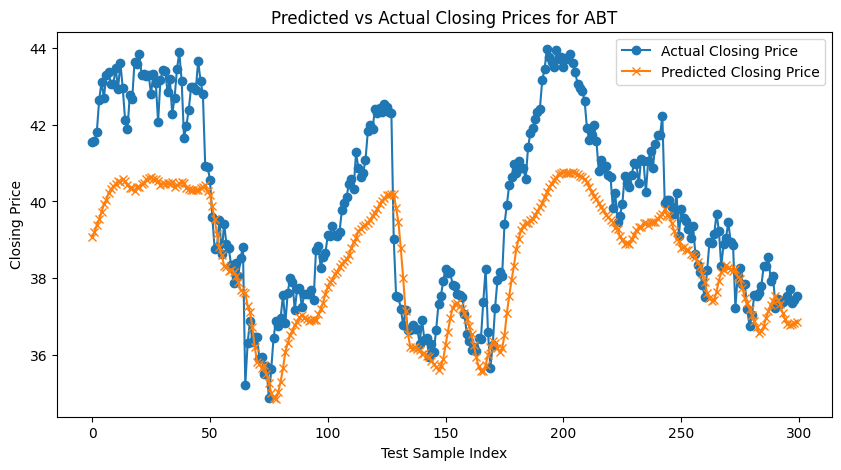

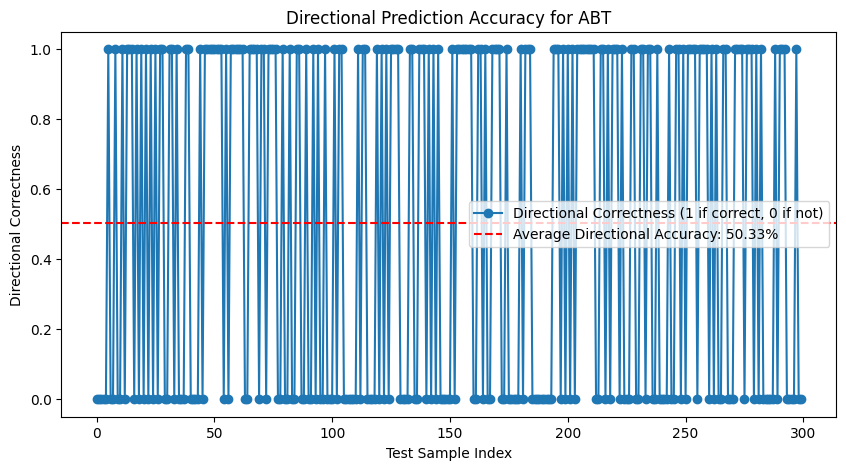

ROC AUC for ABT: 0.54


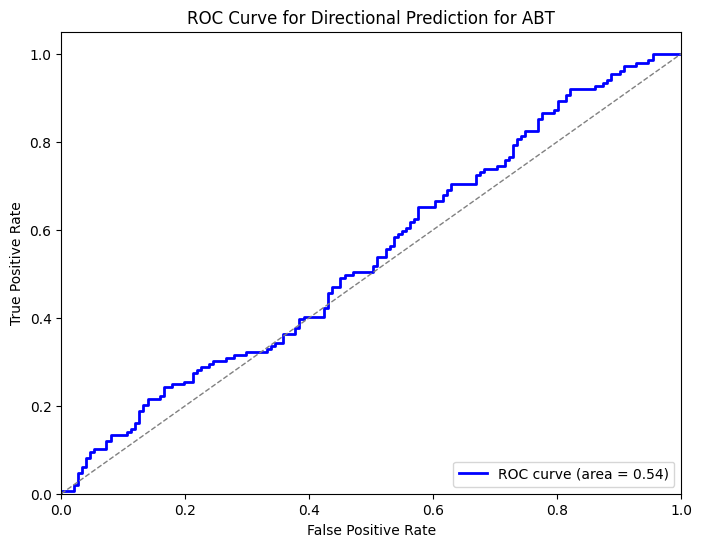


Processing ticker: ADBE
Ticker: ADBE - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 7.7783e-04 - loss: 0.6700 - val_accuracy: 0.0000e+00 - val_loss: 1.1087
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.0839e-04 - loss: 0.5894 - val_accuracy: 0.0000e+00 - val_loss: 0.9029
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.4746 - val_accuracy: 0.0000e+00 - val_loss: 0.7270
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.4571 - val_accuracy: 0.0000e+00 - val_loss: 0.7055
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.4604 - val_accuracy: 0.0000e+00 - val_loss: 0.6884
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.4645 - val_accuracy: 0.0000e+00 - val_loss: 0.6863
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.4328e-04 - loss: 0.4609 - val_accuracy: 0.0000e+00 - val_loss: 0.6810
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.45

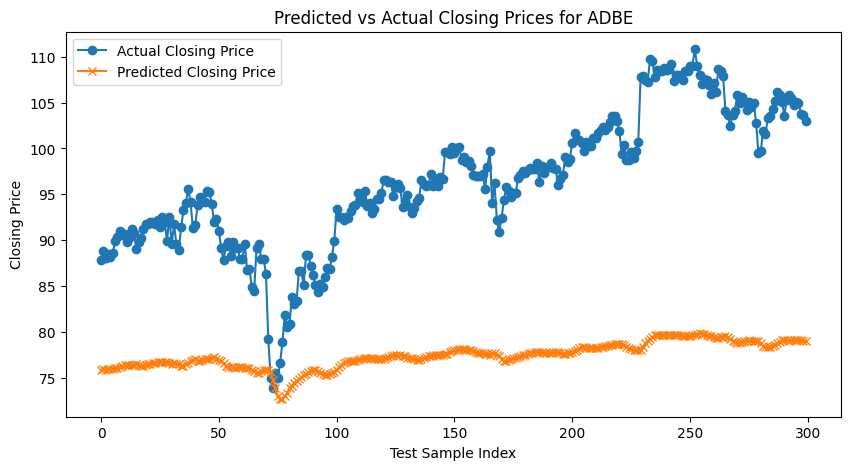

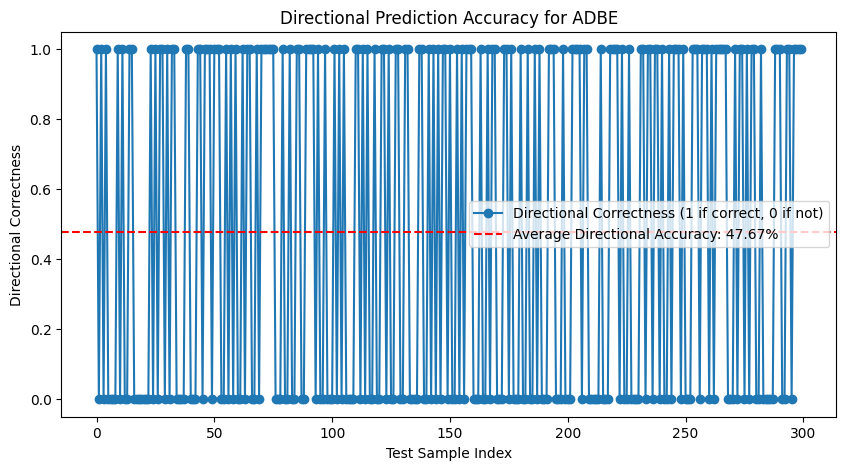

ROC AUC for ADBE: 0.59


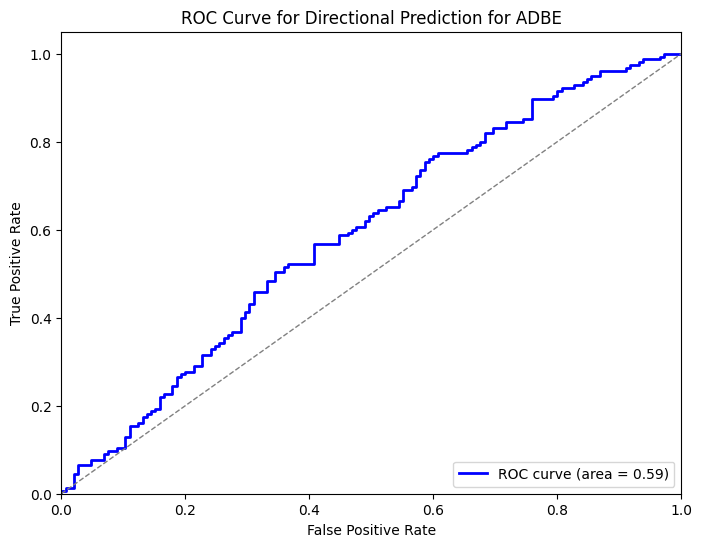


Processing ticker: AMD
Ticker: AMD - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0000e+00 - loss: 0.6898 - val_accuracy: 0.0033 - val_loss: 0.6296
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.6606 - val_accuracy: 0.0033 - val_loss: 0.4097
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.5690 - val_accuracy: 0.0033 - val_loss: 0.2855
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.5535 - val_accuracy: 0.0033 - val_loss: 0.2889
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.5547 - val_accuracy: 0.0033 - val_loss: 0.2856
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.5512 - val_accuracy: 0.0033 - val_loss: 0.2838
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.5422 - val_accuracy: 0.0033 - val_loss: 0.2847
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.5398 - val_accurac

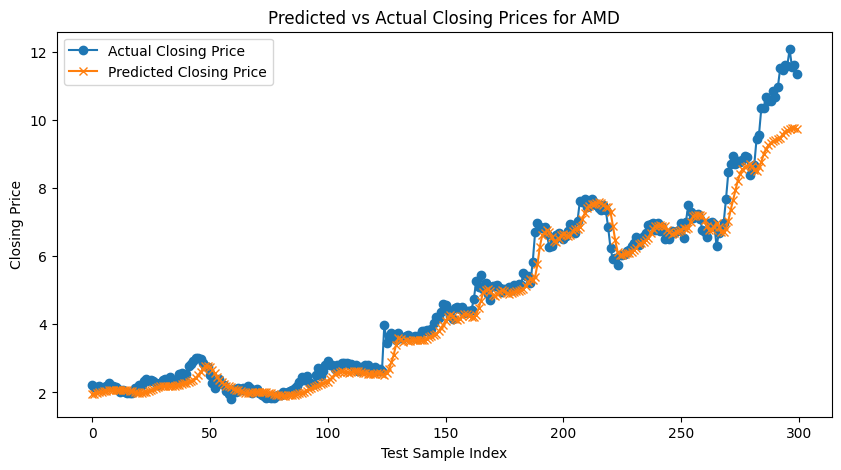

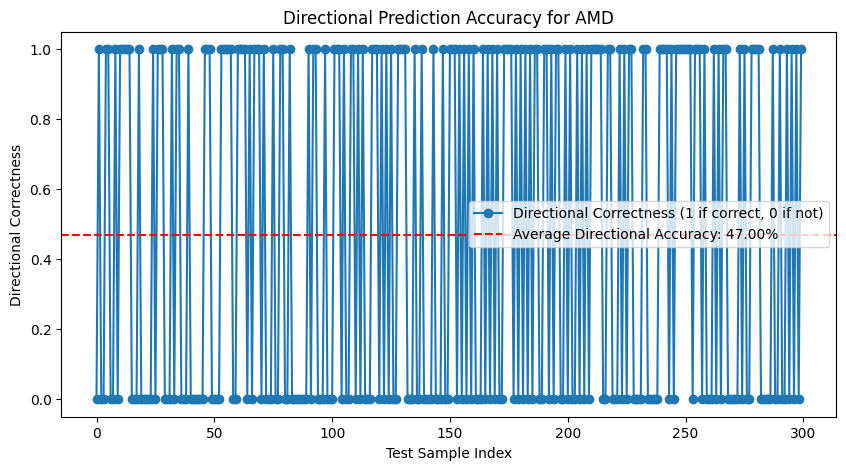

ROC AUC for AMD: 0.54


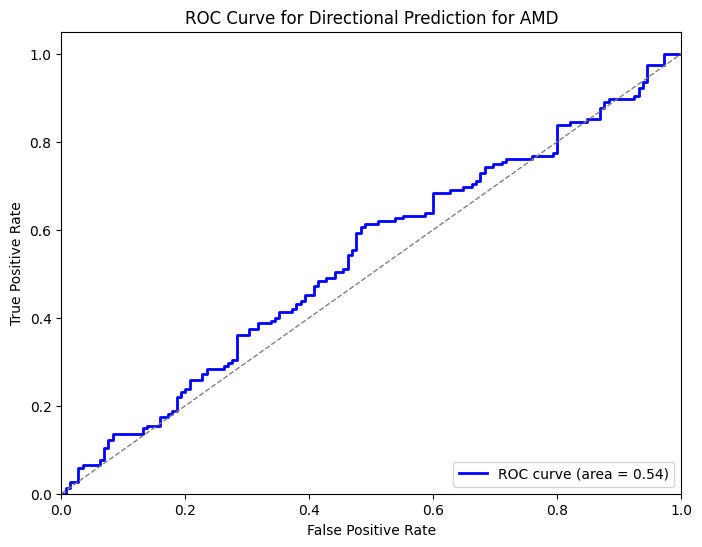


Processing ticker: AMGN
Ticker: AMGN - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0015 - loss: 0.6645 - val_accuracy: 0.0000e+00 - val_loss: 0.9235
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0015 - loss: 0.5176 - val_accuracy: 0.0000e+00 - val_loss: 0.7071
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0011 - loss: 0.5001 - val_accuracy: 0.0000e+00 - val_loss: 0.6663
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.8992e-04 - loss: 0.5079 - val_accuracy: 0.0000e+00 - val_loss: 0.6669
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.0839e-04 - loss: 0.4971 - val_accuracy: 0.0000e+00 - val_loss: 0.6526
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3237e-04 - loss: 0.5134 - val_accuracy: 0.0000e+00 - val_loss: 0.6480
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.1128e-04 - loss: 0.5122 - val_accuracy: 0.0000e+00 - val_loss: 0.6371
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0042 - loss: 0.5004 -

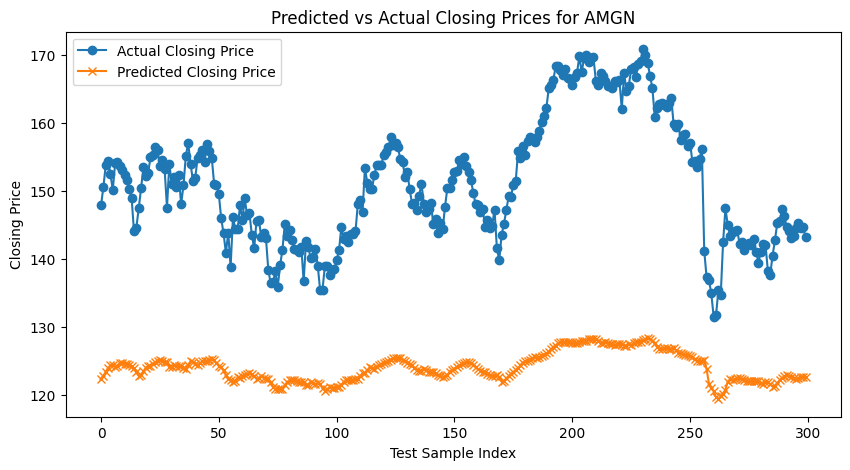

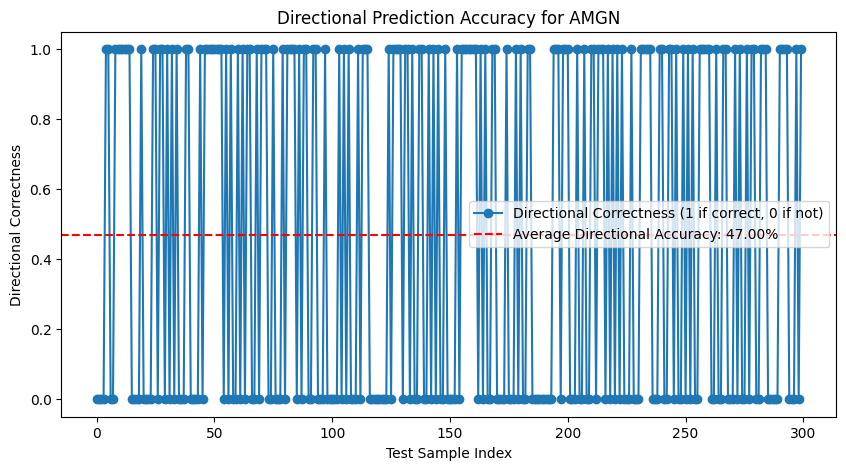

ROC AUC for AMGN: 0.55


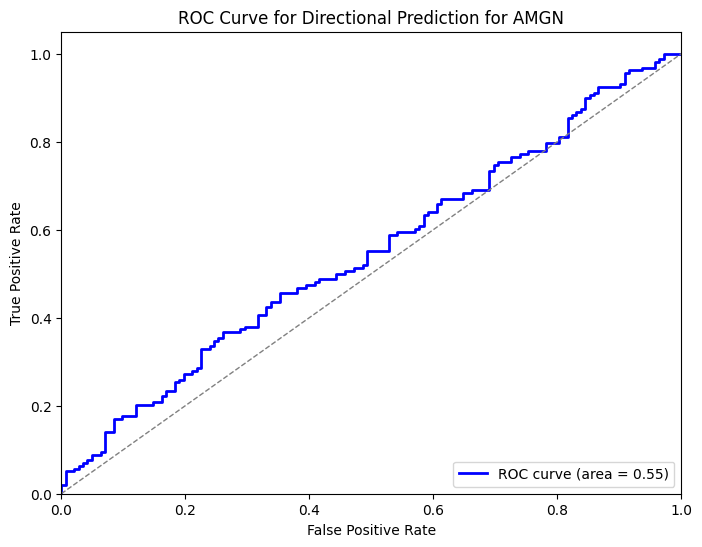


Processing ticker: AMZN
Ticker: AMZN - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 5.8201e-04 - loss: 0.6732 - val_accuracy: 0.0000e+00 - val_loss: 0.6801
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4986e-04 - loss: 0.5274 - val_accuracy: 0.0000e+00 - val_loss: 0.9130
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4986e-04 - loss: 0.4482 - val_accuracy: 0.0000e+00 - val_loss: 0.8129
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.4001 - val_accuracy: 0.0000e+00 - val_loss: 0.6526
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 2.7499e-04 - loss: 0.3767 - val_accuracy: 0.0000e+00 - val_loss: 0.6746
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 5.8201e-04 - loss: 0.3744 - val_accuracy: 0.0000e+00 - val_loss: 0.6649
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.3818 - val_accuracy: 0.0000e+00 - val_loss: 0.6643
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0013 - loss: 

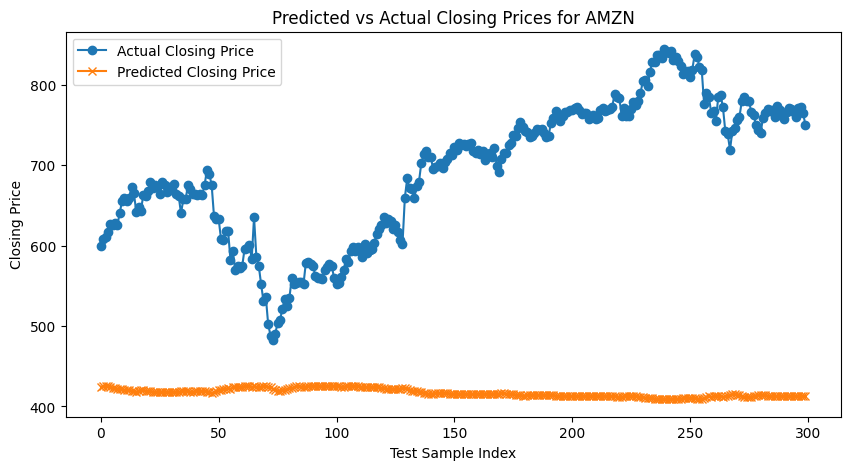

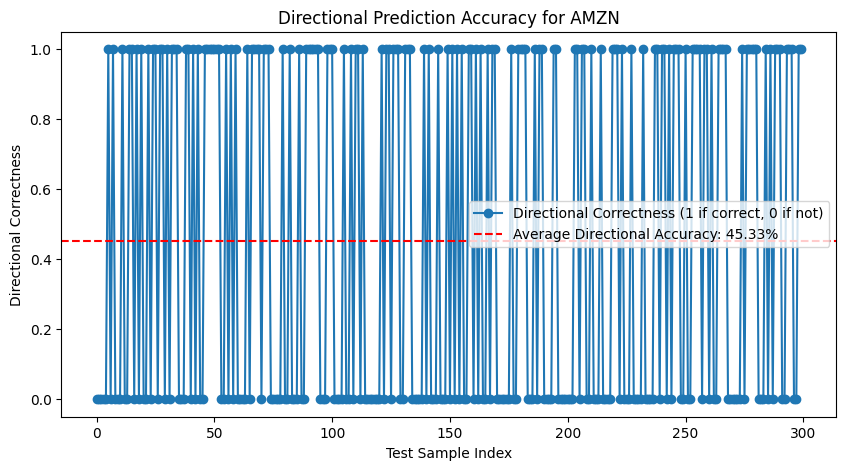

ROC AUC for AMZN: 0.54


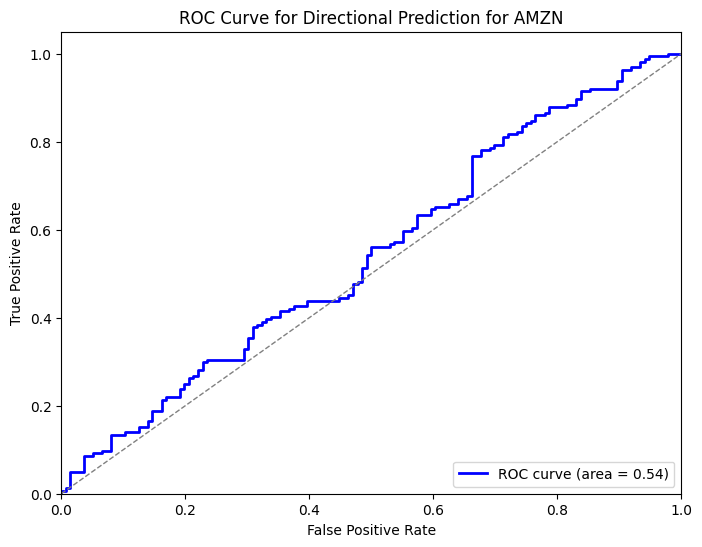


Processing ticker: AXP
Ticker: AXP - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.0017 - loss: 0.6944 - val_accuracy: 0.0000e+00 - val_loss: 0.6192
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0010 - loss: 0.6297 - val_accuracy: 0.0000e+00 - val_loss: 0.5298
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.5083 - val_accuracy: 0.0000e+00 - val_loss: 0.5216
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.4862 - val_accuracy: 0.0000e+00 - val_loss: 0.5216
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0021 - loss: 0.4855 - val_accuracy: 0.0000e+00 - val_loss: 0.5216
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0025 - loss: 0.4800 - val_accuracy: 0.0000e+00 - val_loss: 0.5165
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0038 - loss: 0.4896 - val_accuracy: 0.0000e+00 - val_loss: 0.5158
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0017 - loss: 0.4800 - val_accuracy: 0

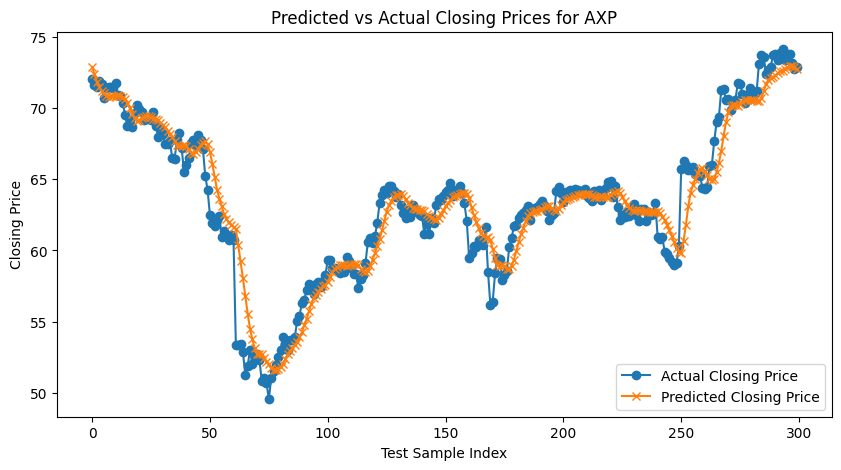

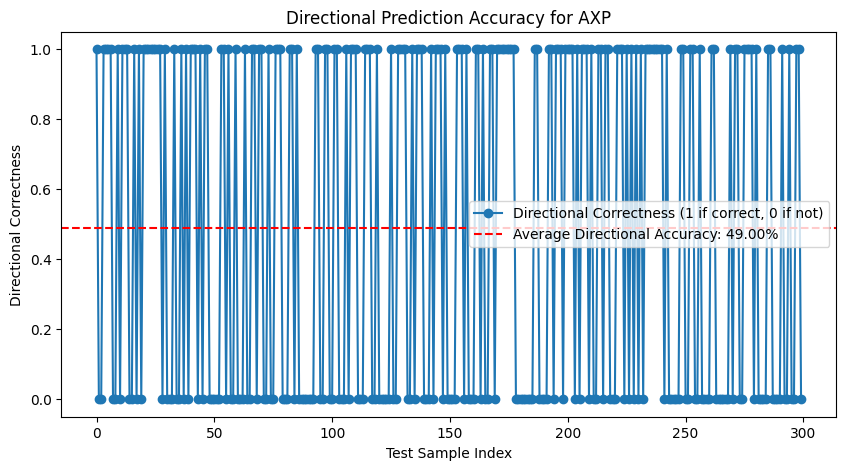

ROC AUC for AXP: 0.48


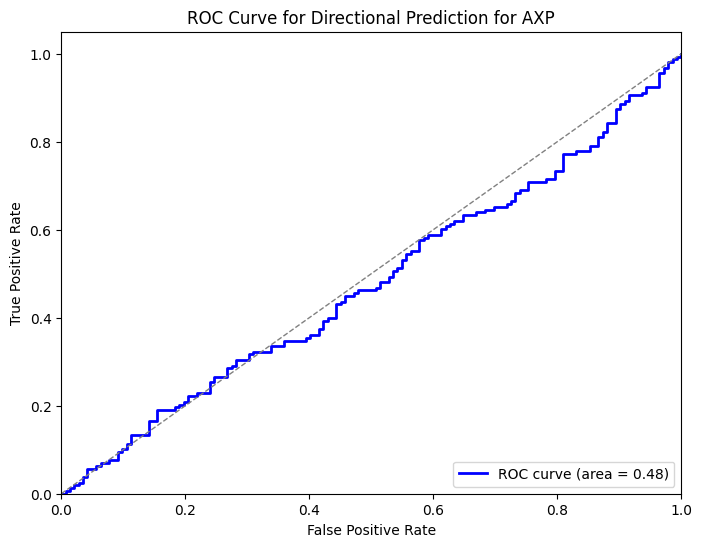


Processing ticker: BAC
Ticker: BAC - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0031 - loss: 0.6841 - val_accuracy: 0.0000e+00 - val_loss: 0.7497
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 6.4328e-04 - loss: 0.6307 - val_accuracy: 0.0000e+00 - val_loss: 0.6776
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3237e-04 - loss: 0.5734 - val_accuracy: 0.0000e+00 - val_loss: 0.6763
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 5.2414e-04 - loss: 0.5727 - val_accuracy: 0.0000e+00 - val_loss: 0.6703
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.5690 - val_accuracy: 0.0000e+00 - val_loss: 0.6667
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 4.1723e-04 - loss: 0.5744 - val_accuracy: 0.0000e+00 - val_loss: 0.6650
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 8.5224e-04 - loss: 0.5722 - val_accuracy: 0.0000e+00 - val_loss: 0.6660
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 4.1723e-04 - loss: 

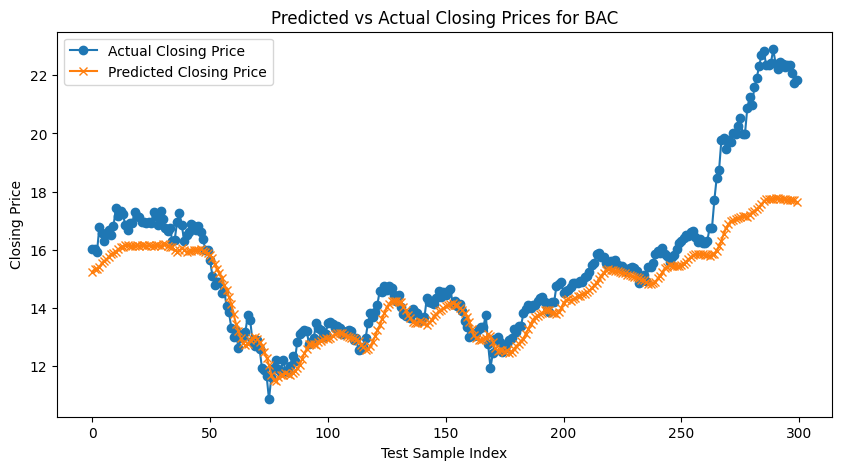

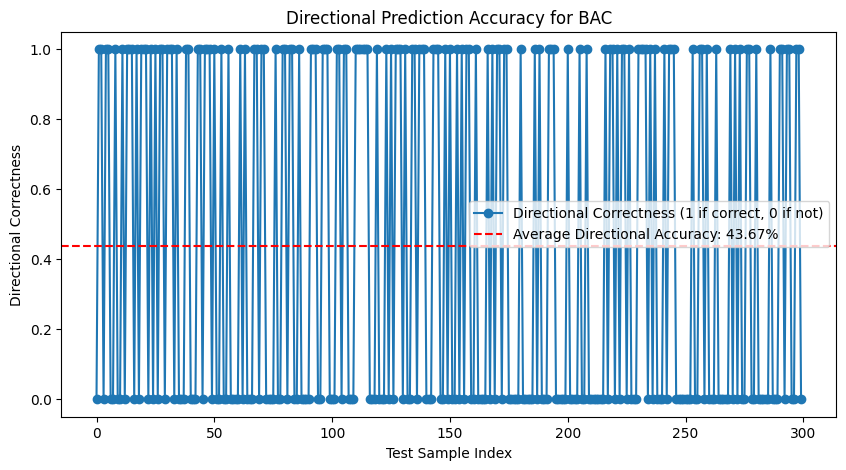

ROC AUC for BAC: 0.53


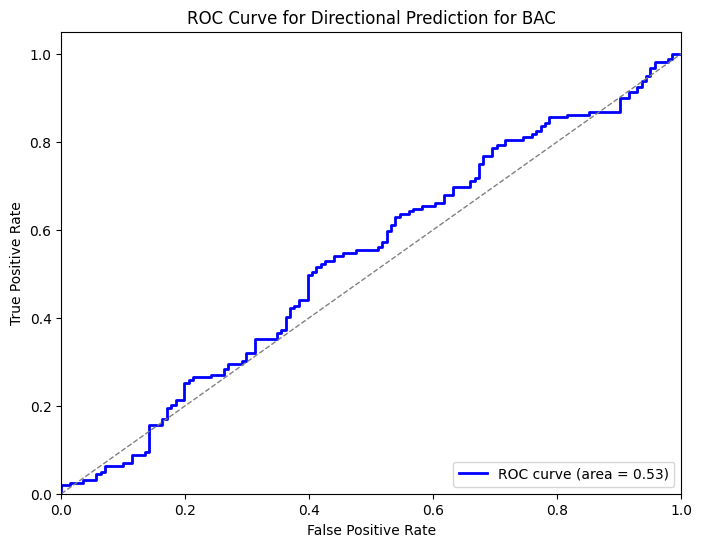


Processing ticker: BSX
Ticker: BSX - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 2.7499e-04 - loss: 0.6586 - val_accuracy: 0.0000e+00 - val_loss: 1.6280
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0042 - loss: 0.4702 - val_accuracy: 0.0000e+00 - val_loss: 0.7356
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 3.2028e-04 - loss: 0.3910 - val_accuracy: 0.0000e+00 - val_loss: 0.7410
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 2.3159e-04 - loss: 0.3808 - val_accuracy: 0.0000e+00 - val_loss: 0.7446
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 4.6932e-04 - loss: 0.3863 - val_accuracy: 0.0000e+00 - val_loss: 0.7388
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4986e-04 - loss: 0.3864 - val_accuracy: 0.0000e+00 - val_loss: 0.7359
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 2.7499e-04 - loss: 0.3668 - val_accuracy: 0.0000e+00 - val_loss: 0.7297
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 

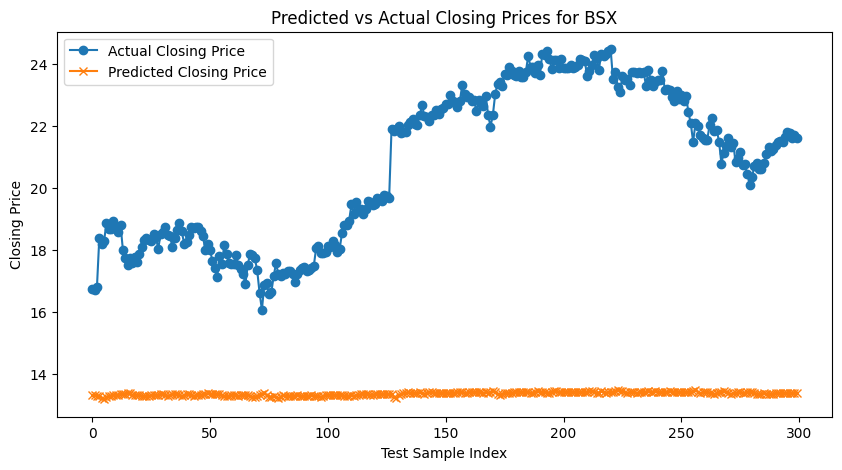

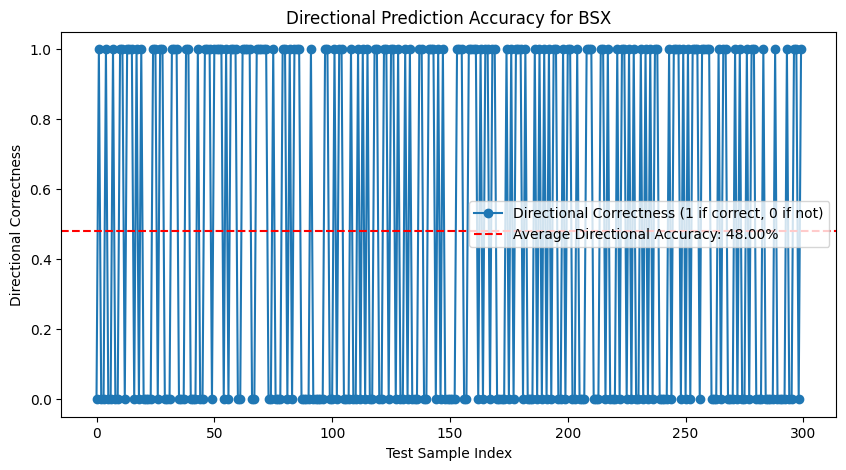

ROC AUC for BSX: 0.56


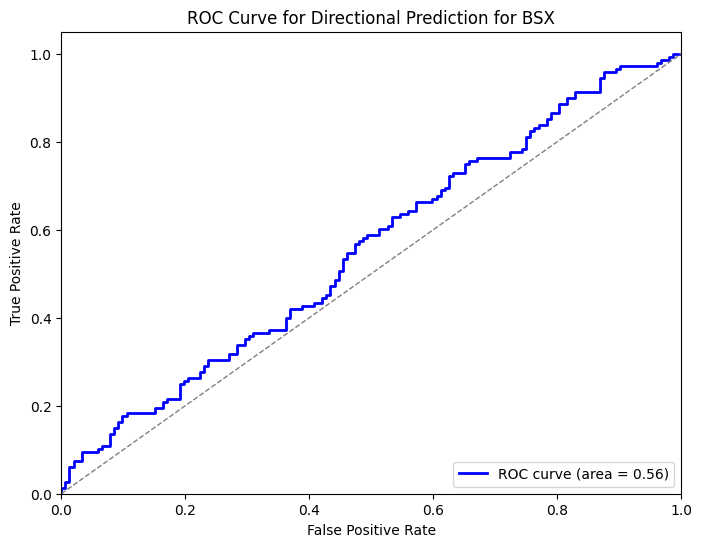


Processing ticker: C
Ticker: C - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 7.7783e-04 - loss: 0.6892 - val_accuracy: 0.0000e+00 - val_loss: 0.5974
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.6932e-04 - loss: 0.6497 - val_accuracy: 0.0000e+00 - val_loss: 0.5355
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.6017 - val_accuracy: 0.0000e+00 - val_loss: 0.5591
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5780 - val_accuracy: 0.0000e+00 - val_loss: 0.5509
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.5874 - val_accuracy: 0.0000e+00 - val_loss: 0.5401
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5744 - val_accuracy: 0.0000e+00 - val_loss: 0.5377
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5862 - val_accuracy: 0.0000e+00 - val_loss: 0.5384
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5915 -

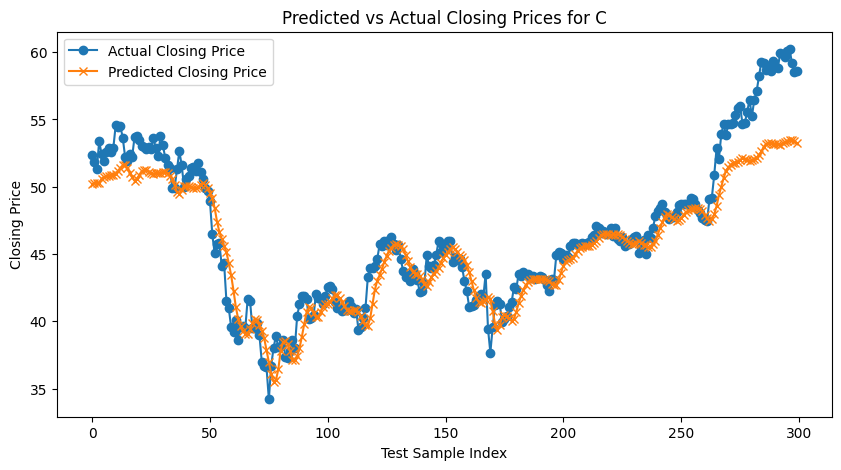

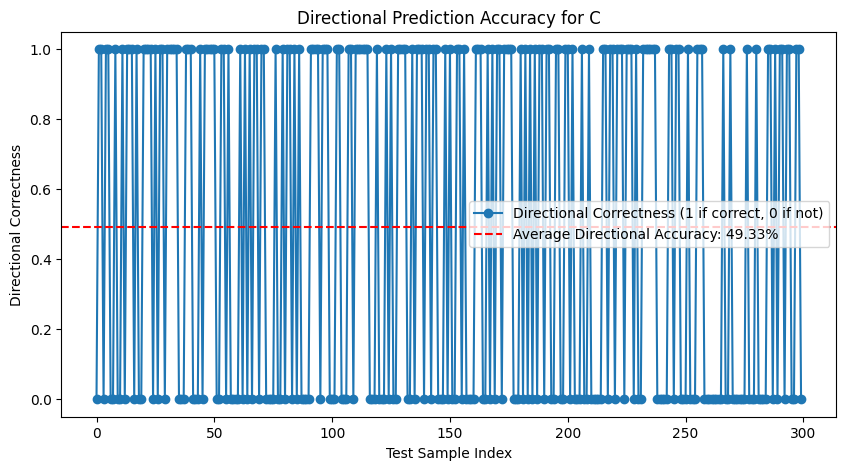

ROC AUC for C: 0.52


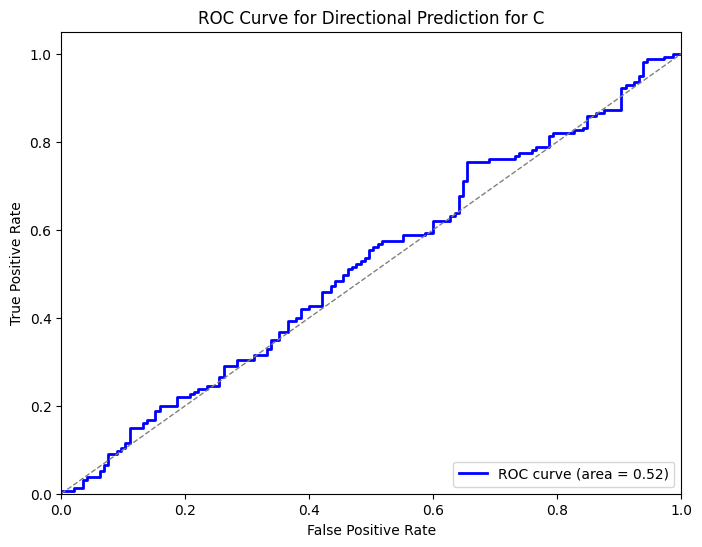


Processing ticker: CAT
Ticker: CAT - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 6.4328e-04 - loss: 0.7042 - val_accuracy: 0.0000e+00 - val_loss: 0.6814
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.6608 - val_accuracy: 0.0000e+00 - val_loss: 0.6696
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 7.7783e-04 - loss: 0.6563 - val_accuracy: 0.0000e+00 - val_loss: 0.6547
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.1128e-04 - loss: 0.6367 - val_accuracy: 0.0000e+00 - val_loss: 0.6301
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.6156 - val_accuracy: 0.0000e+00 - val_loss: 0.6256
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.6102 - val_accuracy: 0.0000e+00 - val_loss: 0.6188
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.6122 - val_accuracy: 0.0000e+00 - val_loss: 0.6107
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - l

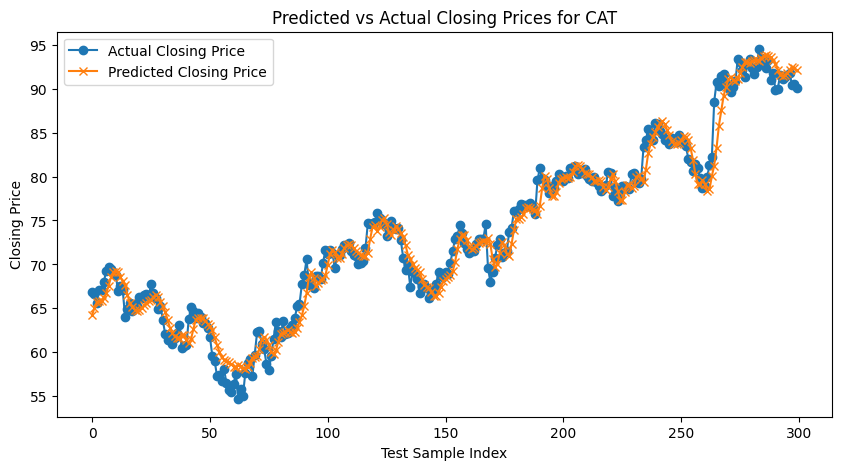

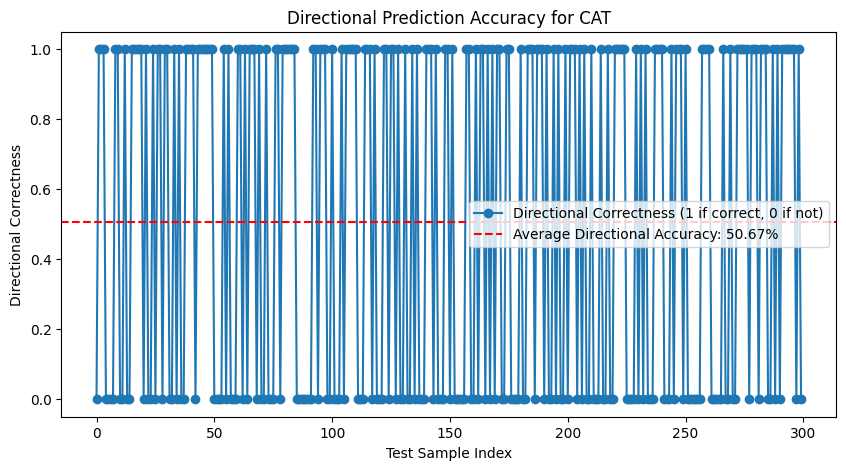

ROC AUC for CAT: 0.53


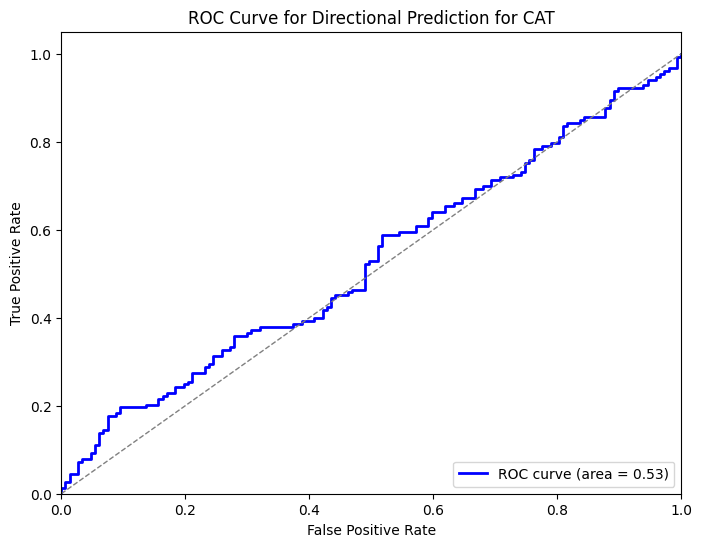


Processing ticker: CMCSA
Ticker: CMCSA - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.0023 - loss: 0.6877 - val_accuracy: 0.0000e+00 - val_loss: 0.8067
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.6413 - val_accuracy: 0.0000e+00 - val_loss: 0.7294
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0017 - loss: 0.5129 - val_accuracy: 0.0000e+00 - val_loss: 0.6643
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5239 - val_accuracy: 0.0000e+00 - val_loss: 0.6382
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5224 - val_accuracy: 0.0000e+00 - val_loss: 0.6254
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0024 - loss: 0.5228 - val_accuracy: 0.0000e+00 - val_loss: 0.6123
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0027 - loss: 0.5081 - val_accuracy: 0.0000e+00 - val_loss: 0.6089
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.9913e-04 - loss: 0.5169 - val_accura

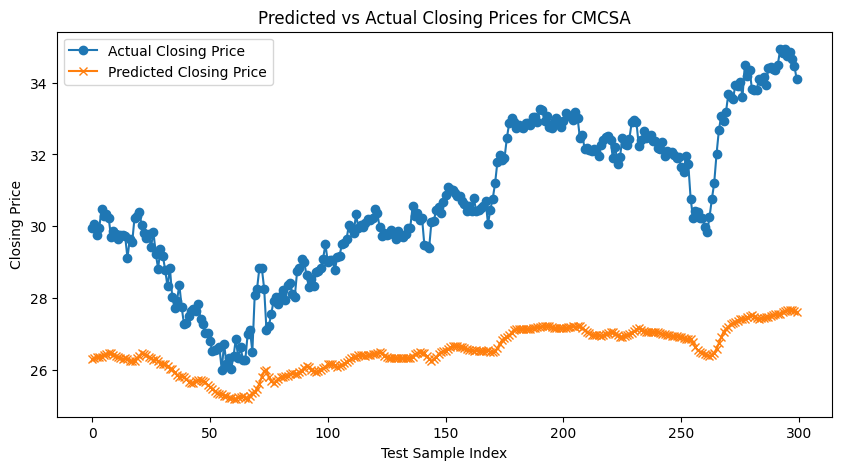

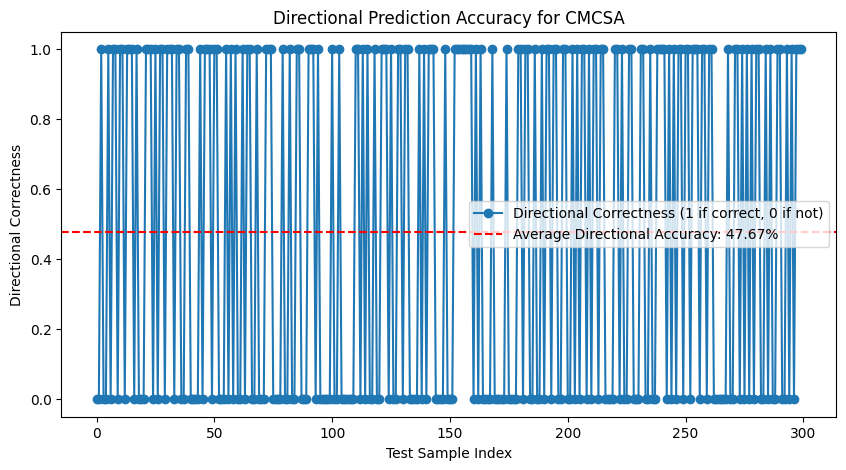

ROC AUC for CMCSA: 0.56


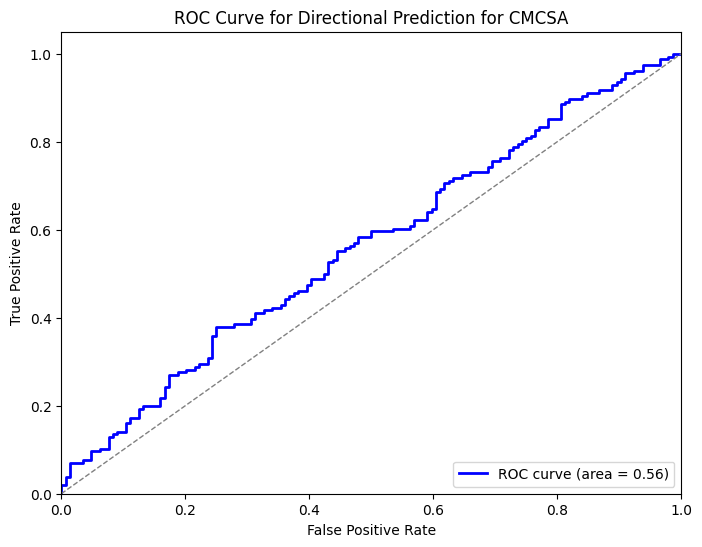


Processing ticker: COST
Ticker: COST - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 7.0839e-04 - loss: 0.6651 - val_accuracy: 0.0000e+00 - val_loss: 1.1664
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.6068 - val_accuracy: 0.0000e+00 - val_loss: 0.8301
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5245 - val_accuracy: 0.0000e+00 - val_loss: 0.7656
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5134 - val_accuracy: 0.0000e+00 - val_loss: 0.7389
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5109 - val_accuracy: 0.0000e+00 - val_loss: 0.7353
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.5108 - val_accuracy: 0.0000e+00 - val_loss: 0.7246
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5093 - val_accuracy: 0.0000e+00 - val_loss: 0.7199
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5072 - val_acc

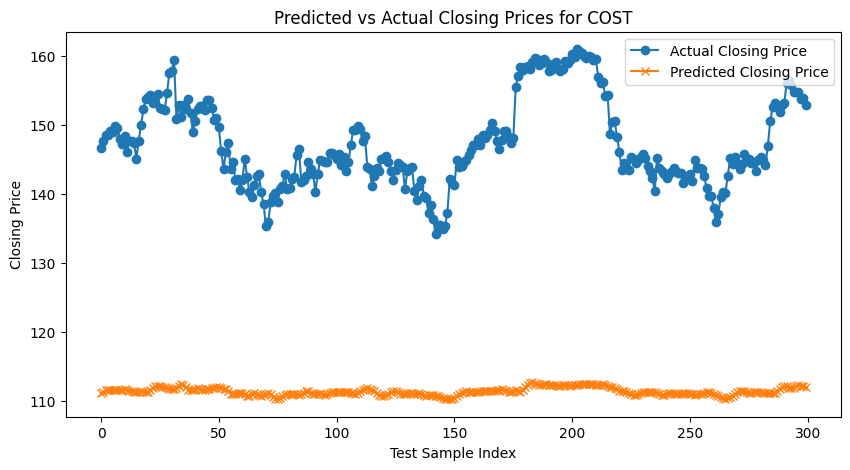

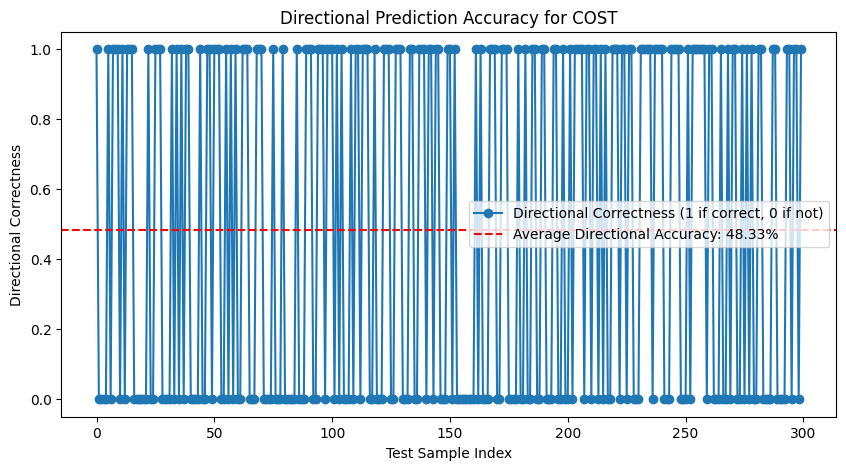

ROC AUC for COST: 0.55


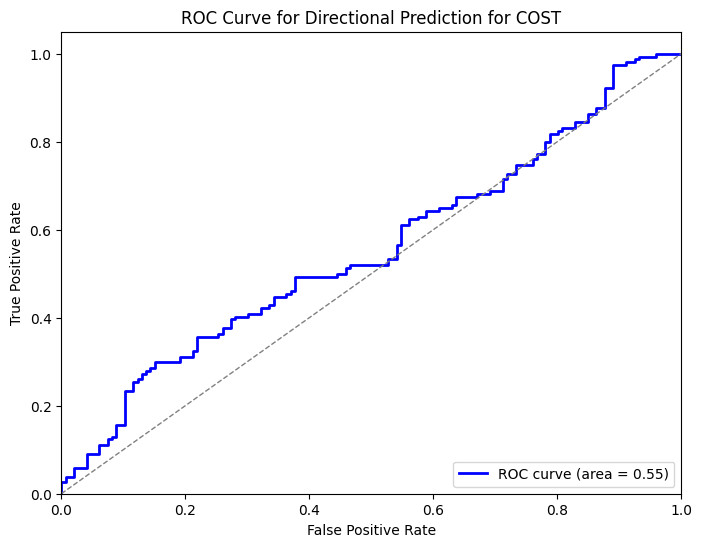


Processing ticker: CSCO
Ticker: CSCO - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.0010 - loss: 0.6762 - val_accuracy: 0.0000e+00 - val_loss: 1.0052
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.6418 - val_accuracy: 0.0000e+00 - val_loss: 0.7599
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.5751 - val_accuracy: 0.0000e+00 - val_loss: 0.6785
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.5611 - val_accuracy: 0.0000e+00 - val_loss: 0.6643
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5668 - val_accuracy: 0.0000e+00 - val_loss: 0.6549
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.5638 - val_accuracy: 0.0000e+00 - val_loss: 0.6444
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.6932e-04 - loss: 0.5638 - val_accuracy: 0.0000e+00 - val_loss: 0.6442
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5644 - va

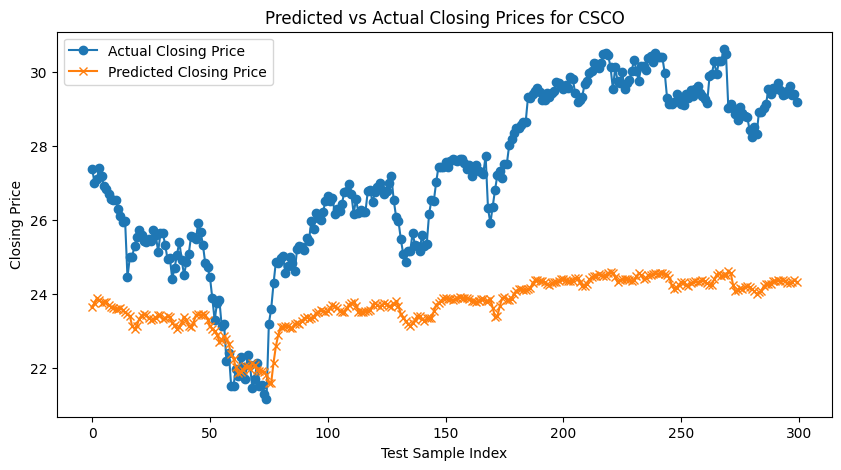

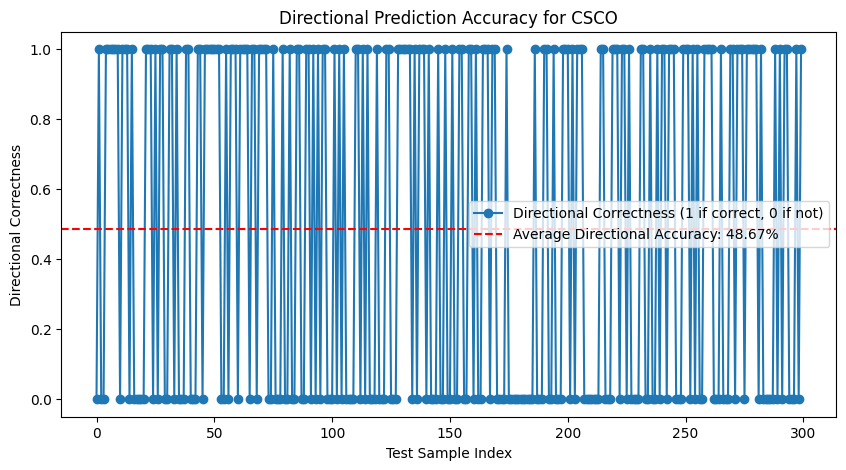

ROC AUC for CSCO: 0.52


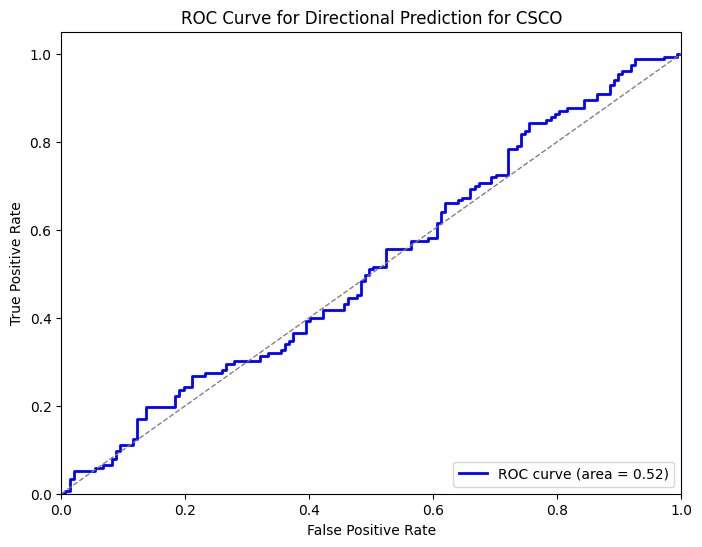


Processing ticker: CVX
Ticker: CVX - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0023 - loss: 0.6844 - val_accuracy: 0.0000e+00 - val_loss: 0.6635
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.6552 - val_accuracy: 0.0033 - val_loss: 0.6390
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.6300 - val_accuracy: 0.0033 - val_loss: 0.6274
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.6157 - val_accuracy: 0.0033 - val_loss: 0.6153
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.6088 - val_accuracy: 0.0033 - val_loss: 0.6069
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.6036 - val_accuracy: 0.0033 - val_loss: 0.6054
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3237e-04 - loss: 0.6119 - val_accuracy: 0.0033 - val_loss: 0.6049
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.6072 - val_accuracy: 0.003

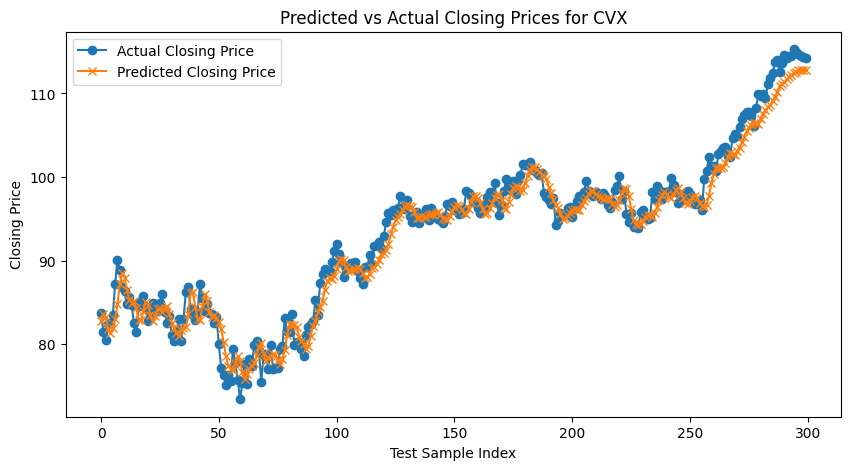

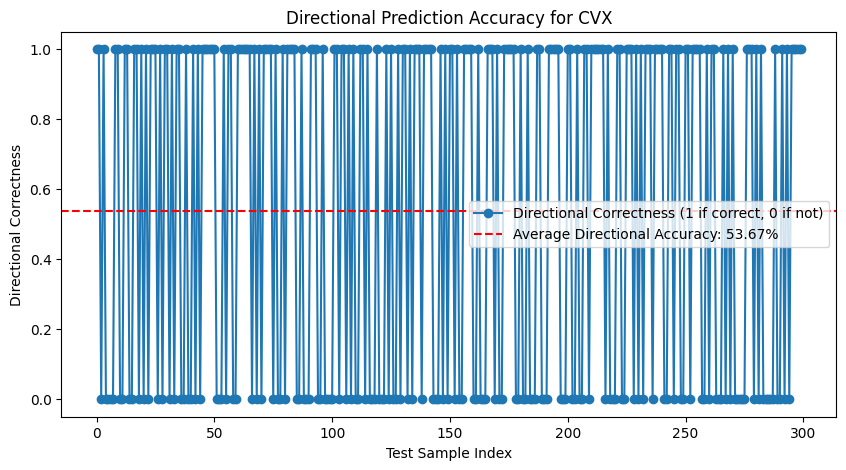

ROC AUC for CVX: 0.54


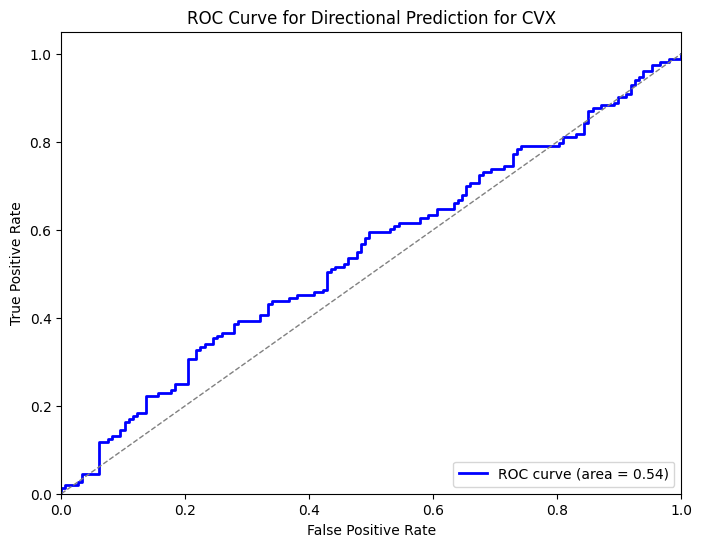


Processing ticker: DHR
Ticker: DHR - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 3.6763e-04 - loss: 0.6739 - val_accuracy: 0.0000e+00 - val_loss: 0.9985
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.6206 - val_accuracy: 0.0000e+00 - val_loss: 0.7638
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.5592 - val_accuracy: 0.0000e+00 - val_loss: 0.7040
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5503 - val_accuracy: 0.0000e+00 - val_loss: 0.6762
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5459 - val_accuracy: 0.0000e+00 - val_loss: 0.6596
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5443 - val_accuracy: 0.0000e+00 - val_loss: 0.6431
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5436 - val_accuracy: 0.0000e+00 - val_loss: 0.6358
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.55

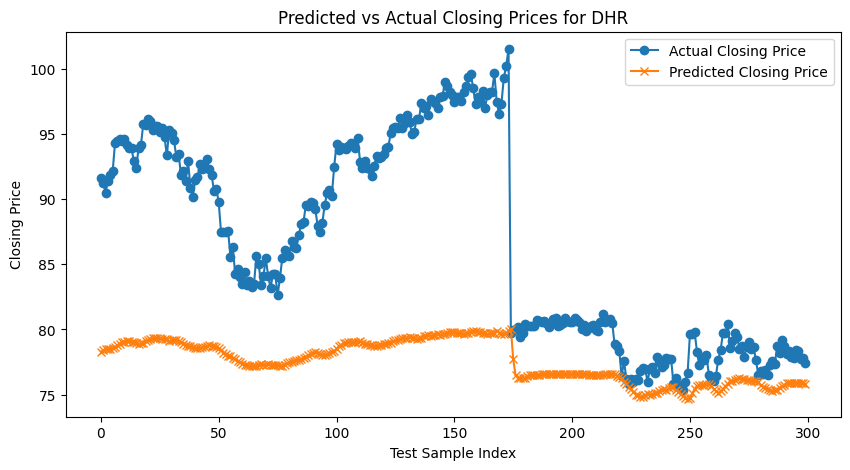

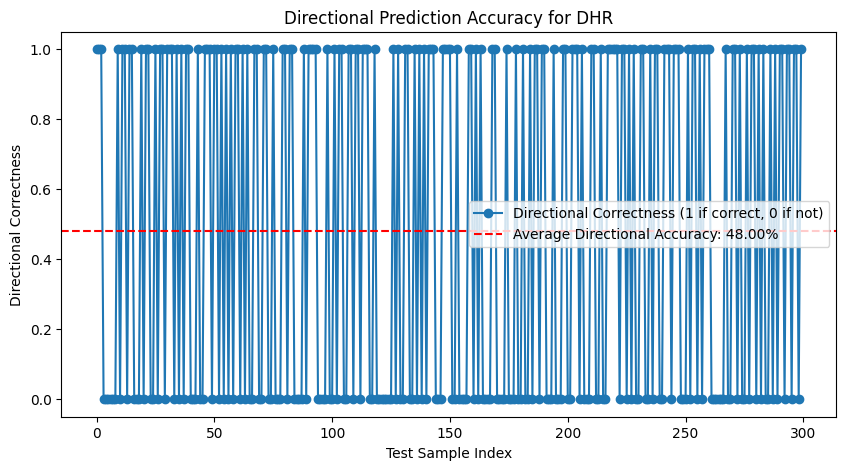

ROC AUC for DHR: 0.51


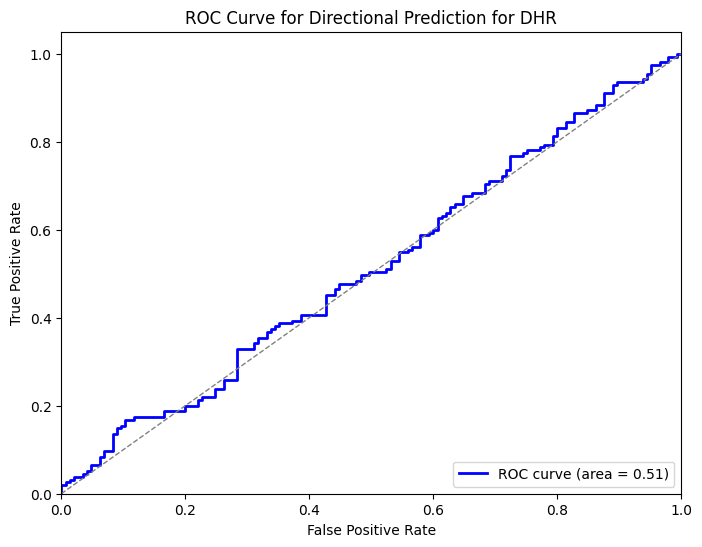


Processing ticker: DIS
Ticker: DIS - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0010 - loss: 0.6676 - val_accuracy: 0.0000e+00 - val_loss: 1.0615
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5629 - val_accuracy: 0.0033 - val_loss: 0.6969
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5228 - val_accuracy: 0.0033 - val_loss: 0.6681
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.5136 - val_accuracy: 0.0033 - val_loss: 0.6570
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5093 - val_accuracy: 0.0033 - val_loss: 0.6443
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5127 - val_accuracy: 0.0033 - val_loss: 0.6316
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5117 - val_accuracy: 0.0033 - val_loss: 0.6235
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 0.5157 - val_accuracy: 0.003

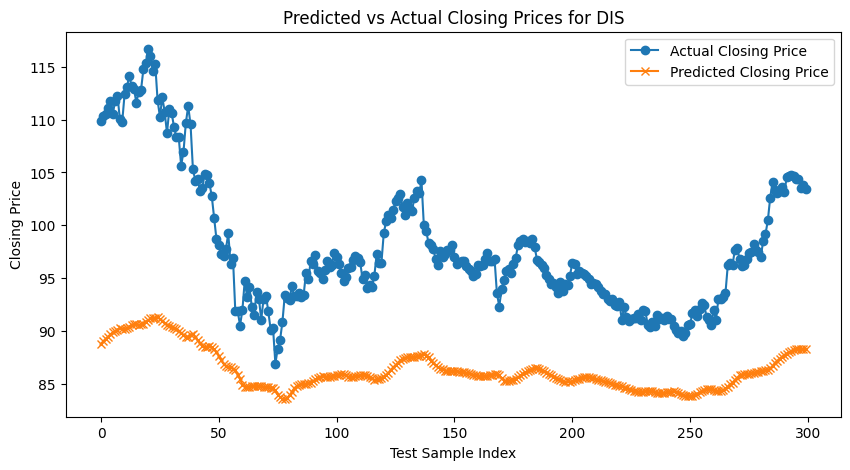

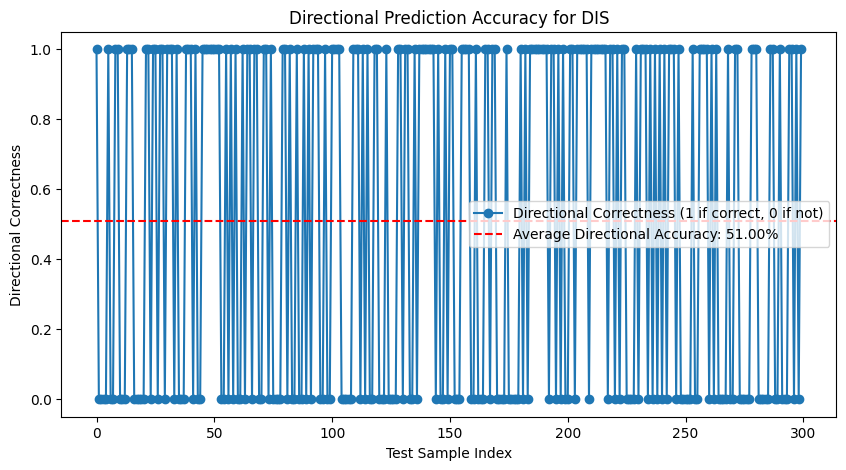

ROC AUC for DIS: 0.54


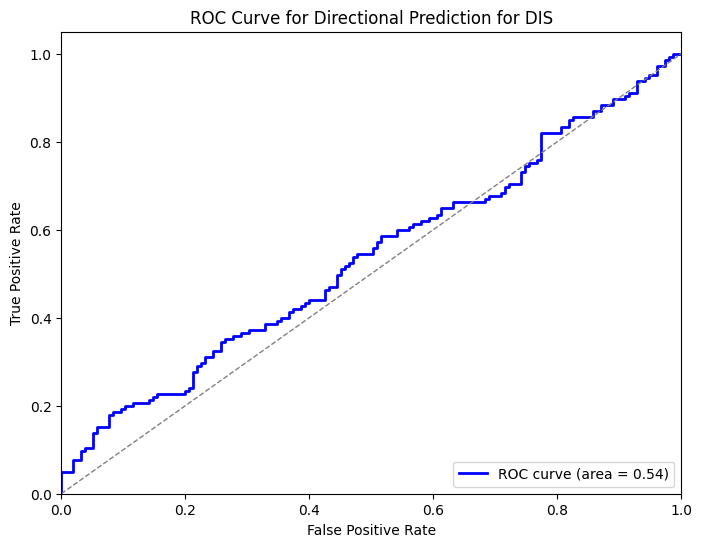


Processing ticker: GE
Ticker: GE - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 3.6763e-04 - loss: 0.6816 - val_accuracy: 0.0000e+00 - val_loss: 0.7887
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.6220 - val_accuracy: 0.0000e+00 - val_loss: 0.7013
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5759 - val_accuracy: 0.0000e+00 - val_loss: 0.6861
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.5738 - val_accuracy: 0.0000e+00 - val_loss: 0.6737
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5730 - val_accuracy: 0.0000e+00 - val_loss: 0.6719
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 0.5646 - val_accuracy: 0.0000e+00 - val_loss: 0.6705
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5672 - val_accuracy: 0.0000e+00 - val_loss: 0.6705
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.57

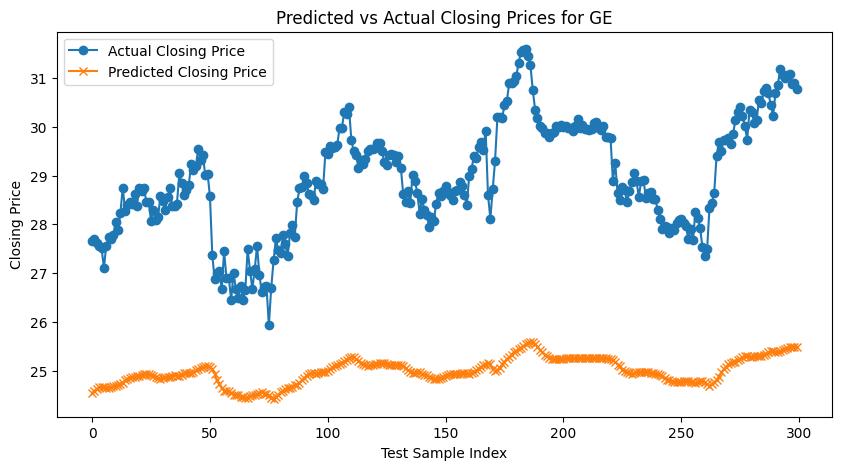

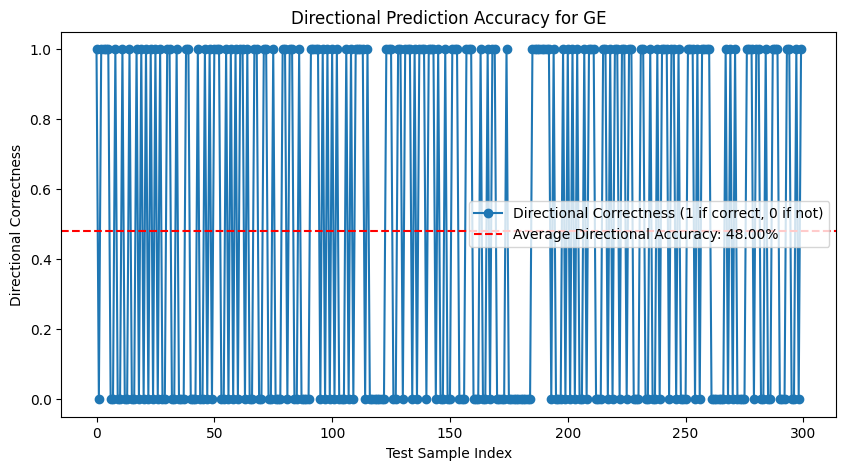

ROC AUC for GE: 0.52


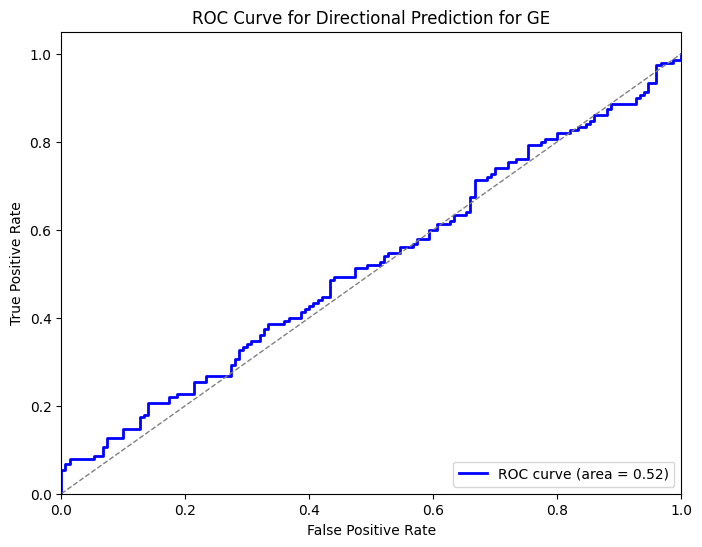


Processing ticker: GOOGL
Ticker: GOOGL - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 1.1128e-04 - loss: 0.6776 - val_accuracy: 0.0000e+00 - val_loss: 0.8936
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.5646 - val_accuracy: 0.0000e+00 - val_loss: 0.6847
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.4769 - val_accuracy: 0.0000e+00 - val_loss: 0.6831
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.4739 - val_accuracy: 0.0000e+00 - val_loss: 0.6796
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.4837 - val_accuracy: 0.0000e+00 - val_loss: 0.6774
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.4842 - val_accuracy: 0.0000e+00 - val_loss: 0.6755
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 8.5224e-04 - loss: 0.4757 - val_accuracy: 0.0000e+00 - val_loss: 0.6748
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 

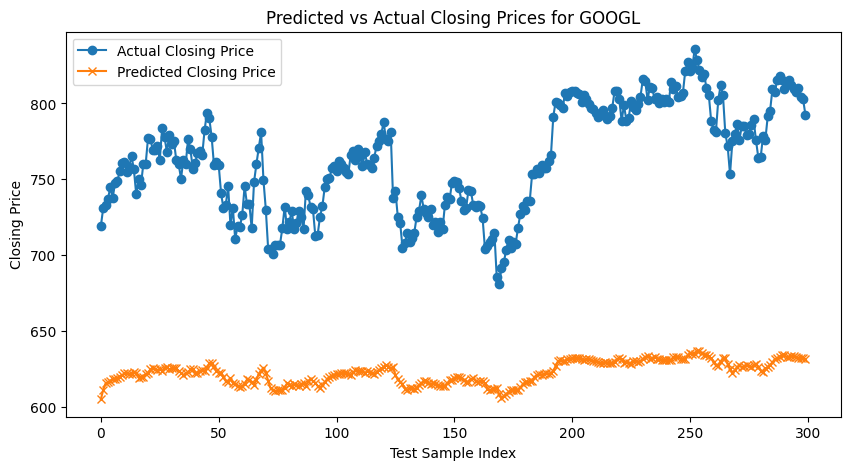

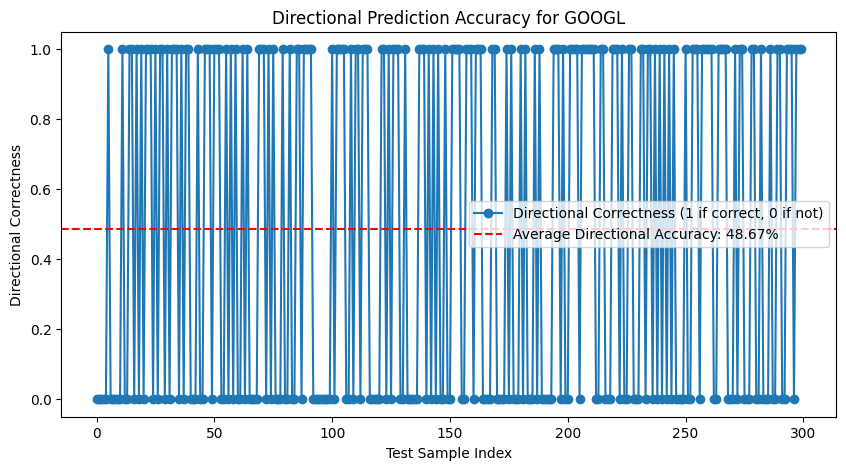

ROC AUC for GOOGL: 0.63


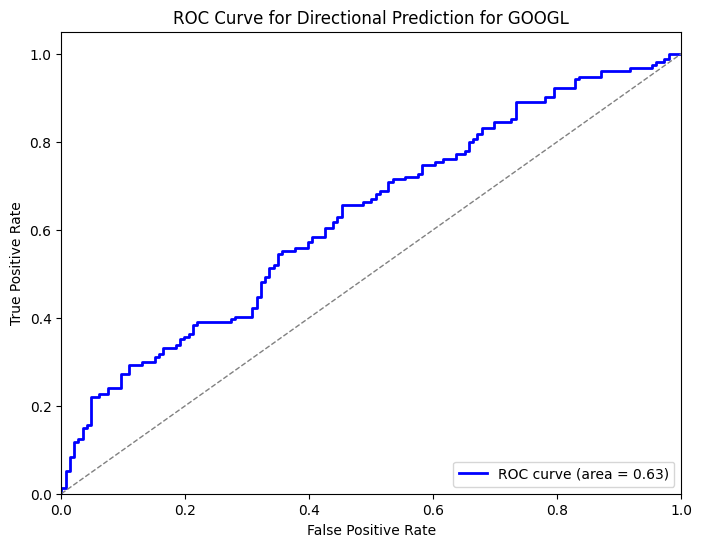


Processing ticker: GS
Ticker: GS - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 1.4986e-04 - loss: 0.6768 - val_accuracy: 0.0000e+00 - val_loss: 0.9133
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.6291 - val_accuracy: 0.0000e+00 - val_loss: 0.7632
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.5585 - val_accuracy: 0.0000e+00 - val_loss: 0.7158
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5530 - val_accuracy: 0.0000e+00 - val_loss: 0.6944
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.5502 - val_accuracy: 0.0000e+00 - val_loss: 0.6933
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.5500 - val_accuracy: 0.0000e+00 - val_loss: 0.6880
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5472 - val_accuracy: 0.0000e+00 - val_loss: 0.6815
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - lo

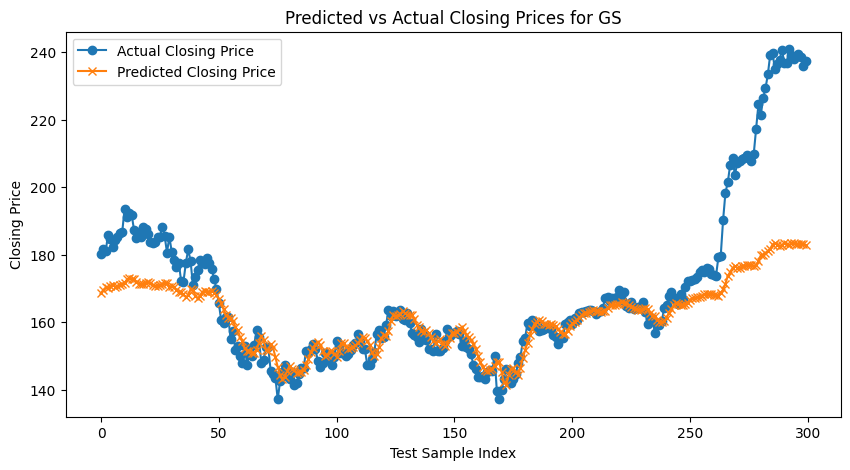

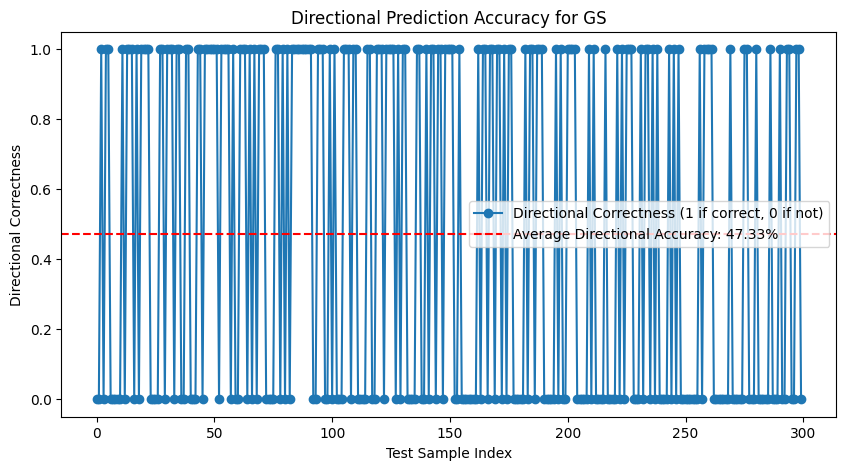

ROC AUC for GS: 0.48


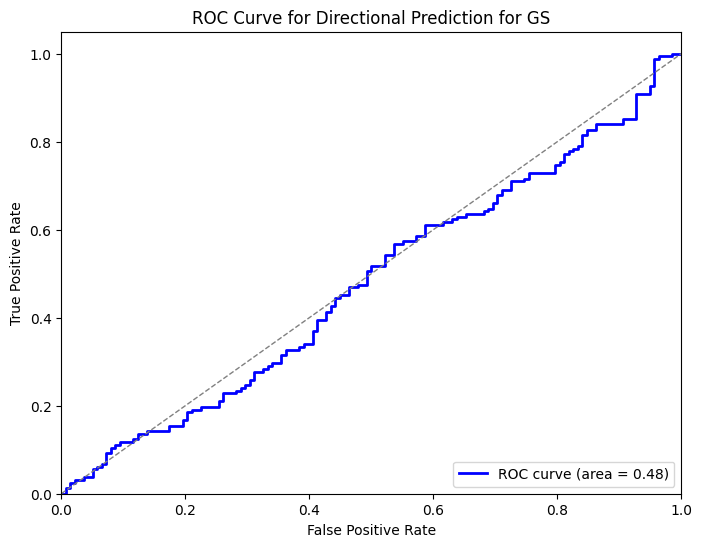


Processing ticker: HD
Ticker: HD - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 3.6763e-04 - loss: 0.6683 - val_accuracy: 0.0000e+00 - val_loss: 1.4956
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0020 - loss: 0.6036 - val_accuracy: 0.0000e+00 - val_loss: 0.9122
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.4328e-04 - loss: 0.5325 - val_accuracy: 0.0000e+00 - val_loss: 0.8118
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 8.5224e-04 - loss: 0.5098 - val_accuracy: 0.0000e+00 - val_loss: 0.8008
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.5100 - val_accuracy: 0.0000e+00 - val_loss: 0.7867
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.4975 - val_accuracy: 0.0000e+00 - val_loss: 0.7815
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5025 - val_accuracy: 0.0000e+00 - val_loss: 0.7760
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.50

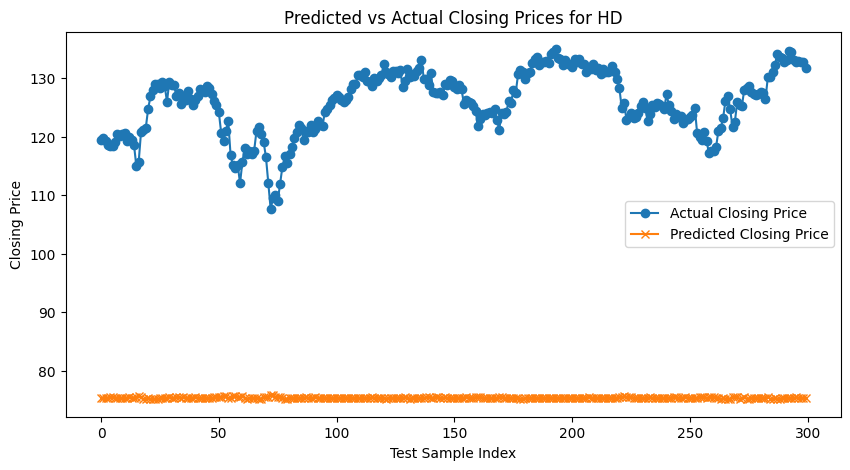

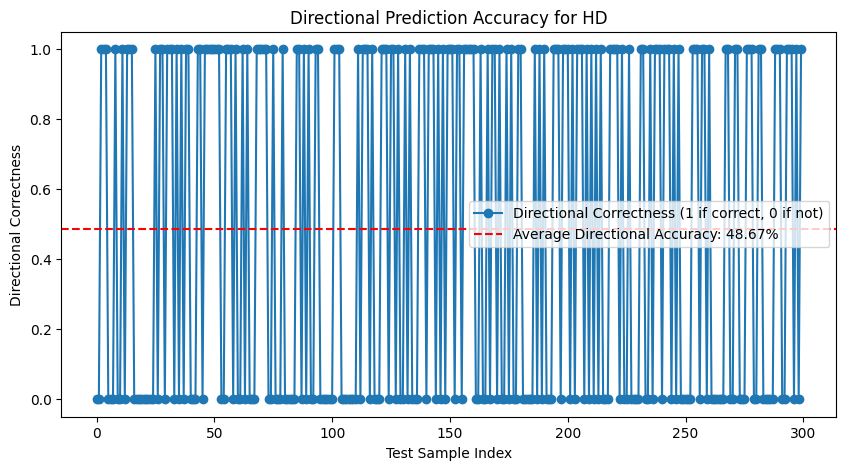

ROC AUC for HD: 0.59


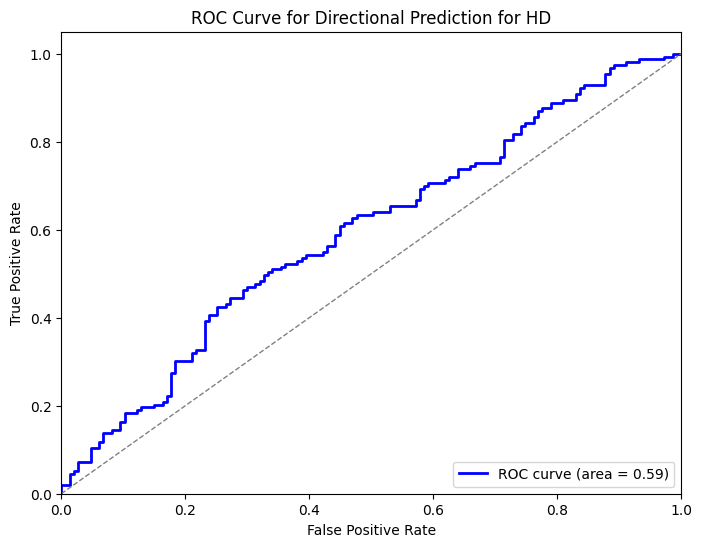


Processing ticker: HON
Ticker: HON - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0011 - loss: 0.6842 - val_accuracy: 0.0000e+00 - val_loss: 0.7787
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.6342 - val_accuracy: 0.0000e+00 - val_loss: 0.6284
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5492 - val_accuracy: 0.0000e+00 - val_loss: 0.6189
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5455 - val_accuracy: 0.0000e+00 - val_loss: 0.6116
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.5476 - val_accuracy: 0.0000e+00 - val_loss: 0.6092
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.5499 - val_accuracy: 0.0000e+00 - val_loss: 0.6032
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5483 - val_accuracy: 0.0000e+00 - val_loss: 0.6003
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.5383 - val

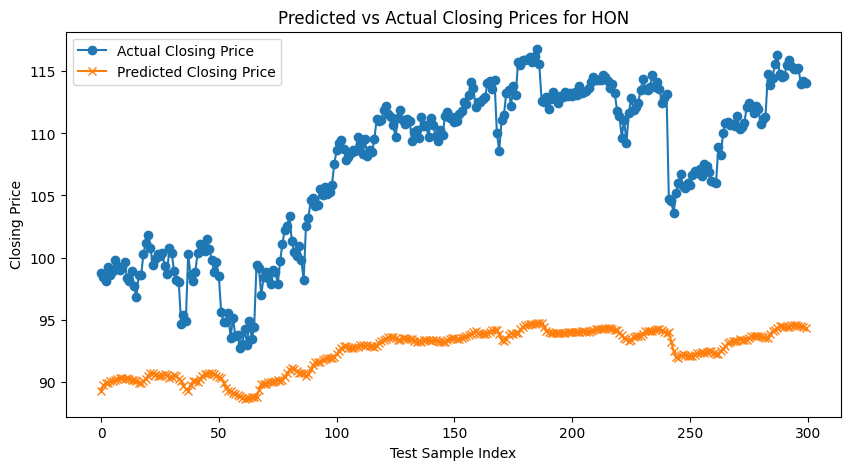

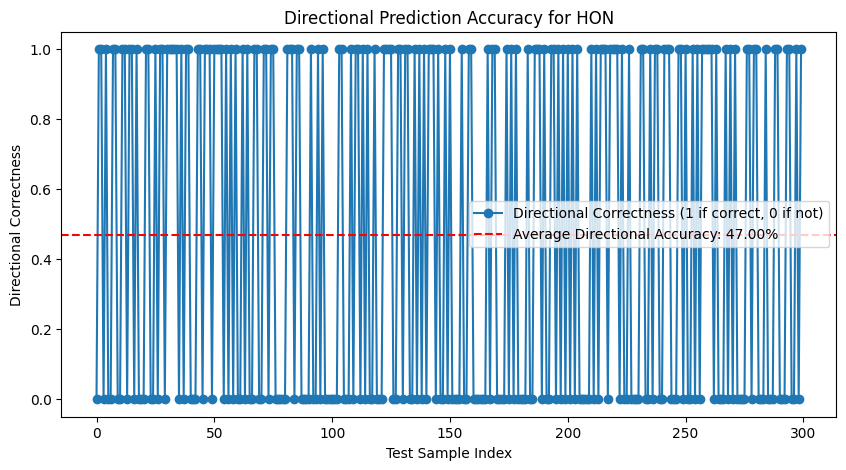

ROC AUC for HON: 0.50


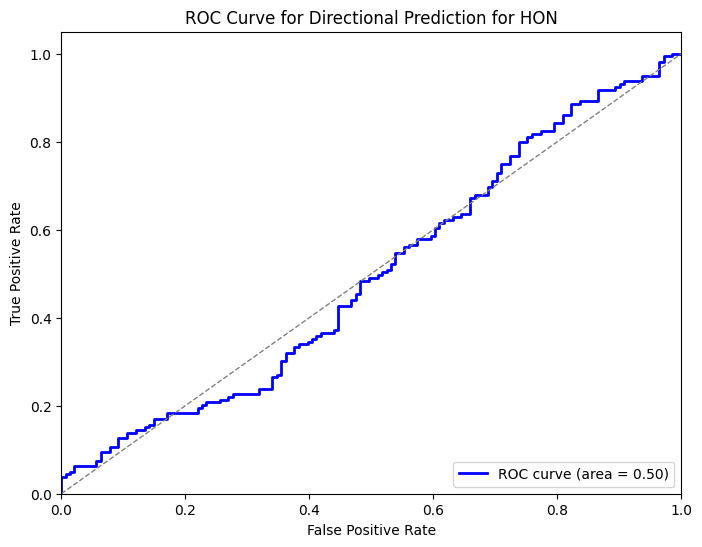


Processing ticker: IBM
Ticker: IBM - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 3.6763e-04 - loss: 0.6484 - val_accuracy: 0.0000e+00 - val_loss: 0.7104
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.8201e-04 - loss: 0.6158 - val_accuracy: 0.0000e+00 - val_loss: 0.7246
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.6135 - val_accuracy: 0.0000e+00 - val_loss: 0.7185
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.6004 - val_accuracy: 0.0000e+00 - val_loss: 0.6935
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.0839e-04 - loss: 0.5976 - val_accuracy: 0.0000e+00 - val_loss: 0.6598
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0042 - loss: 0.5774 - val_accuracy: 0.0000e+00 - val_loss: 0.6558
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5781 - val_accuracy: 0.0000e+00 - val_loss: 0.6567
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.57

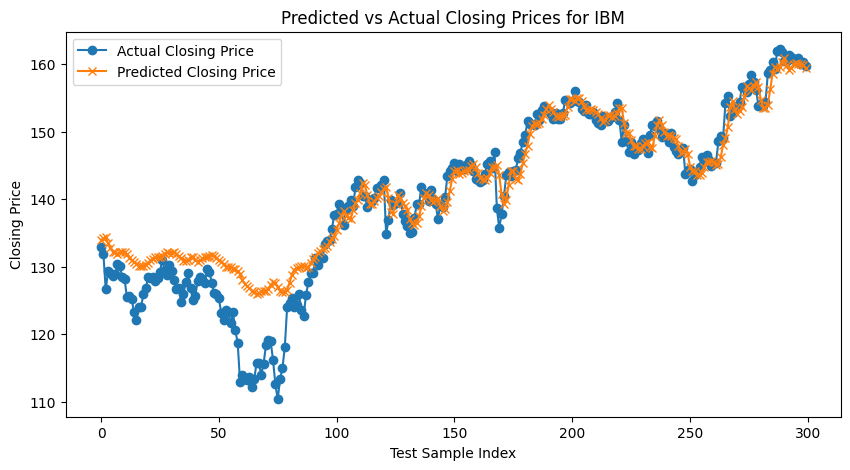

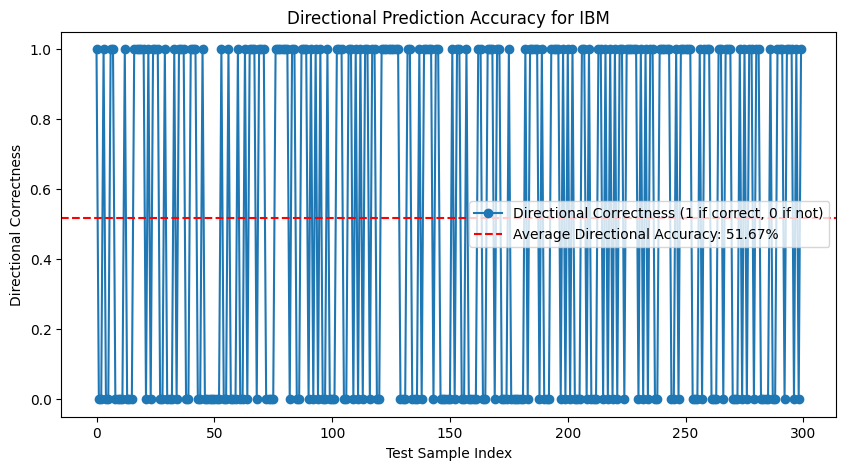

ROC AUC for IBM: 0.52


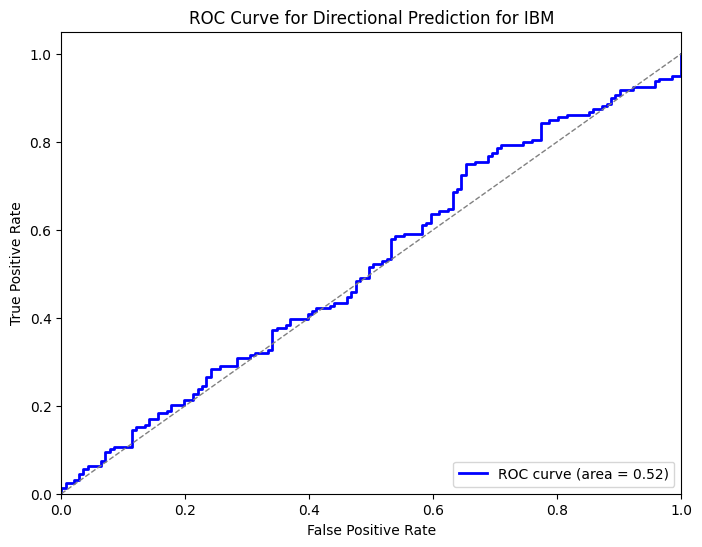


Processing ticker: INTU
Ticker: INTU - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.0018 - loss: 0.6584 - val_accuracy: 0.0000e+00 - val_loss: 1.2147
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 4.1723e-04 - loss: 0.5968 - val_accuracy: 0.0000e+00 - val_loss: 0.7377
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 4.6932e-04 - loss: 0.5485 - val_accuracy: 0.0000e+00 - val_loss: 0.7152
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4986e-04 - loss: 0.5455 - val_accuracy: 0.0000e+00 - val_loss: 0.7188
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5394 - val_accuracy: 0.0000e+00 - val_loss: 0.7105
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.8201e-04 - loss: 0.5500 - val_accuracy: 0.0000e+00 - val_loss: 0.7085
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.5376 - val_accuracy: 0.0000e+00 - val_loss: 0.7017
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 

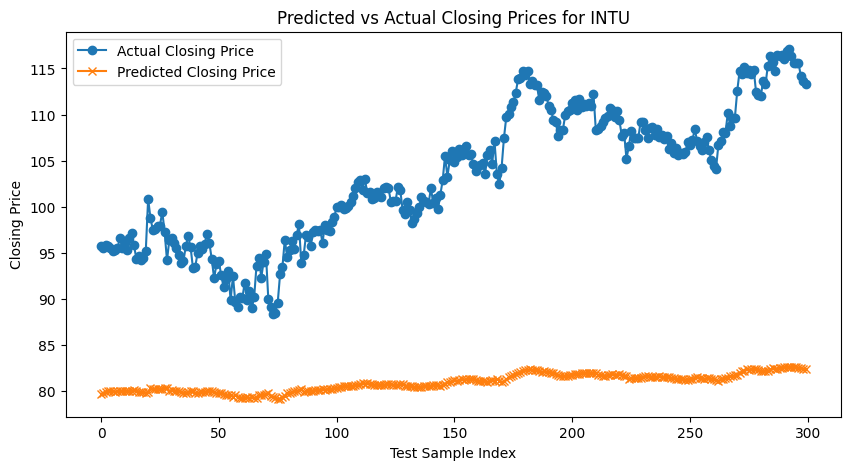

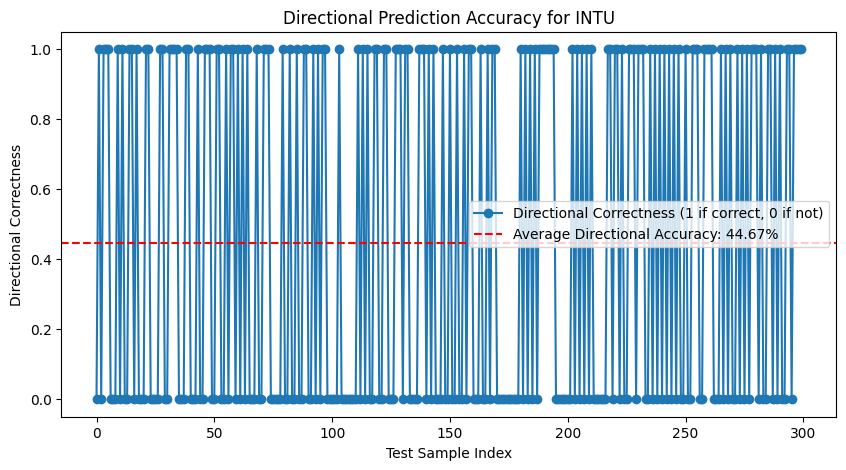

ROC AUC for INTU: 0.57


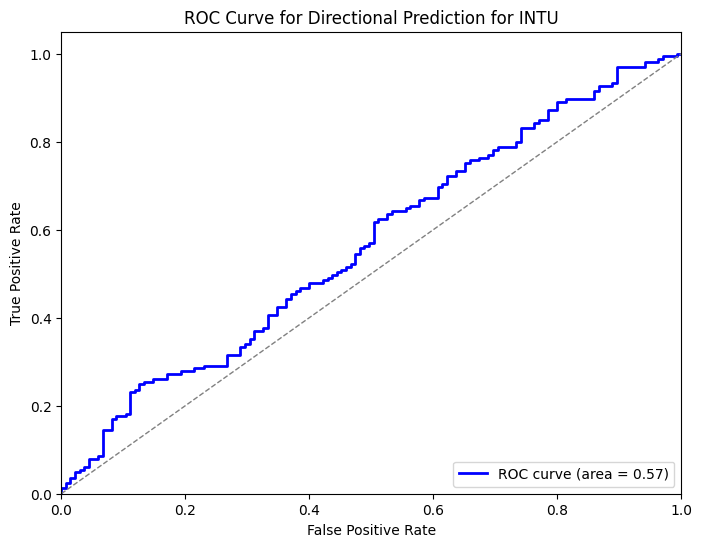


Processing ticker: JNJ
Ticker: JNJ - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.0011 - loss: 0.6911 - val_accuracy: 0.0000e+00 - val_loss: 0.8355
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.6303 - val_accuracy: 0.0000e+00 - val_loss: 0.7466
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.4900 - val_accuracy: 0.0000e+00 - val_loss: 0.6855
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.4941 - val_accuracy: 0.0000e+00 - val_loss: 0.6758
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.4909 - val_accuracy: 0.0000e+00 - val_loss: 0.6740
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.4881 - val_accuracy: 0.0000e+00 - val_loss: 0.6661
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.6932e-04 - loss: 0.4813 - val_accuracy: 0.0000e+00 - val_loss: 0.6622
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.4835 - val

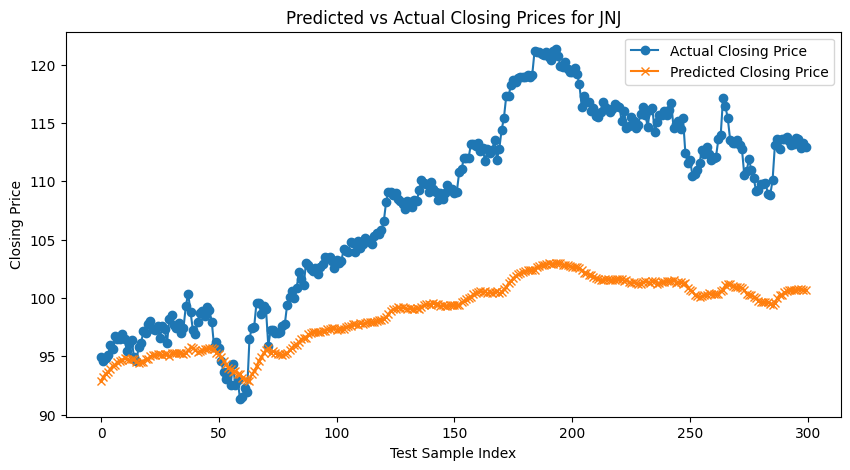

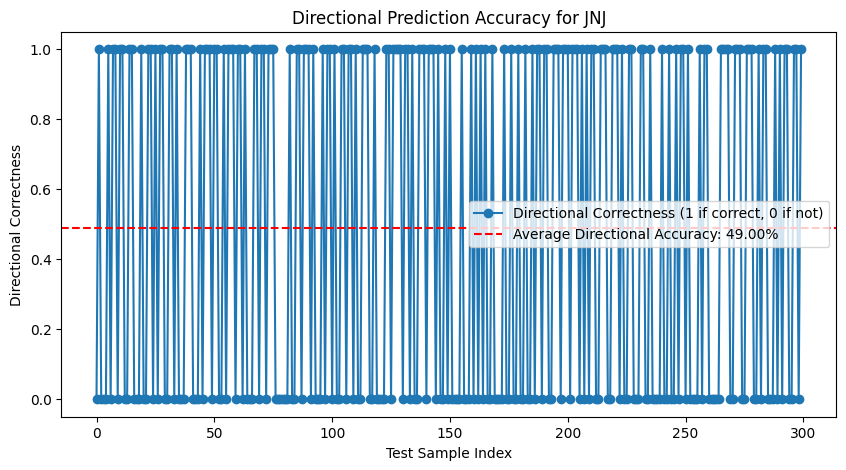

ROC AUC for JNJ: 0.54


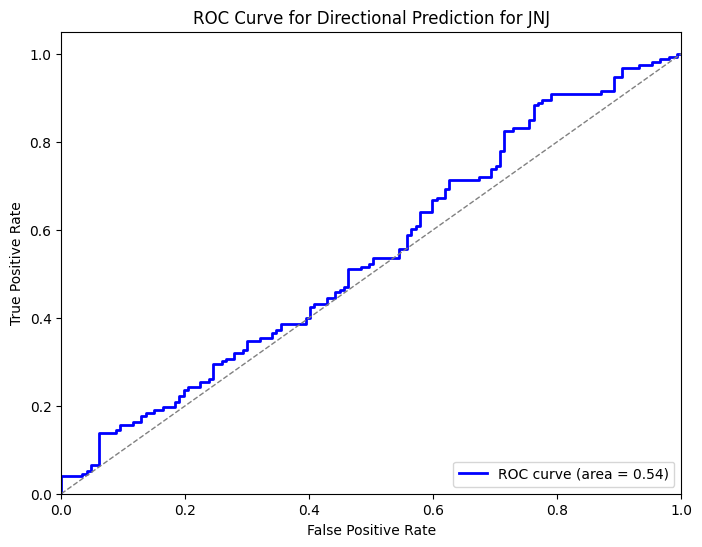


Processing ticker: JPM
Ticker: JPM - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0020 - loss: 0.6479 - val_accuracy: 0.0000e+00 - val_loss: 0.9040
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5682 - val_accuracy: 0.0000e+00 - val_loss: 0.7250
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.5349 - val_accuracy: 0.0000e+00 - val_loss: 0.7214
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0020 - loss: 0.5355 - val_accuracy: 0.0000e+00 - val_loss: 0.7182
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.5300 - val_accuracy: 0.0000e+00 - val_loss: 0.7149
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.5291 - val_accuracy: 0.0000e+00 - val_loss: 0.7133
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5247 - val_accuracy: 0.0000e+00 - val_loss: 0.7128
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5394 - val_acc

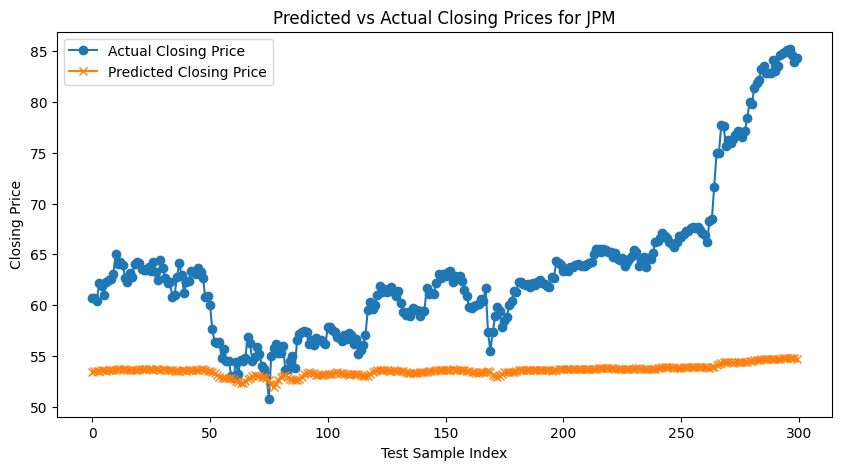

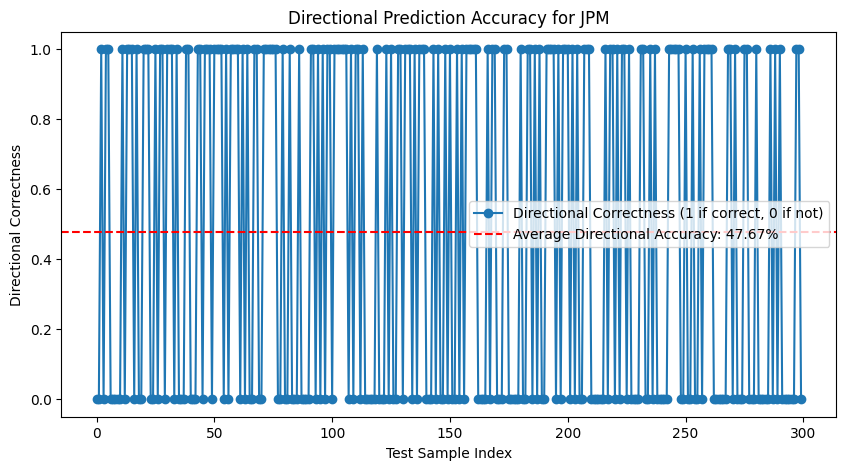

ROC AUC for JPM: 0.49


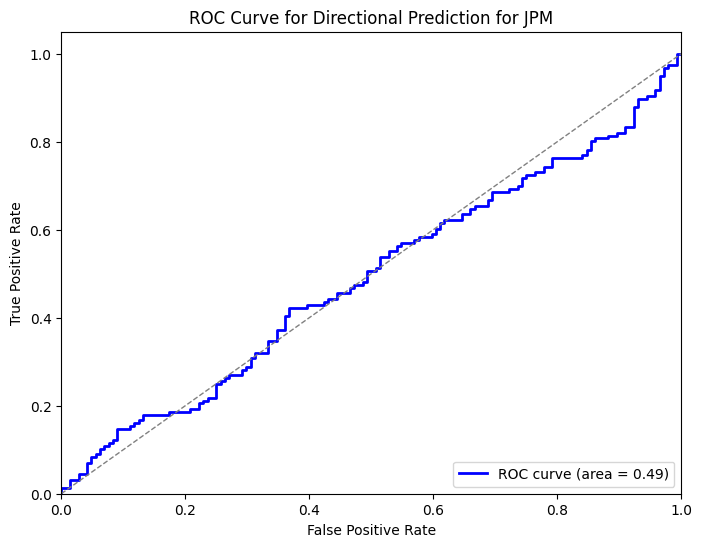


Processing ticker: KO
Ticker: KO - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 1.8992e-04 - loss: 0.6837 - val_accuracy: 0.0000e+00 - val_loss: 0.7489
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 8.5224e-04 - loss: 0.6385 - val_accuracy: 0.0000e+00 - val_loss: 0.6632
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.5732 - val_accuracy: 0.0000e+00 - val_loss: 0.6597
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5804 - val_accuracy: 0.0000e+00 - val_loss: 0.6562
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5777 - val_accuracy: 0.0000e+00 - val_loss: 0.6536
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5787 - val_accuracy: 0.0000e+00 - val_loss: 0.6512
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.5780 - val_accuracy: 0.0000e+00 - val_loss: 0.6473
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 

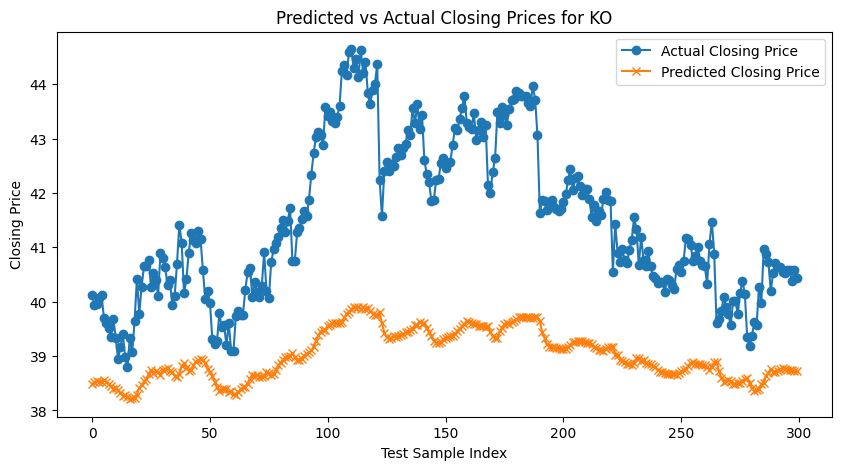

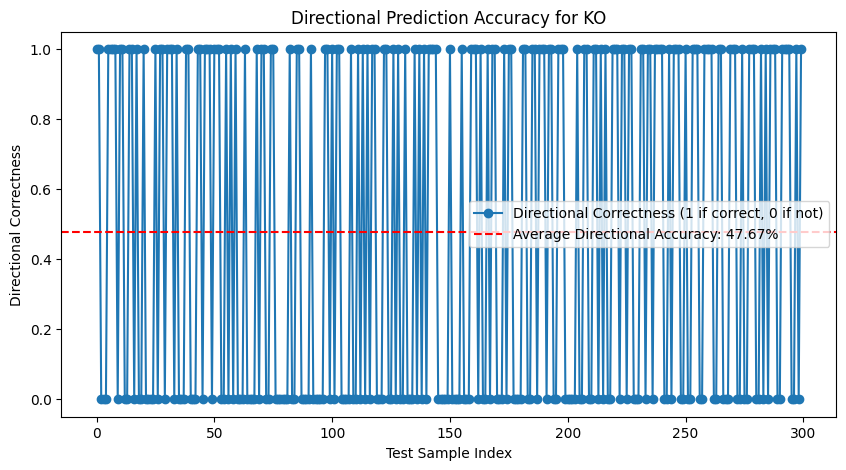

ROC AUC for KO: 0.54


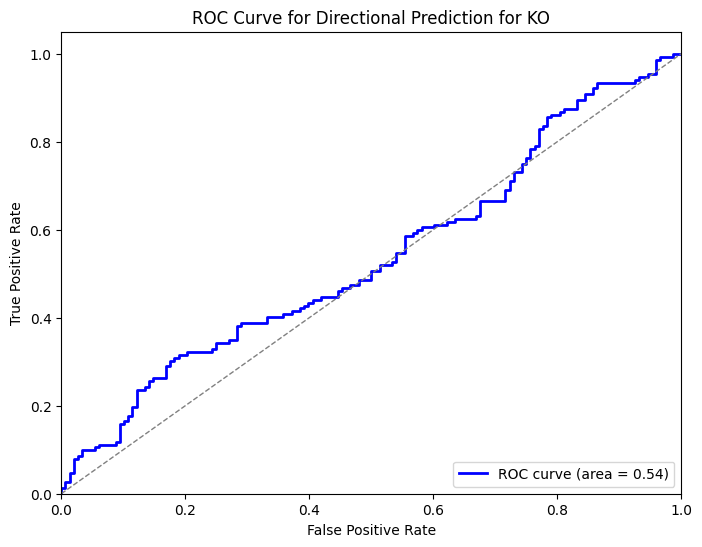


Processing ticker: LLY
Ticker: LLY - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 3.6763e-04 - loss: 0.6549 - val_accuracy: 0.0000e+00 - val_loss: 1.2179
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.5349 - val_accuracy: 0.0000e+00 - val_loss: 0.7400
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.4822 - val_accuracy: 0.0000e+00 - val_loss: 0.7461
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.4826 - val_accuracy: 0.0000e+00 - val_loss: 0.7287
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.4811 - val_accuracy: 0.0000e+00 - val_loss: 0.7161
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 0.4751 - val_accuracy: 0.0000e+00 - val_loss: 0.7019
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.4790 - val_accuracy: 0.0033 - val_loss: 0.6940
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.4878 - va

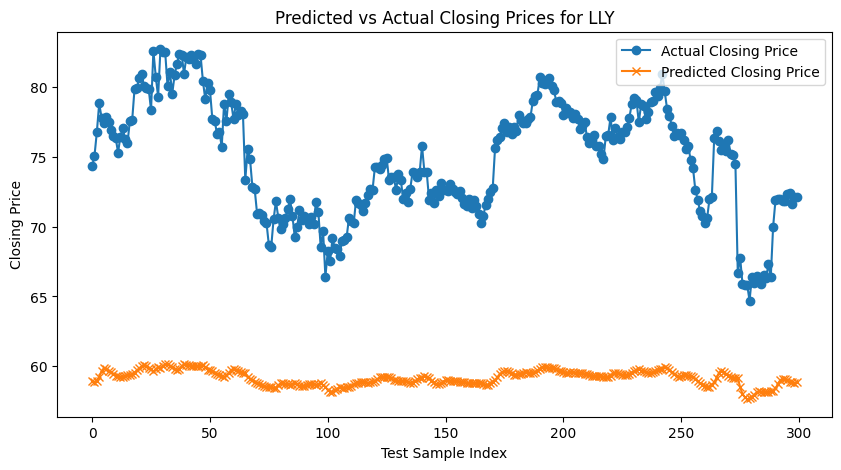

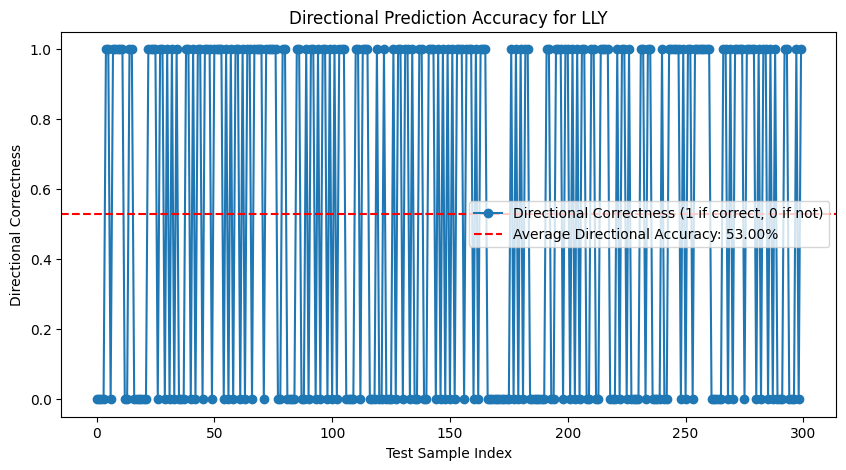

ROC AUC for LLY: 0.55


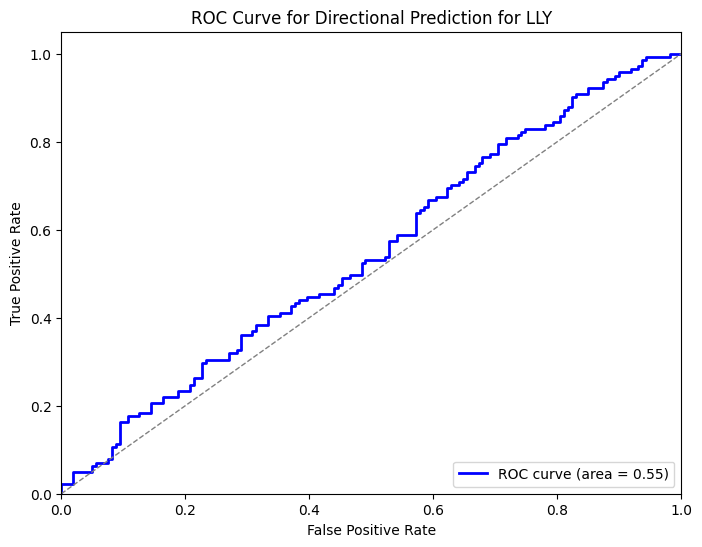


Processing ticker: MCD
Ticker: MCD - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0000e+00 - loss: 0.6759 - val_accuracy: 0.0000e+00 - val_loss: 0.7231
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.6041 - val_accuracy: 0.0000e+00 - val_loss: 0.6924
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.5819 - val_accuracy: 0.0000e+00 - val_loss: 0.6916
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.5800 - val_accuracy: 0.0000e+00 - val_loss: 0.6898
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.5825 - val_accuracy: 0.0000e+00 - val_loss: 0.6890
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.5824 - val_accuracy: 0.0000e+00 - val_loss: 0.6881
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.5811 - val_accuracy: 0.0000e+00 - val_loss: 0.6874
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 

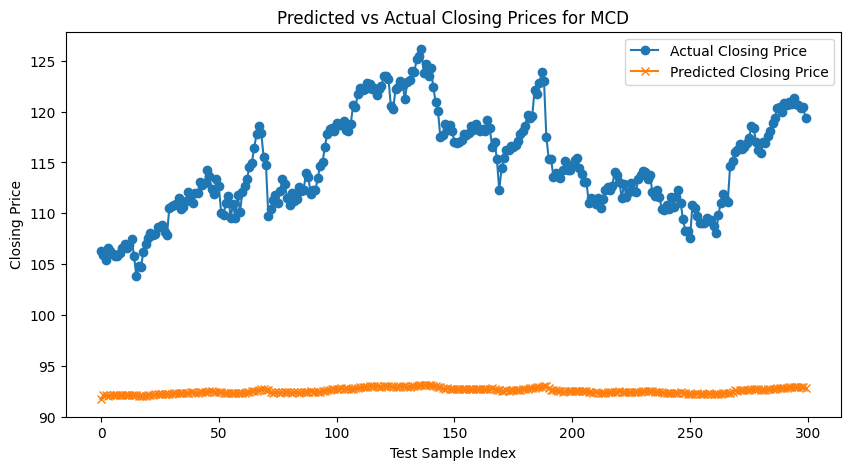

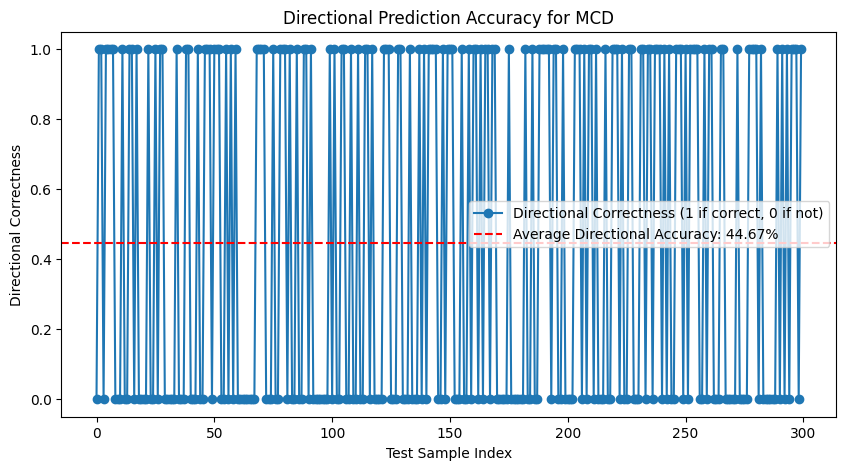

ROC AUC for MCD: 0.53


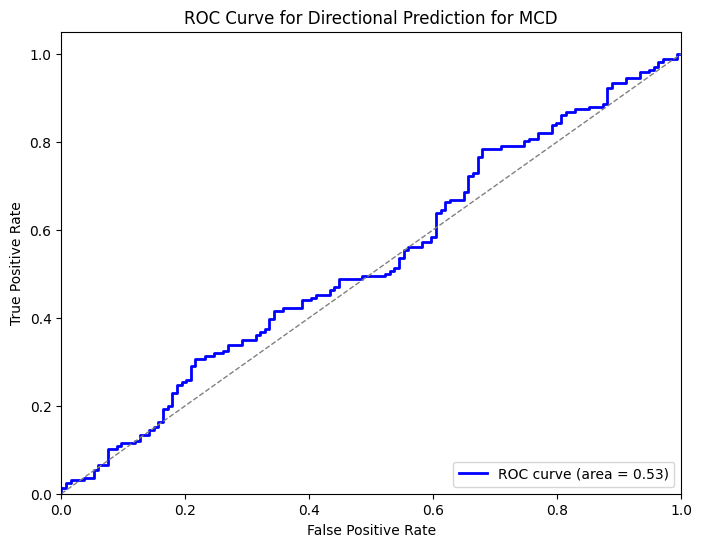


Processing ticker: MRK
Ticker: MRK - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.0013 - loss: 0.6935 - val_accuracy: 0.0000e+00 - val_loss: 0.7431
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.6207 - val_accuracy: 0.0000e+00 - val_loss: 0.6159
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5419 - val_accuracy: 0.0000e+00 - val_loss: 0.5933
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.5393 - val_accuracy: 0.0000e+00 - val_loss: 0.5736
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.7783e-04 - loss: 0.5274 - val_accuracy: 0.0000e+00 - val_loss: 0.5675
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5378 - val_accuracy: 0.0000e+00 - val_loss: 0.5681
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.5441 - val_accuracy: 0.0000e+00 - val_loss: 0.5686
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.5404 

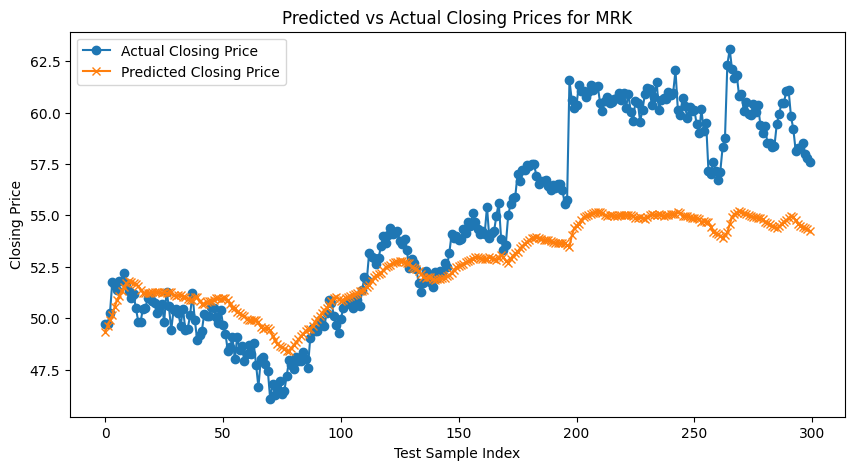

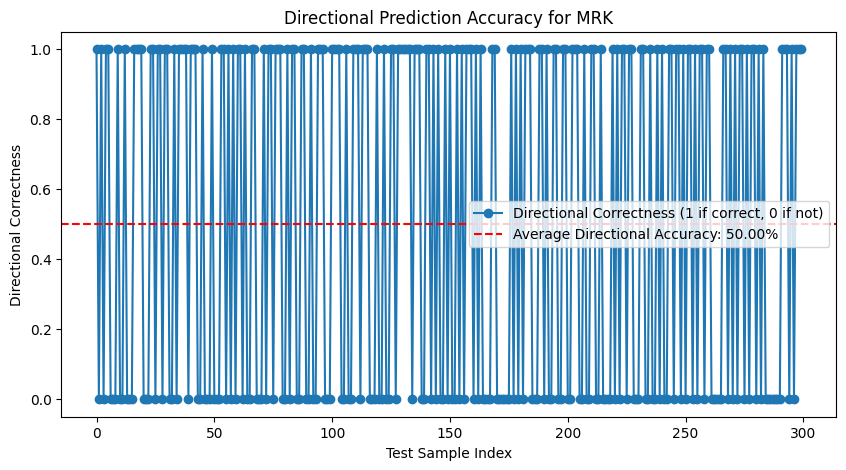

ROC AUC for MRK: 0.54


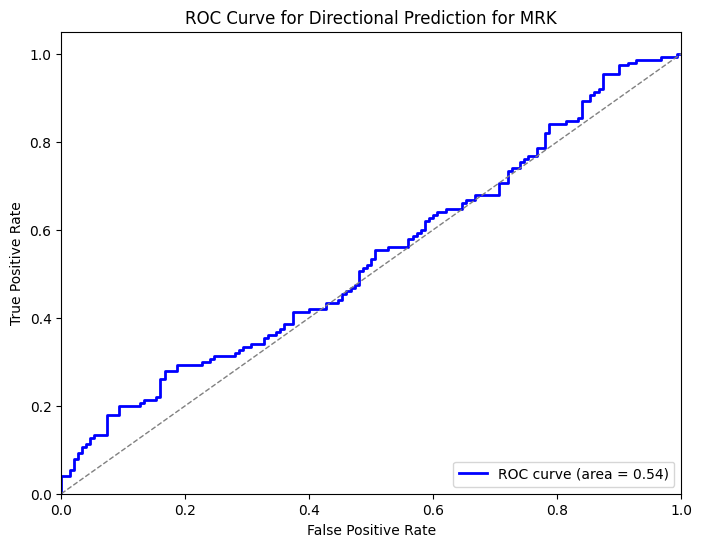


Processing ticker: MSFT
Ticker: MSFT - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 1.8992e-04 - loss: 0.6761 - val_accuracy: 0.0000e+00 - val_loss: 1.2339
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5235 - val_accuracy: 0.0000e+00 - val_loss: 0.8562
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0012 - loss: 0.4310 - val_accuracy: 0.0000e+00 - val_loss: 0.7272
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0015 - loss: 0.4239 - val_accuracy: 0.0000e+00 - val_loss: 0.7265
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.4187 - val_accuracy: 0.0000e+00 - val_loss: 0.7176
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.4285 - val_accuracy: 0.0000e+00 - val_loss: 0.7151
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.4104 - val_accuracy: 0.0000e+00 - val_loss: 0.7126
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.4248 - val_accura

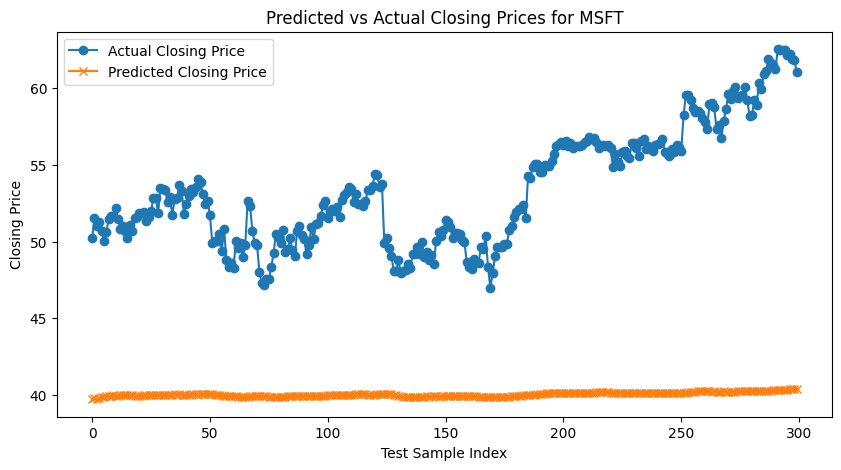

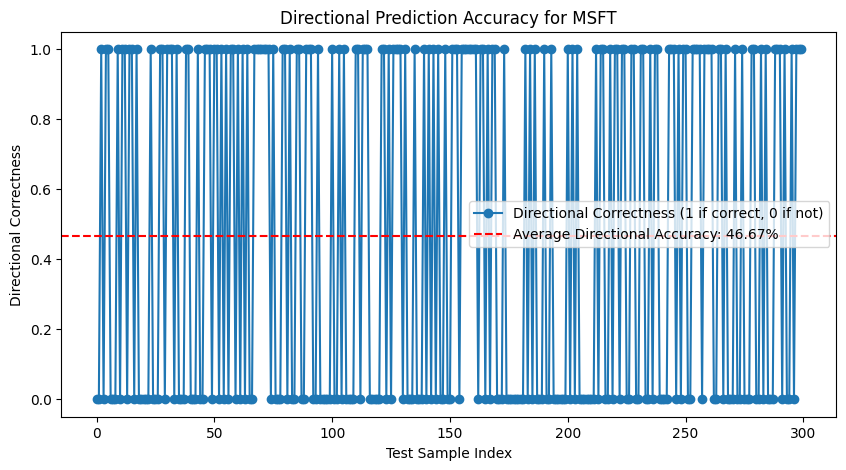

ROC AUC for MSFT: 0.54


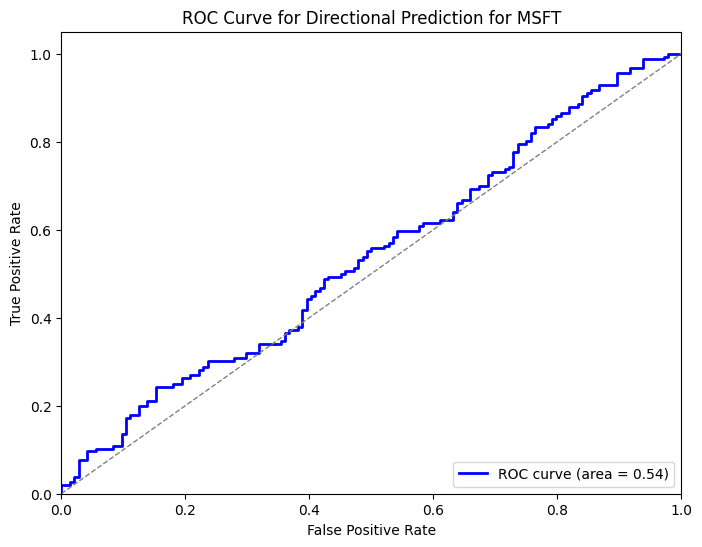


Processing ticker: NVDA
Ticker: NVDA - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 7.0839e-04 - loss: 0.6508 - val_accuracy: 0.0000e+00 - val_loss: 0.3270
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.1980 - val_accuracy: 0.0000e+00 - val_loss: 0.3412
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 0.1728 - val_accuracy: 0.0000e+00 - val_loss: 0.3653
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.1659 - val_accuracy: 0.0000e+00 - val_loss: 0.3839
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.6763e-04 - loss: 0.1663 - val_accuracy: 0.0000e+00 - val_loss: 0.3928
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.1586 - val_accuracy: 0.0000e+00 - val_loss: 0.3554
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.1630 - val_accuracy: 0.0000e+00 - val_loss: 0.3224
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.1550 -

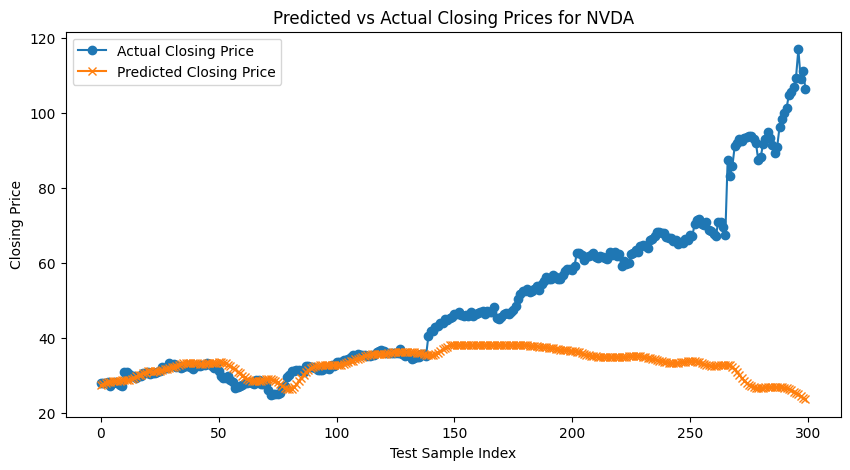

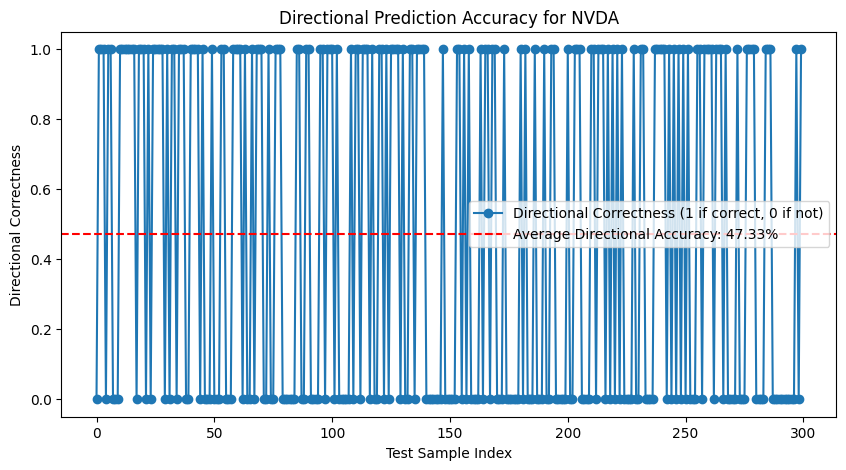

ROC AUC for NVDA: 0.50


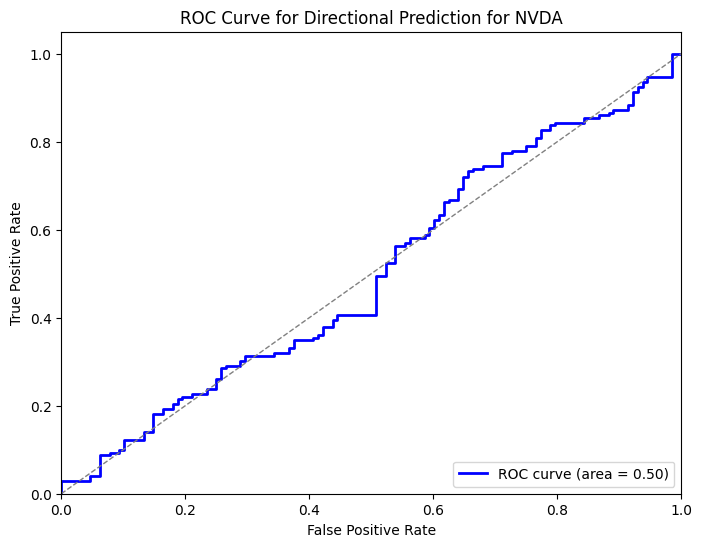


Processing ticker: ORCL
Ticker: ORCL - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0012 - loss: 0.6853 - val_accuracy: 0.0000e+00 - val_loss: 0.7198
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.1723e-04 - loss: 0.6247 - val_accuracy: 0.0033 - val_loss: 0.5524
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5968 - val_accuracy: 0.0033 - val_loss: 0.5334
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.5958 - val_accuracy: 0.0033 - val_loss: 0.5218
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5949 - val_accuracy: 0.0033 - val_loss: 0.5224
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.8992e-04 - loss: 0.5938 - val_accuracy: 0.0033 - val_loss: 0.5188
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 3.6763e-04 - loss: 0.5899 - val_accuracy: 0.0033 - val_loss: 0.5227
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5940 - val_accuracy: 0.003

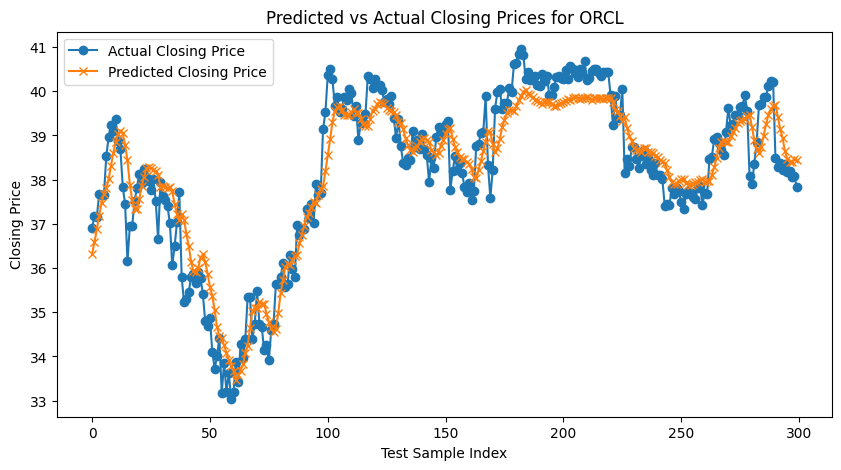

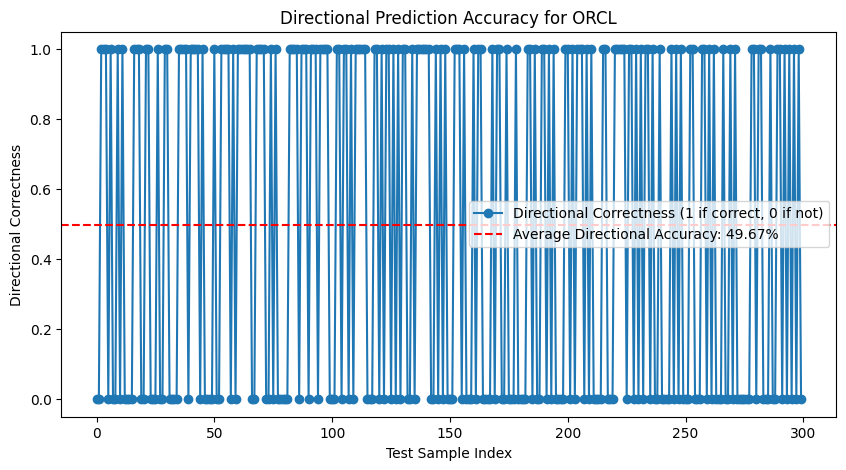

ROC AUC for ORCL: 0.57


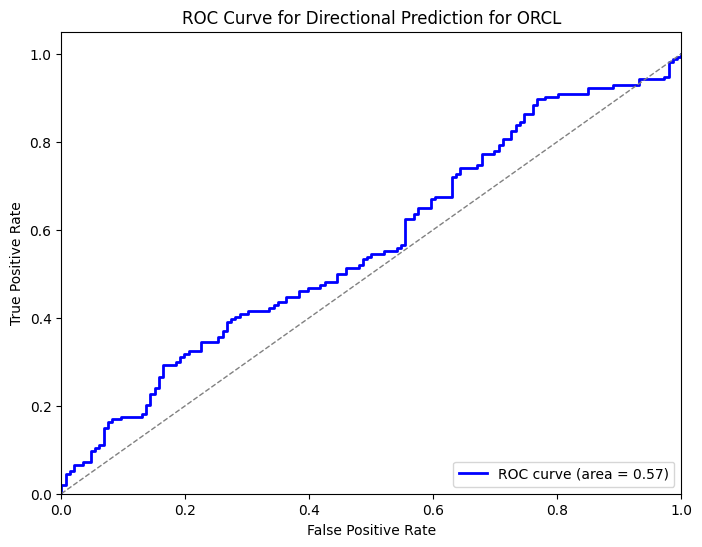


Processing ticker: PEP
Ticker: PEP - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 6.4328e-04 - loss: 0.6623 - val_accuracy: 0.0000e+00 - val_loss: 1.2111
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0016 - loss: 0.5627 - val_accuracy: 0.0000e+00 - val_loss: 0.7255
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.7783e-04 - loss: 0.4930 - val_accuracy: 0.0000e+00 - val_loss: 0.7337
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 3.2028e-04 - loss: 0.4871 - val_accuracy: 0.0000e+00 - val_loss: 0.7133
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 0.4939 - val_accuracy: 0.0000e+00 - val_loss: 0.6904
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.4951 - val_accuracy: 0.0000e+00 - val_loss: 0.6729
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 0.4934 - val_accuracy: 0.0000e+00 - val_loss: 0.6677
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 8.5224e-04 - loss: 0.48

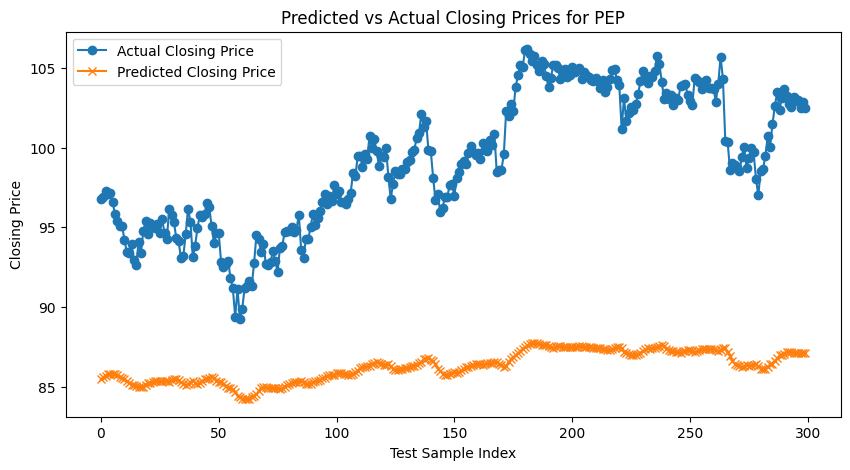

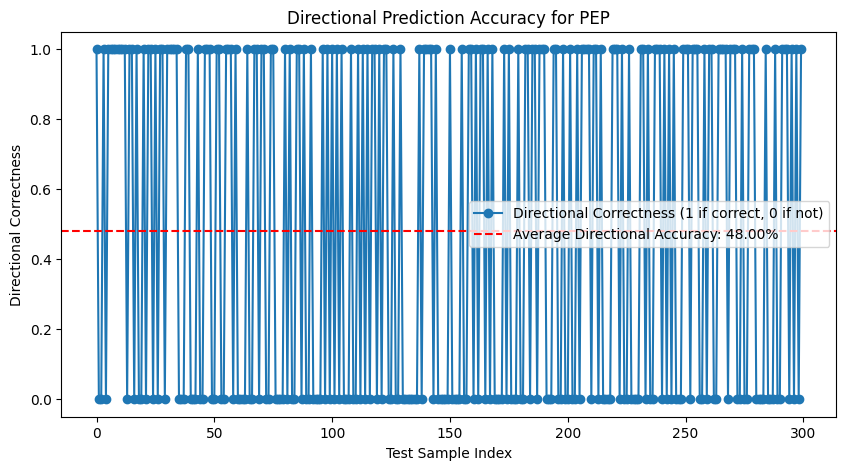

ROC AUC for PEP: 0.56


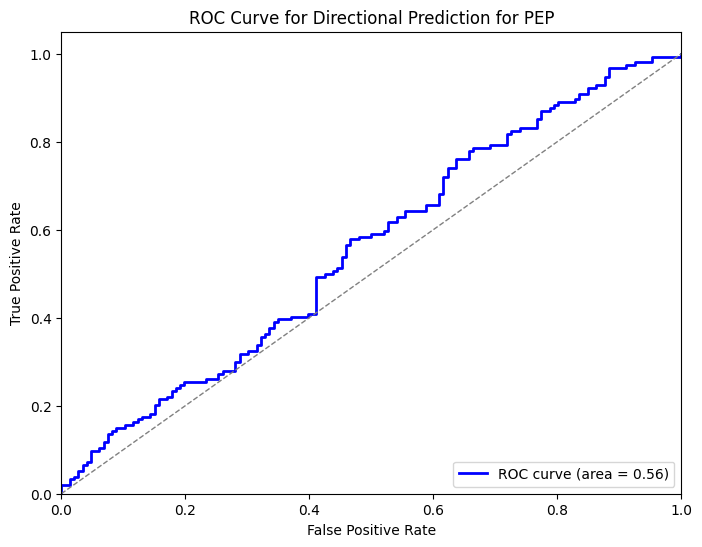


Processing ticker: PFE
Ticker: PFE - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0000e+00 - loss: 0.6906 - val_accuracy: 0.0000e+00 - val_loss: 0.7333
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.6676 - val_accuracy: 0.0000e+00 - val_loss: 0.6605
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5766 - val_accuracy: 0.0000e+00 - val_loss: 0.6304
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.5649 - val_accuracy: 0.0000e+00 - val_loss: 0.6052
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5599 - val_accuracy: 0.0000e+00 - val_loss: 0.5890
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0031 - loss: 0.5603 - val_accuracy: 0.0000e+00 - val_loss: 0.5872
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.5622 - val_accuracy: 0.0000e+00 - val_loss: 0.5872
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5538 - val_acc

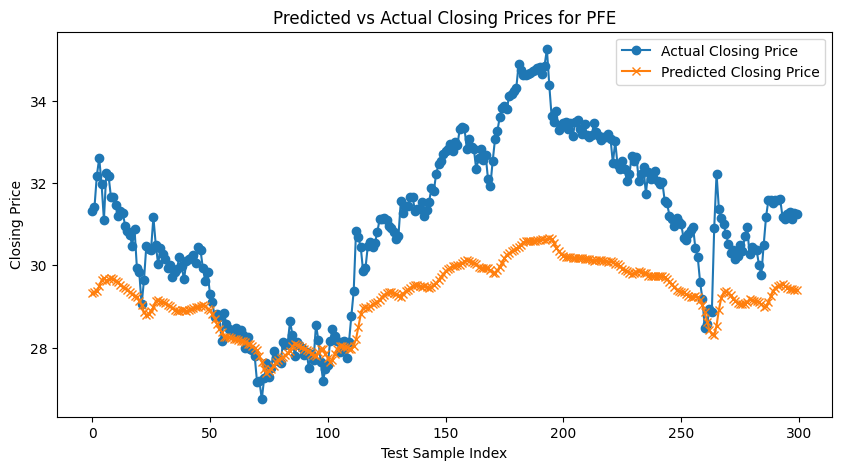

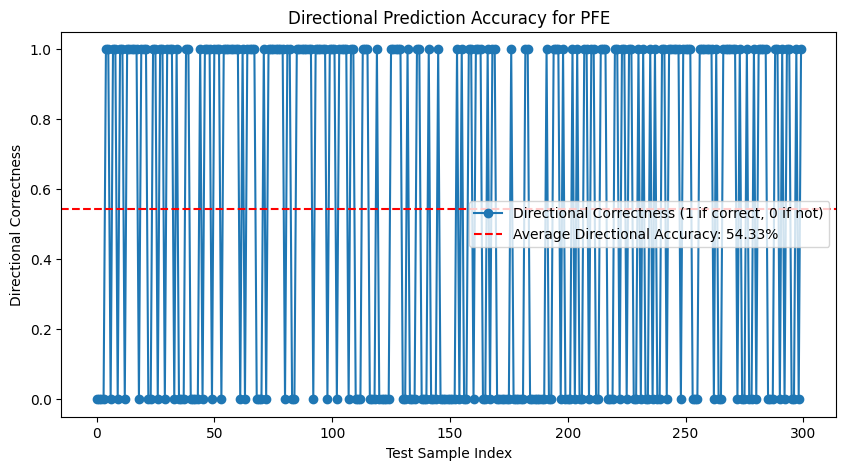

ROC AUC for PFE: 0.49


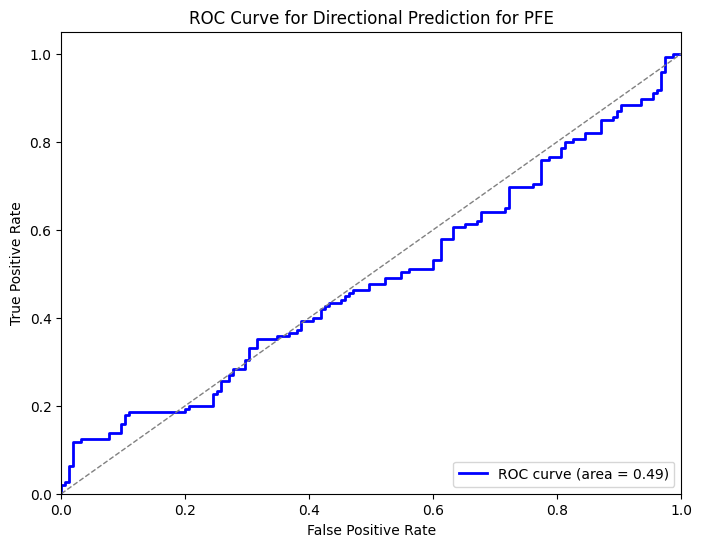


Processing ticker: PG
Ticker: PG - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 1.1128e-04 - loss: 0.6862 - val_accuracy: 0.0000e+00 - val_loss: 0.7507
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5942 - val_accuracy: 0.0000e+00 - val_loss: 0.6496
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.3159e-04 - loss: 0.5355 - val_accuracy: 0.0000e+00 - val_loss: 0.6430
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 5.2414e-04 - loss: 0.5346 - val_accuracy: 0.0000e+00 - val_loss: 0.6341
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0018 - loss: 0.5363 - val_accuracy: 0.0000e+00 - val_loss: 0.6251
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3237e-04 - loss: 0.5371 - val_accuracy: 0.0000e+00 - val_loss: 0.6183
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.0839e-04 - loss: 0.5347 - val_accuracy: 0.0000e+00 - val_loss: 0.6150
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 4.1723e-04 - lo

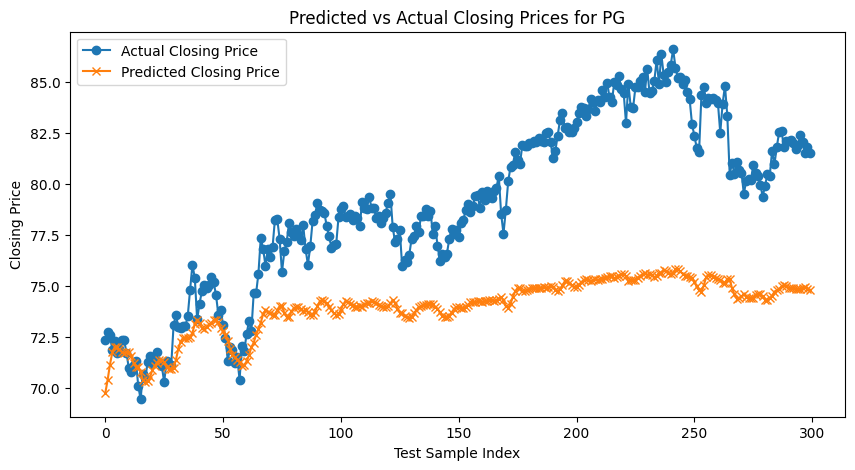

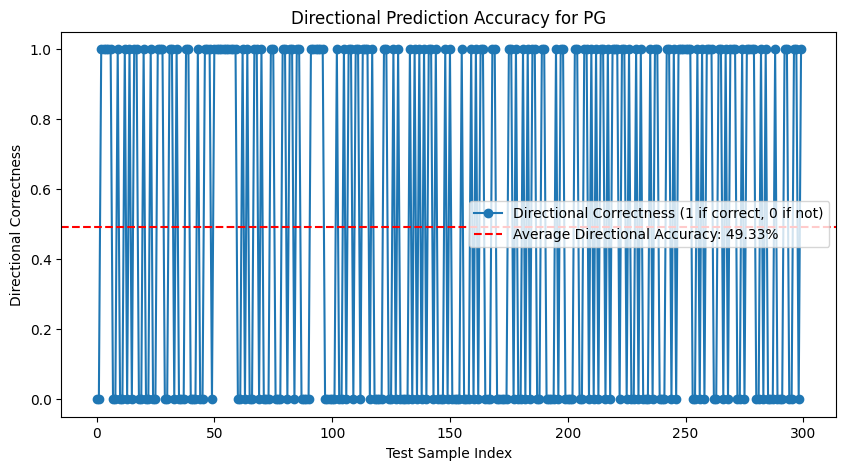

ROC AUC for PG: 0.56


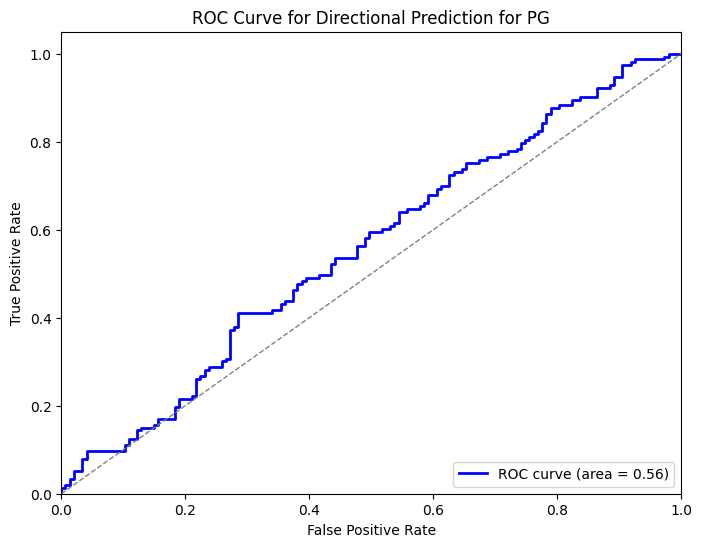


Processing ticker: PGR
Ticker: PGR - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.0023 - loss: 0.6654 - val_accuracy: 0.0000e+00 - val_loss: 0.8731
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.8992e-04 - loss: 0.5612 - val_accuracy: 0.0000e+00 - val_loss: 0.7148
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 5.2414e-04 - loss: 0.5281 - val_accuracy: 0.0000e+00 - val_loss: 0.7242
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.5163 - val_accuracy: 0.0000e+00 - val_loss: 0.7190
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0010 - loss: 0.5152 - val_accuracy: 0.0000e+00 - val_loss: 0.7177
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.5261 - val_accuracy: 0.0000e+00 - val_loss: 0.7153
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.5152 - val_accuracy: 0.0000e+00 - val_loss: 0.7168
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.4328e-04 - loss: 0.51

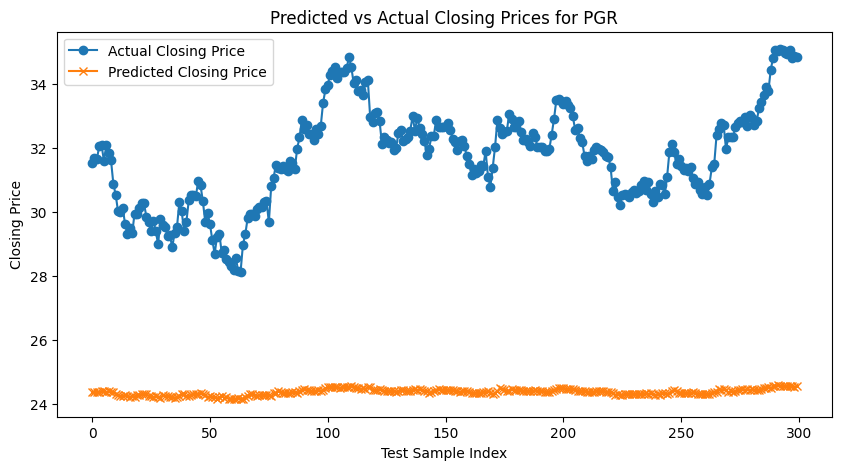

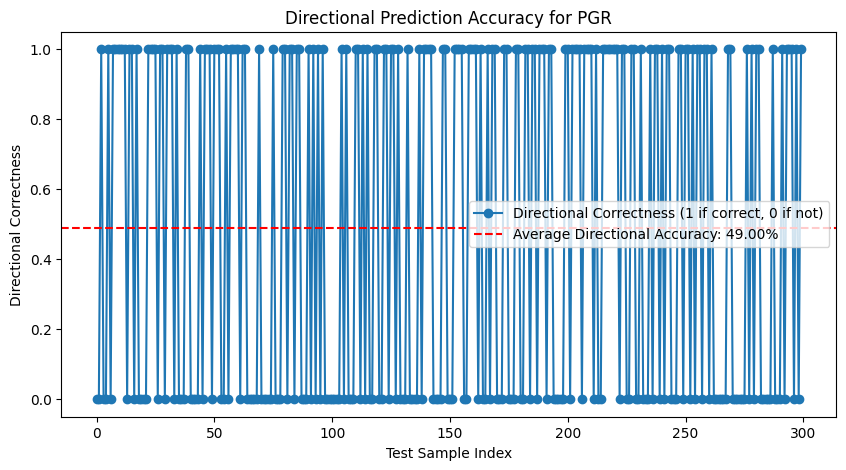

ROC AUC for PGR: 0.51


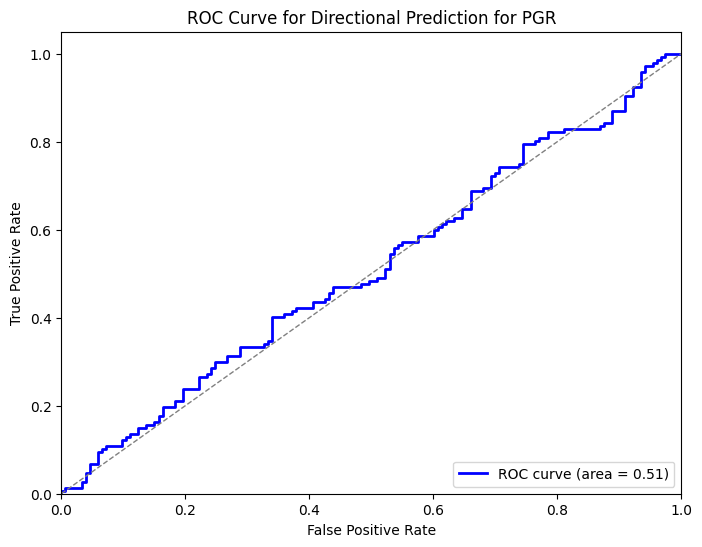


Processing ticker: QCOM
Ticker: QCOM - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 5.8201e-04 - loss: 0.6920 - val_accuracy: 0.0000e+00 - val_loss: 0.6380
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0020 - loss: 0.6195 - val_accuracy: 0.0000e+00 - val_loss: 0.5949
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0034 - loss: 0.5757 - val_accuracy: 0.0000e+00 - val_loss: 0.5930
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0016 - loss: 0.5670 - val_accuracy: 0.0000e+00 - val_loss: 0.5918
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.5187e-04 - loss: 0.5744 - val_accuracy: 0.0000e+00 - val_loss: 0.5941
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.5720 - val_accuracy: 0.0000e+00 - val_loss: 0.5913
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0040 - loss: 0.5598 - val_accuracy: 0.0000e+00 - val_loss: 0.5910
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0014 - loss: 0.5628 - val_ac

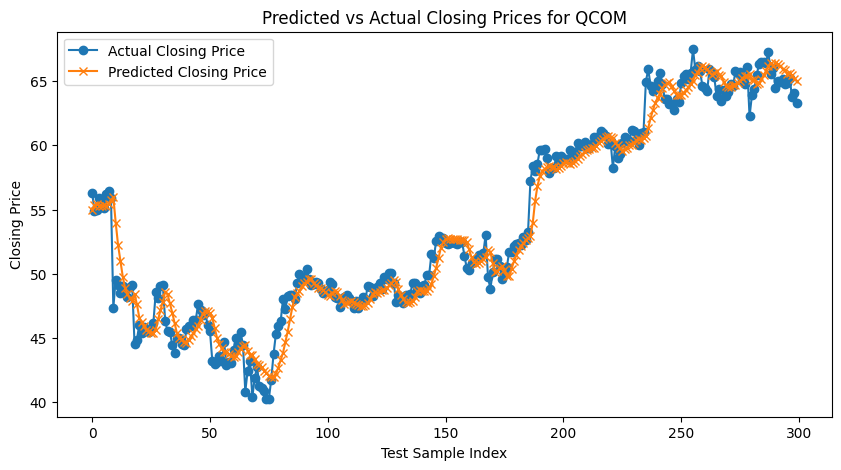

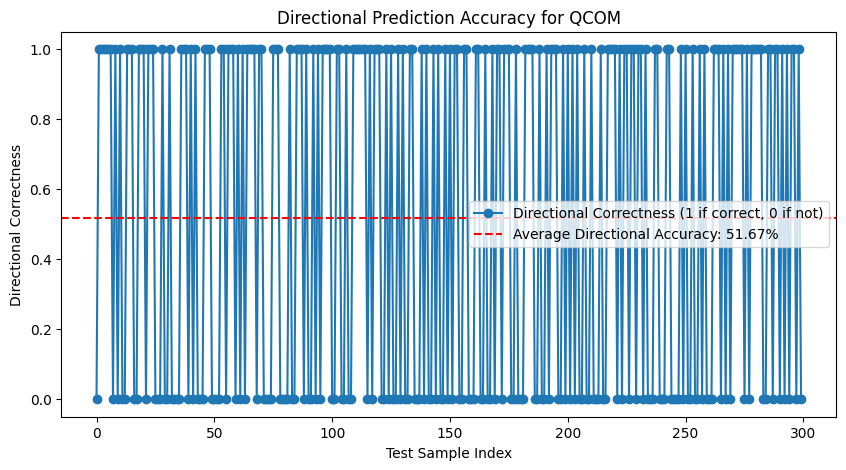

ROC AUC for QCOM: 0.56


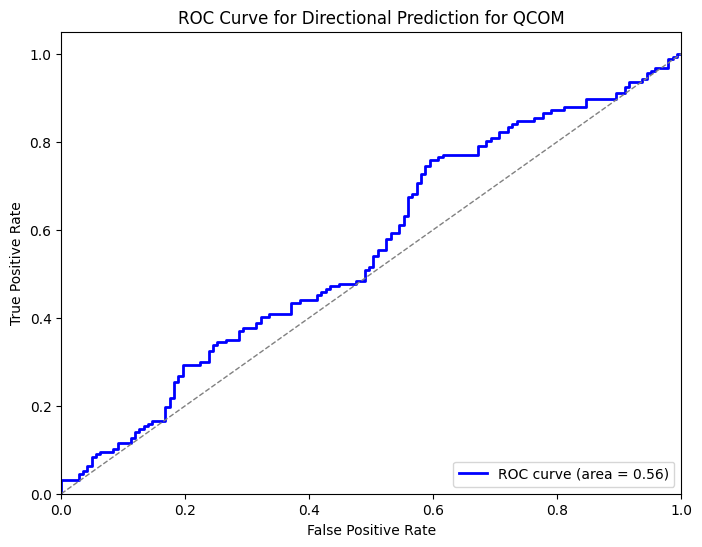


Processing ticker: SMFG
Ticker: SMFG - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0041 - loss: 0.6806 - val_accuracy: 0.0000e+00 - val_loss: 0.6724
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.5822 - val_accuracy: 0.0000e+00 - val_loss: 0.6627
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0028 - loss: 0.5149 - val_accuracy: 0.0000e+00 - val_loss: 0.6596
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0024 - loss: 0.4996 - val_accuracy: 0.0000e+00 - val_loss: 0.6611
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0056 - loss: 0.5030 - val_accuracy: 0.0000e+00 - val_loss: 0.6601
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.9924e-04 - loss: 0.5119 - val_accuracy: 0.0000e+00 - val_loss: 0.6594
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0049 - loss: 0.5095 - val_accuracy: 0.0000e+00 - val_loss: 0.6602
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0028 - loss: 0.5065 - val_accurac

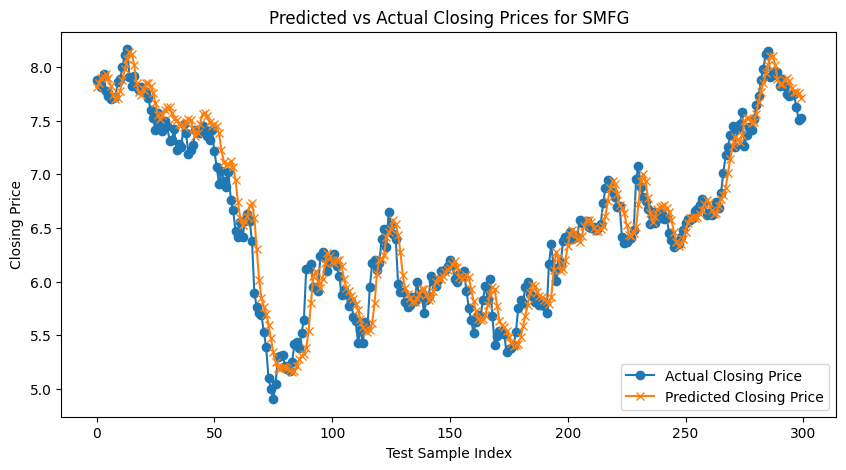

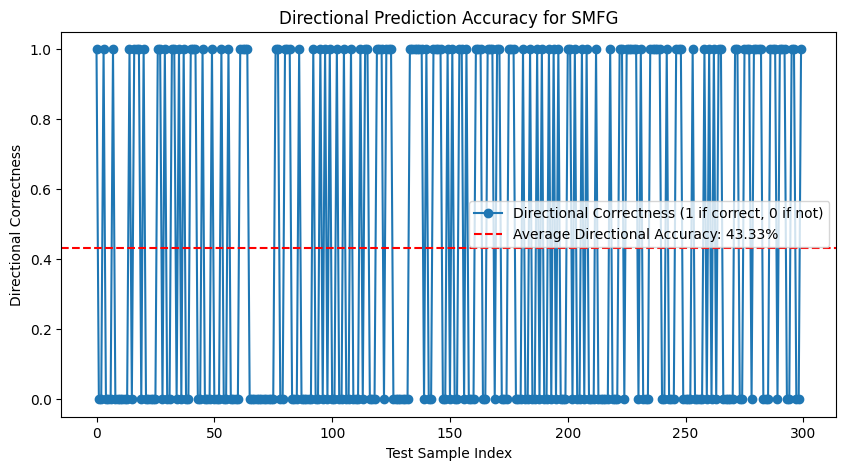

ROC AUC for SMFG: 0.45


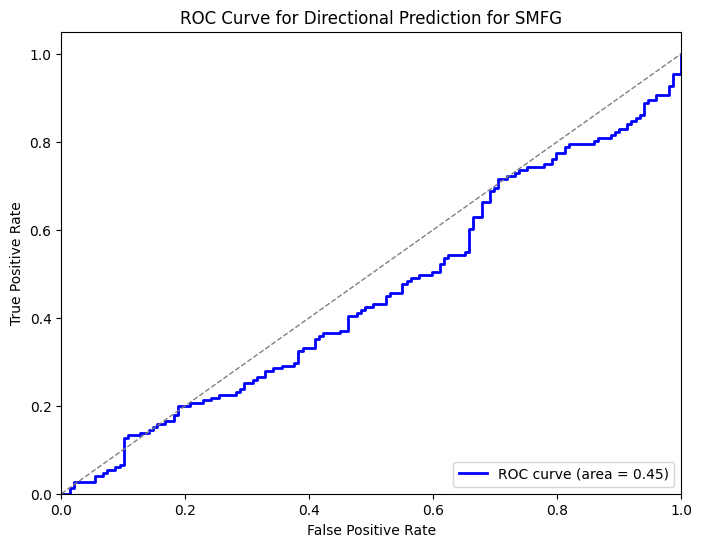


Processing ticker: SPGI
Ticker: SPGI - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 2.3159e-04 - loss: 0.6712 - val_accuracy: 0.0000e+00 - val_loss: 1.3685
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.6932e-04 - loss: 0.5264 - val_accuracy: 0.0000e+00 - val_loss: 0.8775
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.4580 - val_accuracy: 0.0000e+00 - val_loss: 0.7865
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.8201e-04 - loss: 0.4537 - val_accuracy: 0.0000e+00 - val_loss: 0.7773
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.4448 - val_accuracy: 0.0000e+00 - val_loss: 0.7665
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.4474 - val_accuracy: 0.0000e+00 - val_loss: 0.7583
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.8201e-04 - loss: 0.4391 - val_accuracy: 0.0000e+00 - val_loss: 0.7530
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 

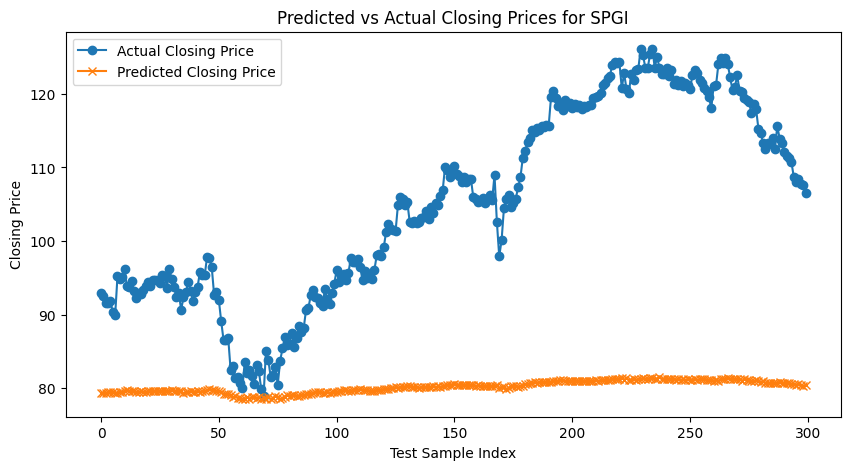

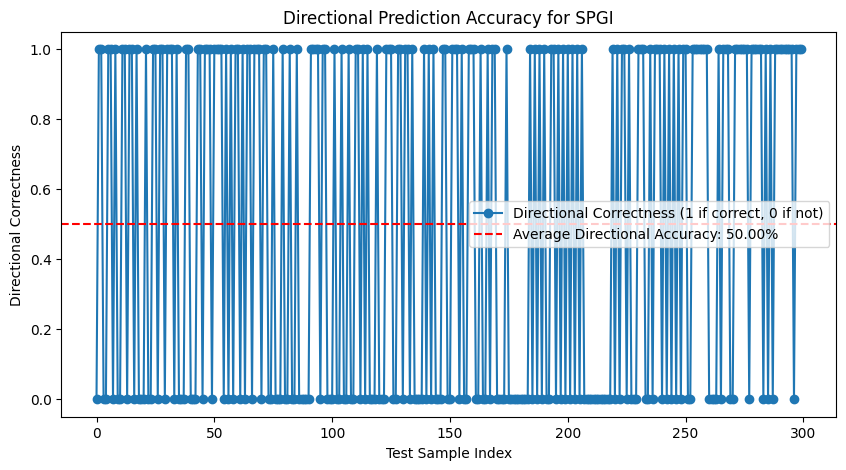

ROC AUC for SPGI: 0.54


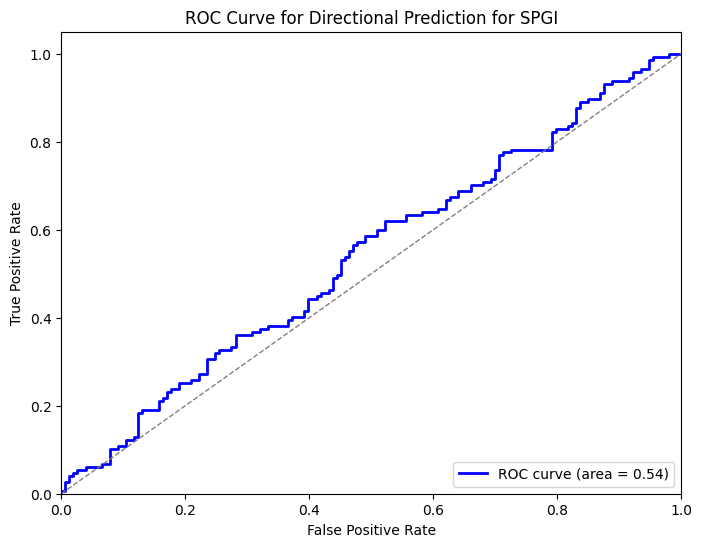


Processing ticker: SYK
Ticker: SYK - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 4.1723e-04 - loss: 0.6498 - val_accuracy: 0.0000e+00 - val_loss: 1.3443
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.5753 - val_accuracy: 0.0000e+00 - val_loss: 0.9571
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.1128e-04 - loss: 0.5101 - val_accuracy: 0.0000e+00 - val_loss: 0.7683
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.4842 - val_accuracy: 0.0000e+00 - val_loss: 0.7357
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0015 - loss: 0.4853 - val_accuracy: 0.0000e+00 - val_loss: 0.7263
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.4328e-04 - loss: 0.5012 - val_accuracy: 0.0000e+00 - val_loss: 0.7155
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.4328e-04 - loss: 0.4865 - val_accuracy: 0.0000e+00 - val_loss: 0.7043
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 

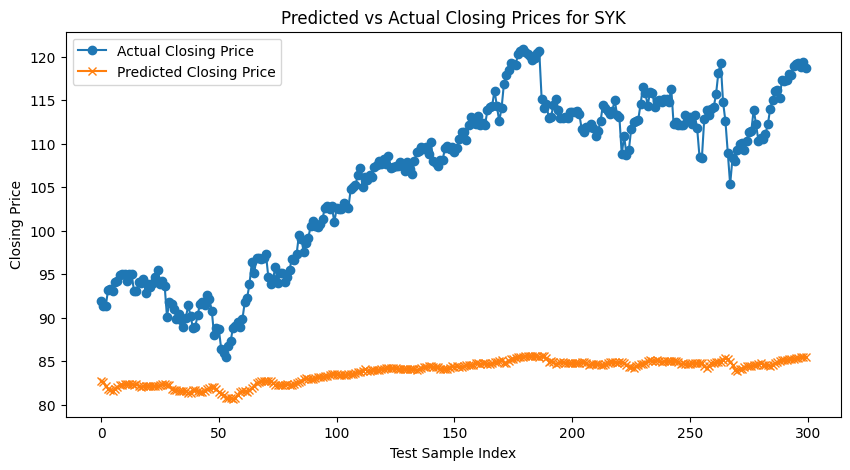

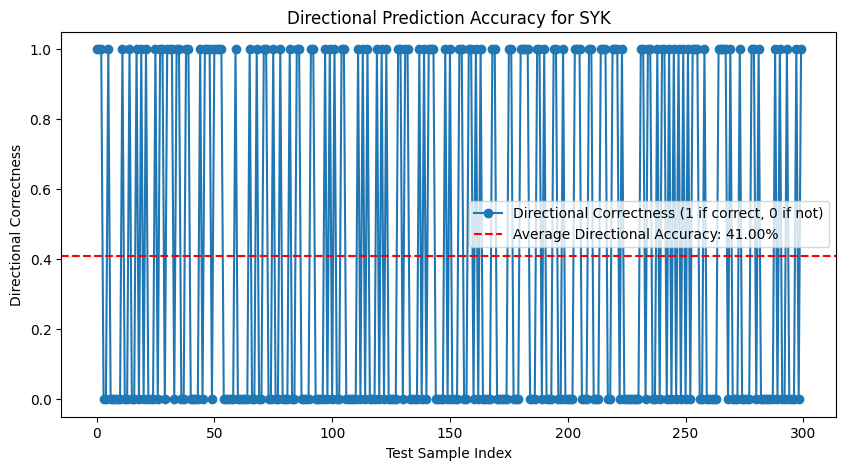

ROC AUC for SYK: 0.54


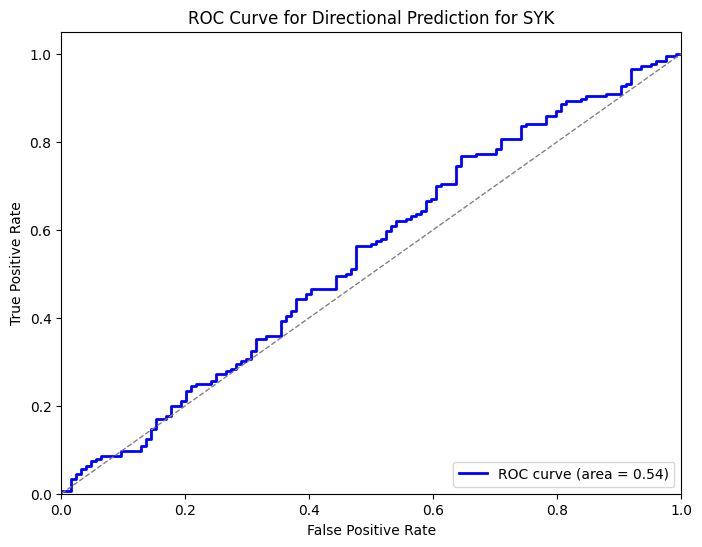


Processing ticker: T
Ticker: T - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 2.3159e-04 - loss: 0.6692 - val_accuracy: 0.0000e+00 - val_loss: 0.7479
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.6265 - val_accuracy: 0.0000e+00 - val_loss: 0.6936
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.5631 - val_accuracy: 0.0000e+00 - val_loss: 0.6957
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0023 - loss: 0.5443 - val_accuracy: 0.0000e+00 - val_loss: 0.6941
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 8.5224e-04 - loss: 0.5495 - val_accuracy: 0.0000e+00 - val_loss: 0.6936
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0023 - loss: 0.5479 - val_accuracy: 0.0000e+00 - val_loss: 0.6945
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4986e-04 - loss: 0.5519 - val_accuracy: 0.0000e+00 - val_loss: 0.6930
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0023 - loss: 0.5497 - va

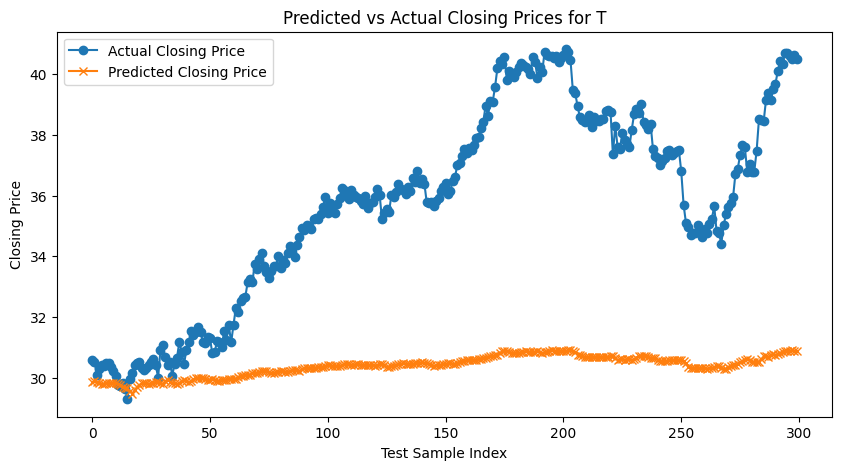

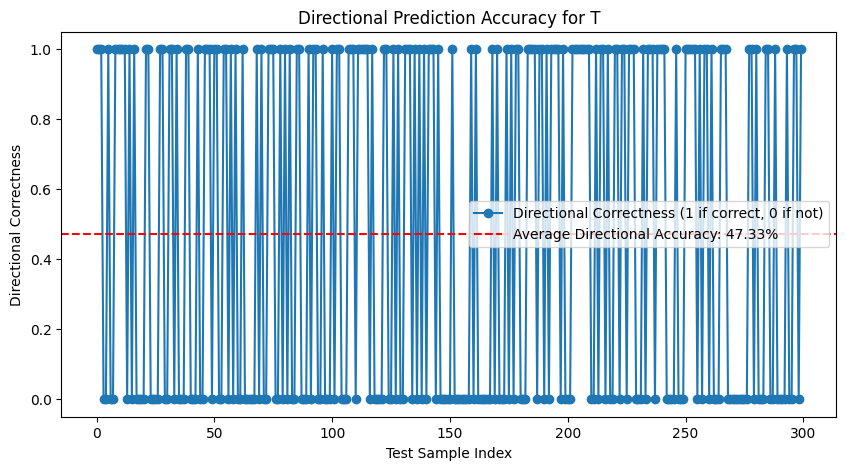

ROC AUC for T: 0.55


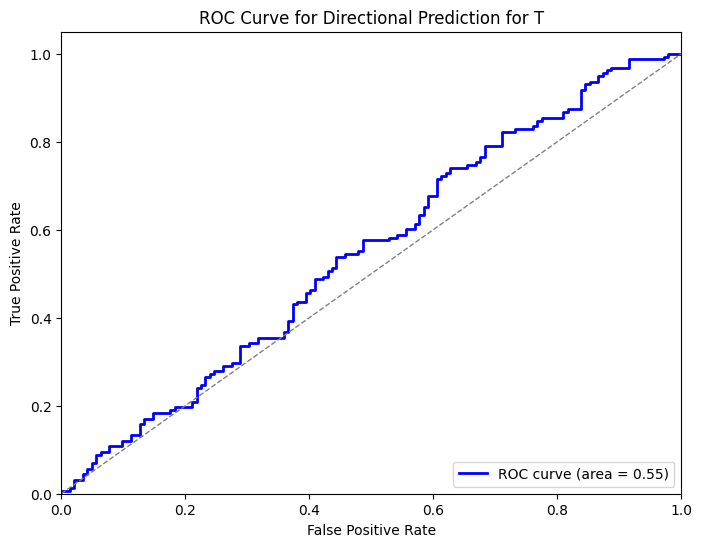


Processing ticker: TMO
Ticker: TMO - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.0013 - loss: 0.6782 - val_accuracy: 0.0000e+00 - val_loss: 0.9066
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.5273 - val_accuracy: 0.0000e+00 - val_loss: 0.6451
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.4736 - val_accuracy: 0.0000e+00 - val_loss: 0.6196
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.4761 - val_accuracy: 0.0000e+00 - val_loss: 0.6033
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.4667 - val_accuracy: 0.0000e+00 - val_loss: 0.5992
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 8.5224e-04 - loss: 0.4785 - val_accuracy: 0.0000e+00 - val_loss: 0.5973
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3237e-04 - loss: 0.4718 - val_accuracy: 0.0000e+00 - val_loss: 0.6045
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0026 - loss: 0.4690 - val_ac

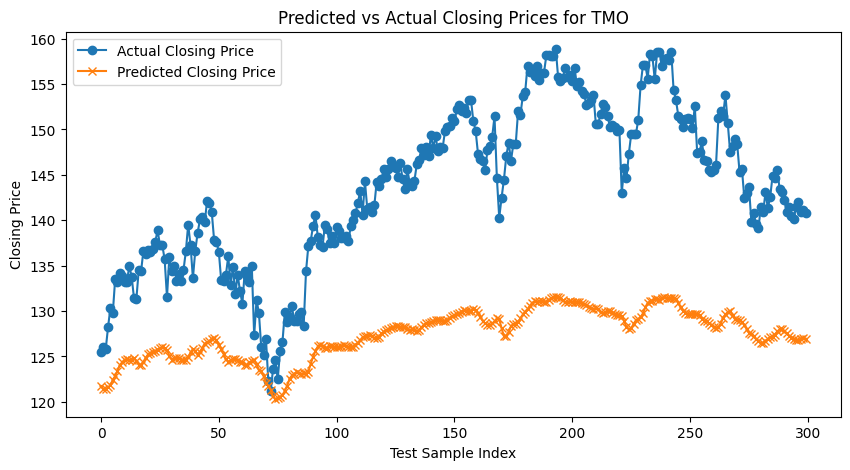

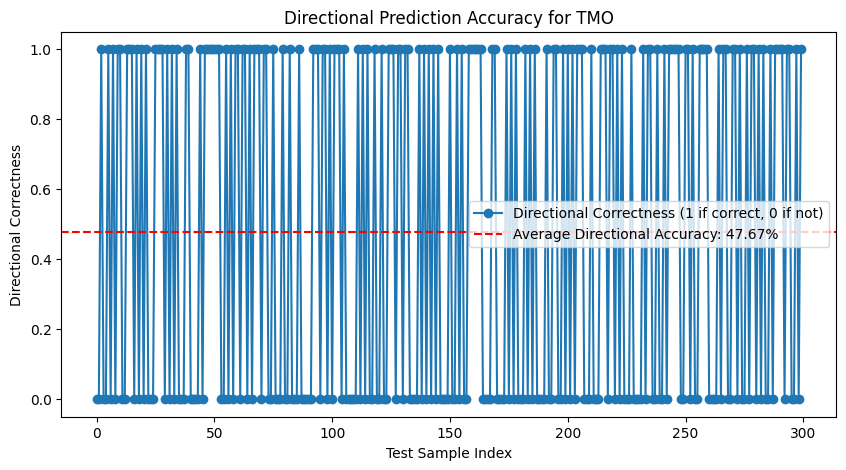

ROC AUC for TMO: 0.53


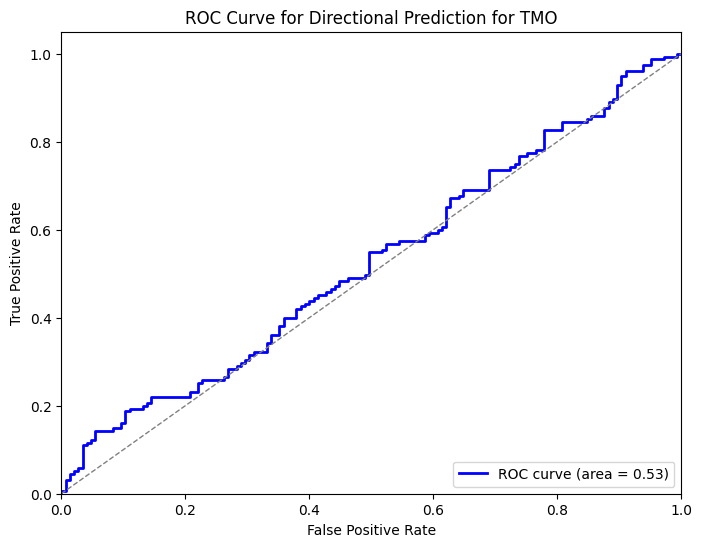


Processing ticker: TXN
Ticker: TXN - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 1.1128e-04 - loss: 0.6428 - val_accuracy: 0.0000e+00 - val_loss: 1.1725
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5089 - val_accuracy: 0.0000e+00 - val_loss: 0.7437
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 0.4529 - val_accuracy: 0.0000e+00 - val_loss: 0.7482
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.8201e-04 - loss: 0.4461 - val_accuracy: 0.0000e+00 - val_loss: 0.7309
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.4449 - val_accuracy: 0.0000e+00 - val_loss: 0.7235
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.4546 - val_accuracy: 0.0000e+00 - val_loss: 0.7204
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.4421 - val_accuracy: 0.0000e+00 - val_loss: 0.7145
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.4466 - val

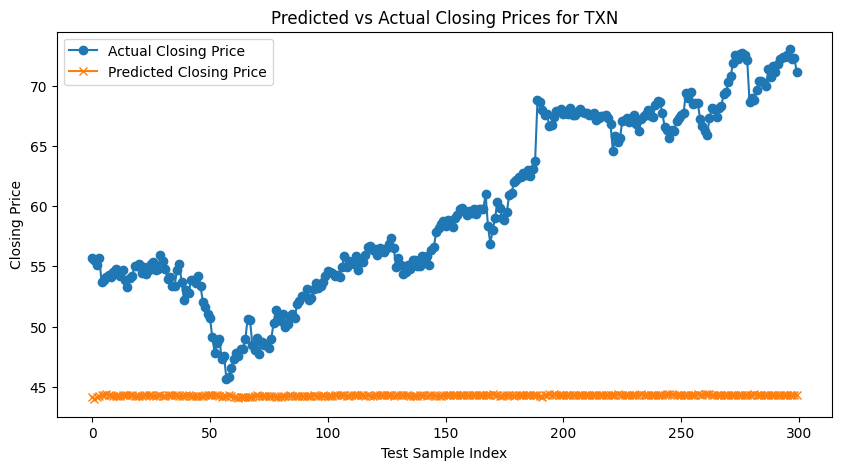

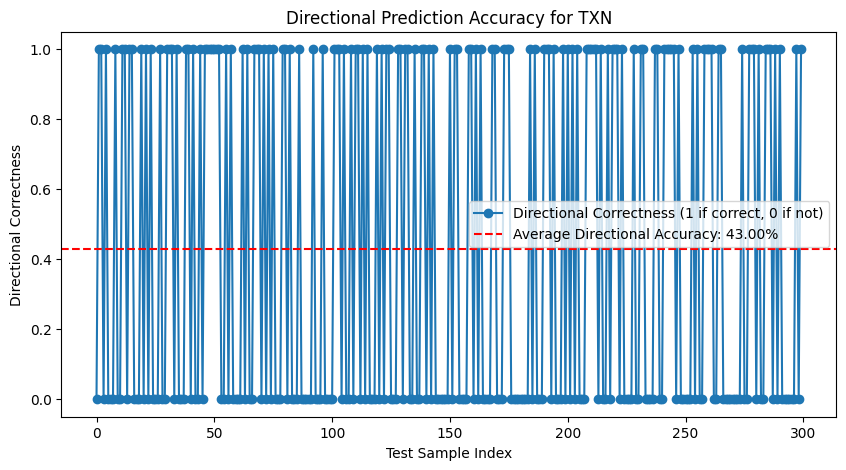

ROC AUC for TXN: 0.53


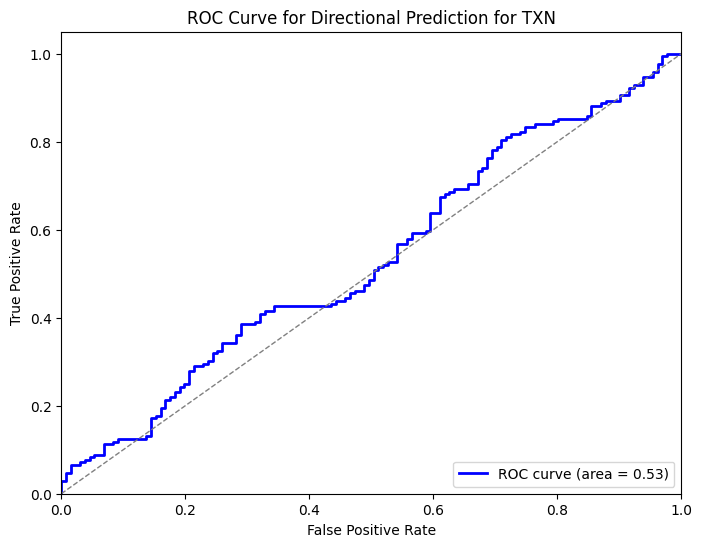


Processing ticker: UNH
Ticker: UNH - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0000e+00 - loss: 0.6547 - val_accuracy: 0.0000e+00 - val_loss: 1.7534
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.4878 - val_accuracy: 0.0000e+00 - val_loss: 1.0003
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.4465 - val_accuracy: 0.0000e+00 - val_loss: 0.7614
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.4276 - val_accuracy: 0.0000e+00 - val_loss: 0.7698
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.4292 - val_accuracy: 0.0000e+00 - val_loss: 0.7684
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - loss: 0.4323 - val_accuracy: 0.0000e+00 - val_loss: 0.7709
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.4273 - val_accuracy: 0.0000e+00 - val_loss: 0.7662
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 

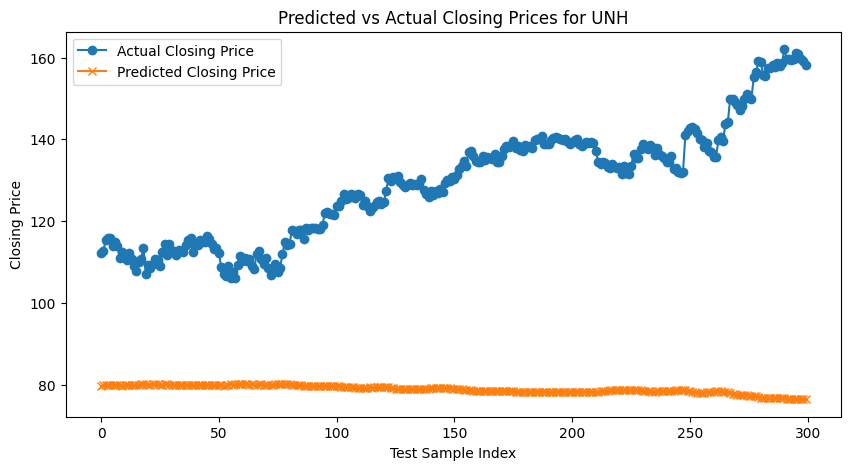

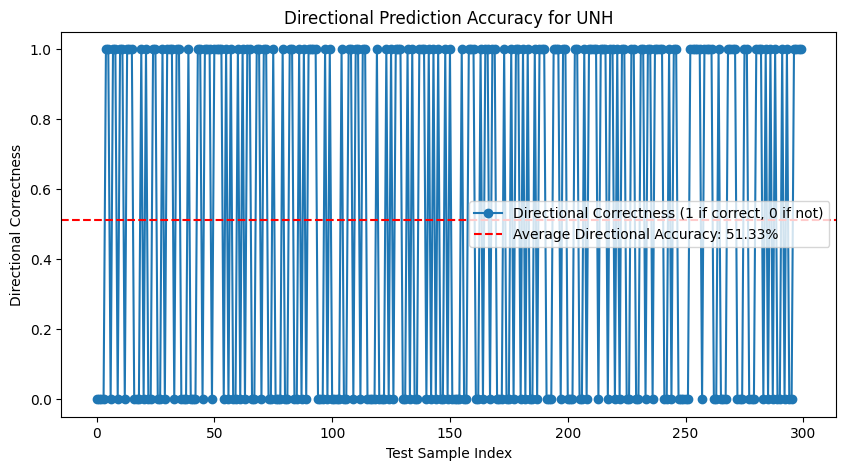

ROC AUC for UNH: 0.55


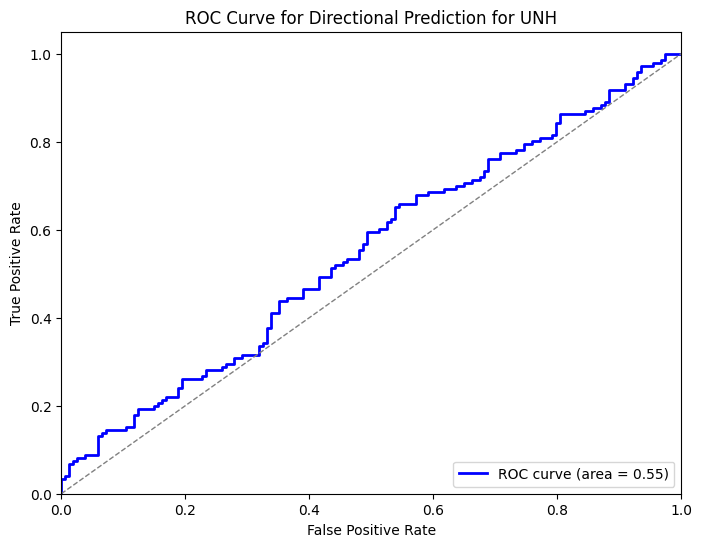


Processing ticker: UNP
Ticker: UNP - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.0042 - loss: 0.6700 - val_accuracy: 0.0000e+00 - val_loss: 0.7831
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0013 - loss: 0.5432 - val_accuracy: 0.0033 - val_loss: 0.6593
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.7783e-04 - loss: 0.5333 - val_accuracy: 0.0033 - val_loss: 0.6236
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 3.2028e-04 - loss: 0.5282 - val_accuracy: 0.0033 - val_loss: 0.5951
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5272 - val_accuracy: 0.0033 - val_loss: 0.5718
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0023 - loss: 0.5378 - val_accuracy: 0.0033 - val_loss: 0.5537
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 7.0839e-04 - loss: 0.5259 - val_accuracy: 0.0033 - val_loss: 0.5415
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 2.3159e-04 - loss: 0.5318 - val_accuracy: 0.003

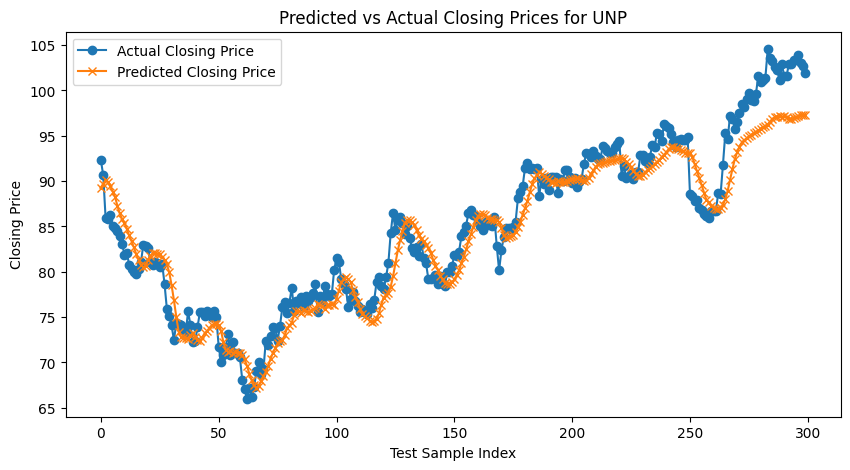

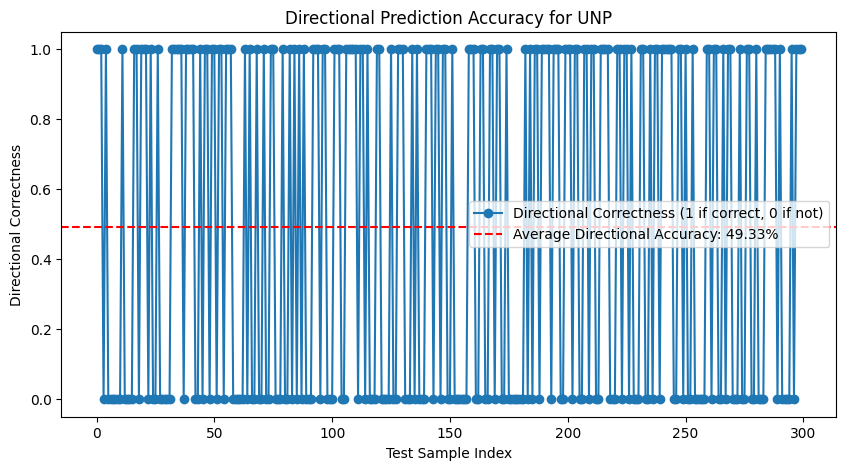

ROC AUC for UNP: 0.51


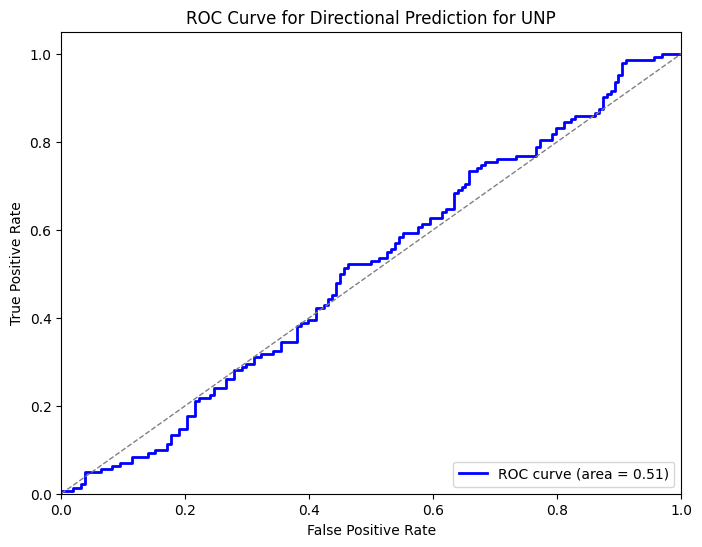


Processing ticker: VZ
Ticker: VZ - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 3.6763e-04 - loss: 0.6848 - val_accuracy: 0.0000e+00 - val_loss: 0.7204
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.5825 - val_accuracy: 0.0000e+00 - val_loss: 0.6740
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0042 - loss: 0.5599 - val_accuracy: 0.0000e+00 - val_loss: 0.6694
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.1128e-04 - loss: 0.5557 - val_accuracy: 0.0000e+00 - val_loss: 0.6672
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0026 - loss: 0.5543 - val_accuracy: 0.0000e+00 - val_loss: 0.6671
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.1723e-04 - loss: 0.5628 - val_accuracy: 0.0000e+00 - val_loss: 0.6648
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 5.2414e-04 - loss: 0.5463 - val_accuracy: 0.0000e+00 - val_loss: 0.6655
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.5386 -

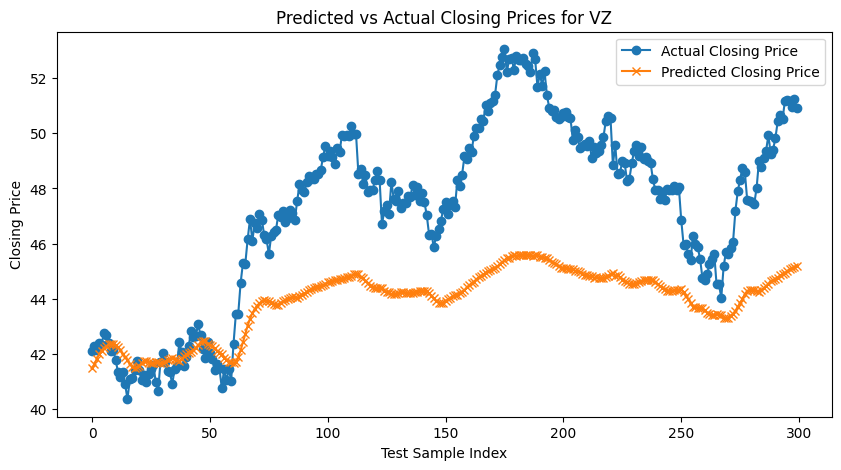

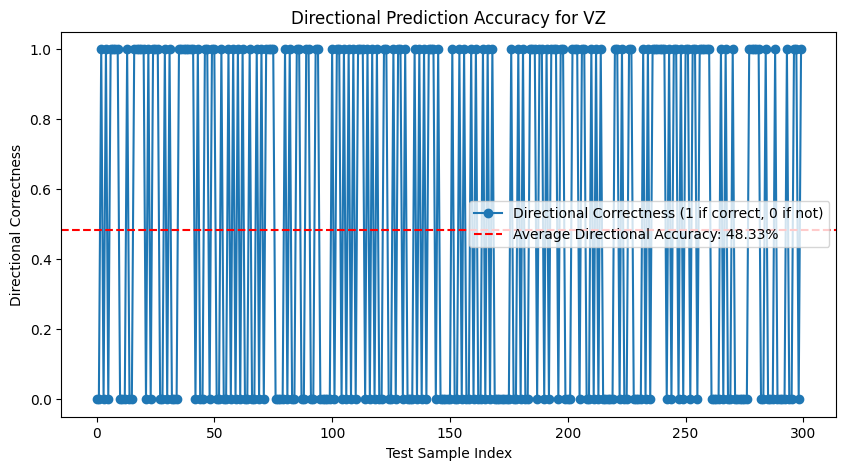

ROC AUC for VZ: 0.52


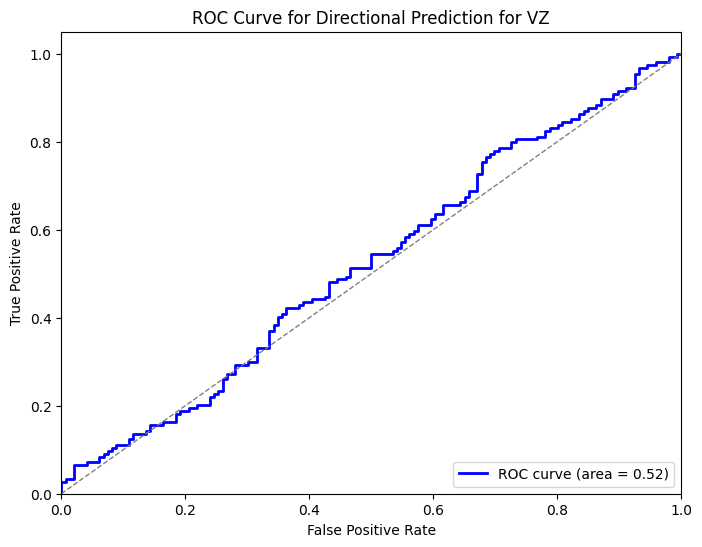


Processing ticker: WFC
Ticker: WFC - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 8.5224e-04 - loss: 0.6952 - val_accuracy: 0.0000e+00 - val_loss: 0.7532
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0013 - loss: 0.6220 - val_accuracy: 0.0000e+00 - val_loss: 0.4708
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.5557 - val_accuracy: 0.0000e+00 - val_loss: 0.5055
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0011 - loss: 0.5437 - val_accuracy: 0.0000e+00 - val_loss: 0.4782
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0018 - loss: 0.5374 - val_accuracy: 0.0000e+00 - val_loss: 0.4603
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.4986e-04 - loss: 0.5469 - val_accuracy: 0.0000e+00 - val_loss: 0.4548
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.1723e-04 - loss: 0.5386 - val_accuracy: 0.0000e+00 - val_loss: 0.4583
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.7499e-04 - loss: 0.53

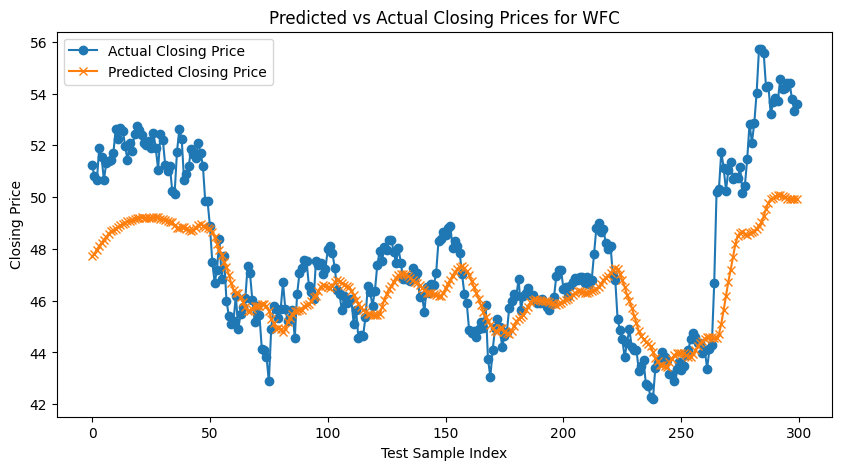

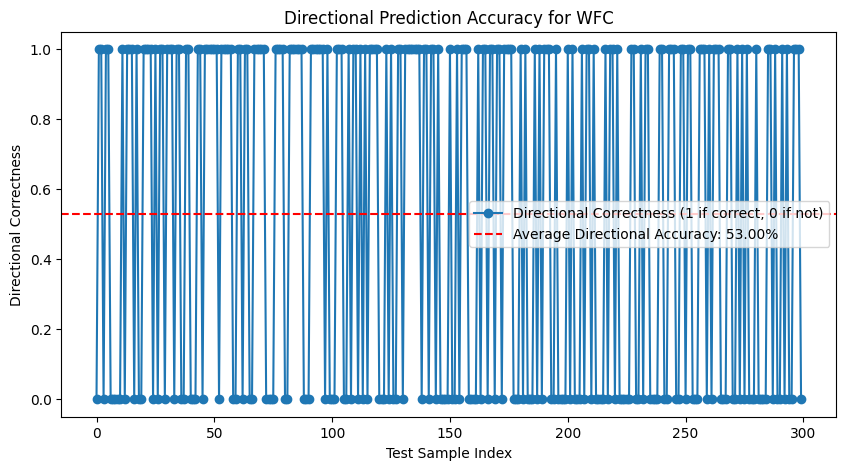

ROC AUC for WFC: 0.54


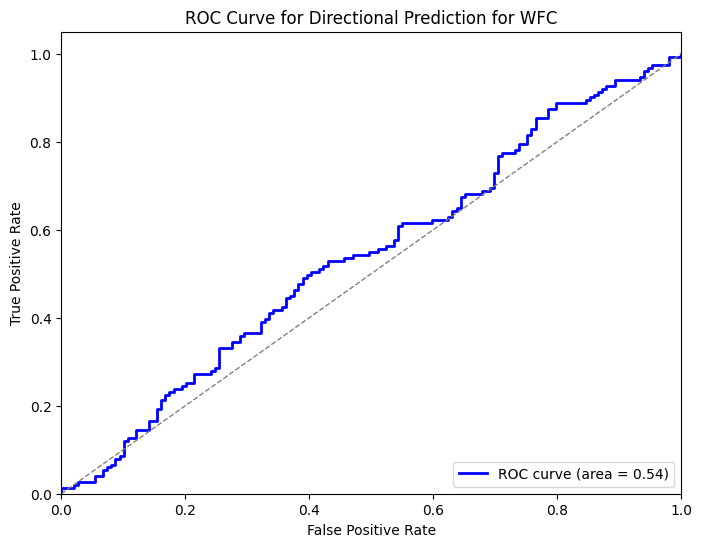


Processing ticker: WMT
Ticker: WMT - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.0013 - loss: 0.6853 - val_accuracy: 0.0033 - val_loss: 0.6393
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0011 - loss: 0.5992 - val_accuracy: 0.0033 - val_loss: 0.6095
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.5687 - val_accuracy: 0.0033 - val_loss: 0.6095
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 7.0839e-04 - loss: 0.5694 - val_accuracy: 0.0033 - val_loss: 0.5861
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0012 - loss: 0.5668 - val_accuracy: 0.0033 - val_loss: 0.5854
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 4.1723e-04 - loss: 0.5744 - val_accuracy: 0.0033 - val_loss: 0.5816
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0020 - loss: 0.5672 - val_accuracy: 0.0033 - val_loss: 0.5843
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0010 - loss: 0.5678 - val_accuracy: 0.0033 - val_los

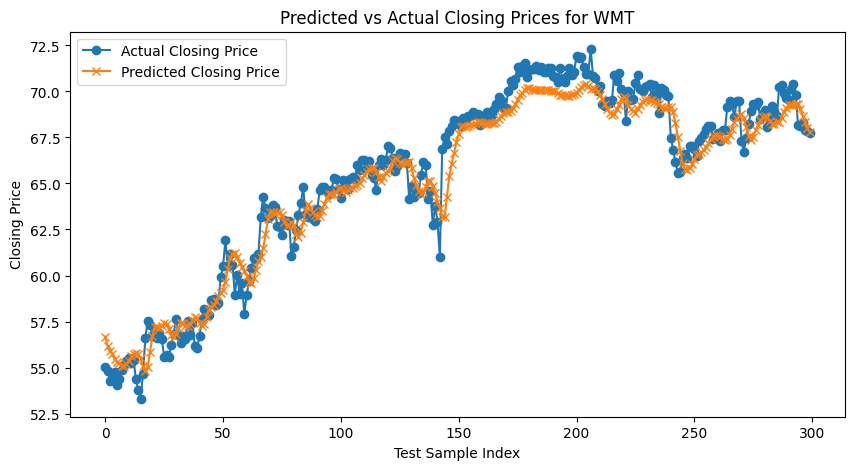

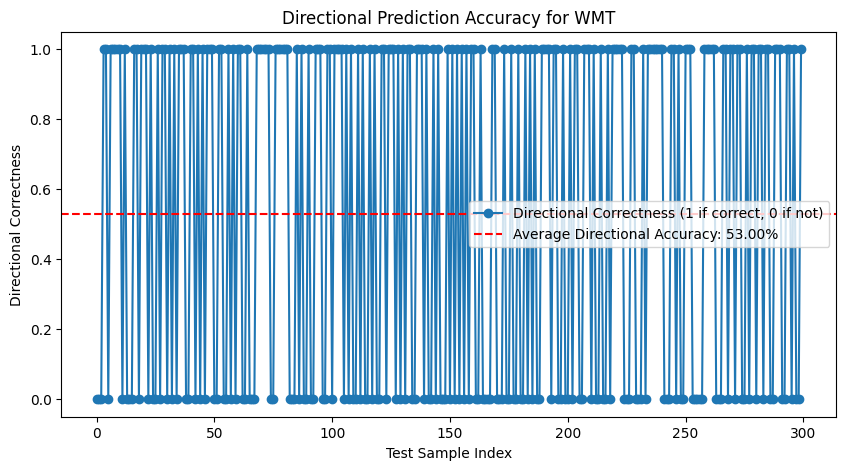

ROC AUC for WMT: 0.58


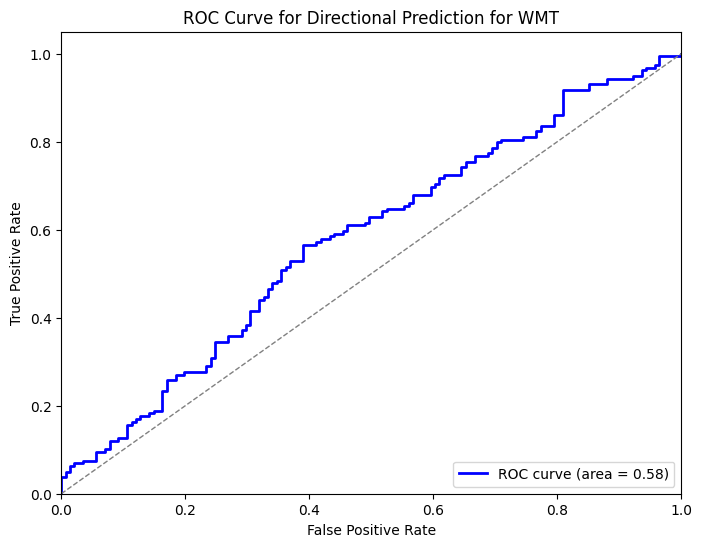


Processing ticker: XOM
Ticker: XOM - Total sequences created: 1500
Training samples: 900, Validation samples: 300, Testing samples: 300
Epoch 1/50


c:\Users\djleong01\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 3.6763e-04 - loss: 0.7102 - val_accuracy: 0.0000e+00 - val_loss: 0.6713
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 9.3237e-04 - loss: 0.6804 - val_accuracy: 0.0000e+00 - val_loss: 0.6393
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0012 - loss: 0.6508 - val_accuracy: 0.0000e+00 - val_loss: 0.6220
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0029 - loss: 0.6042 - val_accuracy: 0.0000e+00 - val_loss: 0.6300
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0025 - loss: 0.6012 - val_accuracy: 0.0000e+00 - val_loss: 0.6198
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0014 - loss: 0.5964 - val_accuracy: 0.0000e+00 - val_loss: 0.6191
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0043 - loss: 0.5880 - val_accuracy: 0.0000e+00 - val_loss: 0.6192
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0028 - loss: 0.5868 - val_acc

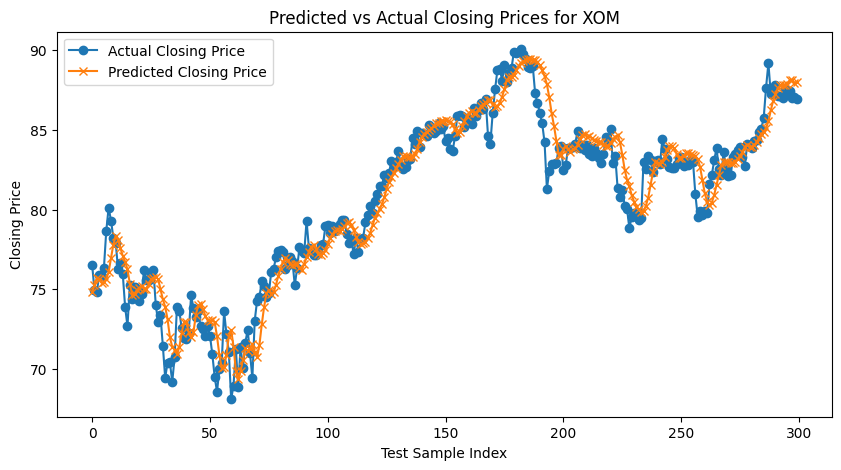

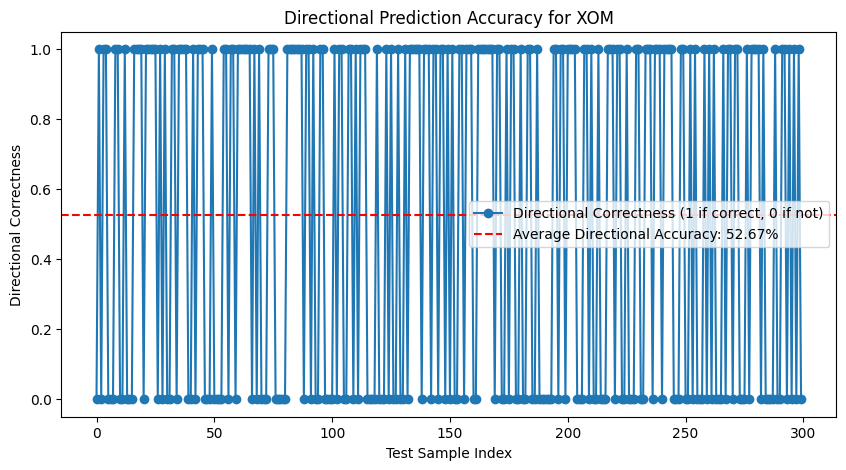

ROC AUC for XOM: 0.54


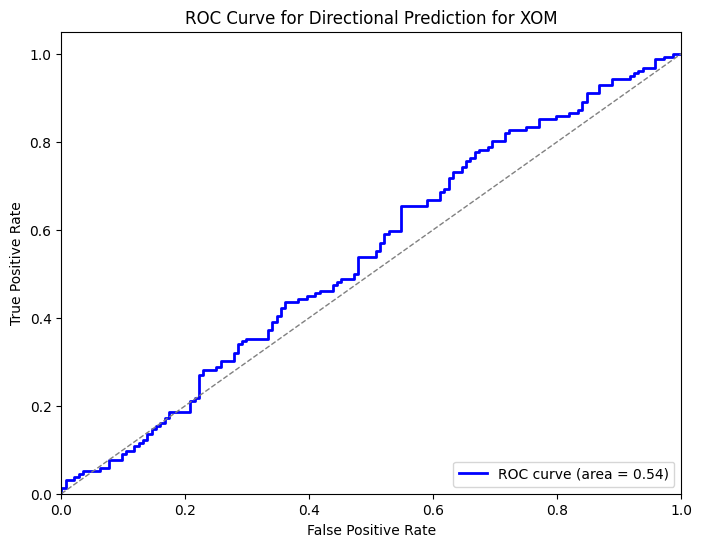

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_curve, auc

rolling_window = 10  

specific_ticker = None

# Training parameters
epochs = 50
batch_size = 32


data = pd.read_csv('../filtered_stocks_combined.csv') 

print("Loaded data with {} records.".format(len(data)))

data['Date'] = pd.to_datetime(data['Date'])
data.sort_values(['Date', 'index'], inplace=True)
print("Data sorted by 'Date' and 'index'.")
print(data.head())

def create_sequences(data_series, seq_length):
    xs, ys = [], []
    for i in range(len(data_series) - seq_length):
        x = data_series[i:(i + seq_length)]
        y = data_series[i + seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

def build_rnn_model(seq_length):
    model = Sequential([
        SimpleRNN(50, activation='relu', input_shape=(seq_length, 1)),
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

def process_ticker(ticker, df, rolling_window, epochs=10, batch_size=32, verbose=1):
    print("\n==============================")
    print("Processing ticker:", ticker)
    print("==============================")
    
    stock_data = df[df['ticker'].str.upper() == ticker.upper()].copy()
    stock_data.sort_values(['Date', 'index'], inplace=True)
    
    if stock_data.shape[0] < rolling_window + 1:
        print(f"Not enough data for ticker {ticker} to create sequences.")
        return None
    
    scaler = MinMaxScaler()
    stock_data['Close_Scaled'] = scaler.fit_transform(stock_data['Close'].values.reshape(-1, 1))
    
    prices = stock_data['Close_Scaled'].values
    X, y = create_sequences(prices, rolling_window)
    X = X.reshape((X.shape[0], rolling_window, 1))
    
    print(f"Ticker: {ticker} - Total sequences created: {X.shape[0]}")

    total_samples = len(X)
    train_end = int(total_samples * 0.6)
    val_end = train_end + int(total_samples * 0.2)
    X_train, X_val, X_test = X[:train_end], X[train_end:val_end], X[val_end:]
    y_train, y_val, y_test = y[:train_end], y[train_end:val_end], y[val_end:]
    print(f"Training samples: {X_train.shape[0]}, Validation samples: {X_val.shape[0]}, Testing samples: {X_test.shape[0]}")
    
    model = build_rnn_model(rolling_window)
    history = model.fit(X_train, y_train, 
                        validation_data=(X_val, y_val),
                        epochs=epochs, 
                        batch_size=batch_size, 
                        verbose=verbose)
    
    predictions_scaled = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions_scaled)
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    mean_squared_error_value = mean_squared_error(y_test_actual, predictions)
    print(f"Mean Squared Error for {ticker}: {mean_squared_error_value:.4f}")
    
    
    direction_correct = []
    actual_labels = []      
    predicted_scores = []   
    
    for i in range(len(X_test)):
        last_val = X_test[i, -1, 0]
        pred_diff = predictions_scaled[i, 0] - last_val 
        actual_diff = y_test[i] - last_val
        
        if (pred_diff > 0 and actual_diff > 0) or (pred_diff < 0 and actual_diff < 0):
            direction_correct.append(1)
        else:
            direction_correct.append(0)
        
        actual_labels.append(1 if actual_diff > 0 else 0)
        predicted_scores.append(pred_diff)
        
    direction_correct = np.array(direction_correct)
    directional_accuracy = np.mean(direction_correct) * 100
    print(f"Directional Accuracy for {ticker}: {directional_accuracy:.2f}%")
    
    plt.figure(figsize=(10, 5))
    plt.plot(y_test_actual, label='Actual Closing Price', marker='o')
    plt.plot(predictions, label='Predicted Closing Price', marker='x')
    plt.title(f'Predicted vs Actual Closing Prices for {ticker}')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(direction_correct, 'o-', label='Directional Correctness (1 if correct, 0 if not)')
    plt.axhline(np.mean(direction_correct), color='red', linestyle='--', 
                label=f'Average Directional Accuracy: {directional_accuracy:.2f}%')
    plt.xlabel('Test Sample Index')
    plt.ylabel('Directional Correctness')
    plt.title(f'Directional Prediction Accuracy for {ticker}')
    plt.legend()
    plt.show()
    
    fpr, tpr, thresholds = roc_curve(actual_labels, predicted_scores)
    roc_auc = auc(fpr, tpr)
    print(f"ROC AUC for {ticker}: {roc_auc:.2f}")
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Directional Prediction for {ticker}')
    plt.legend(loc="lower right")
    plt.show()

if specific_ticker is None:
    tickers = data['ticker'].unique()
    print("Processing all tickers:\n", tickers)
    for ticker in tickers:
        process_ticker(ticker, data, rolling_window, epochs, batch_size)
else:
    print("Processing specific ticker:", specific_ticker)
    process_ticker(specific_ticker, data, rolling_window, epochs, batch_size)
